In [1]:
import warnings
warnings.filterwarnings("ignore")

import numpy as np
import pandas as pd
import yfinance as yf
import datetime as dt
import matplotlib.pyplot as plt
import pyfolio as pf
from nsepy import get_history
from datetime import date
from nsetools import Nse

In [32]:
# data = get_history(symbol="SBIN", start=date(2022,1,1), end=date(2022,1,31))

In [ ]:
# start = pd.to_datetime('2022-01-01')
# end = pd.to_datetime('2022-07-31')
# symbol = 'MSFT'
# data1 = yf.download(symbol, start=start, end=end)

In [2]:
# data1

In [10]:
class FinancialData:
   # initialize function
   def __init__(self, symbol='TSLA', end=dt.datetime.today(), days=168):
       self.symbol = symbol
       self.start = end - pd.Timedelta(days=days)
       self.end = end
#        print(self.start, self.end)
       self.retrieve_data(self.symbol, self.start, self.end)
       self.prepare_data()
  
   # function call to retrieve daily data
   def retrieve_data(self, symbol, start, end):
#        self.data = yf.download(symbol, start=start, end=end)
       self.data = get_history(symbol, start=start, end=end)
       self.data['Adj Close'] = self.data['Close']
  
   # preparing data - adding daily returns and buy/hold returns column
   def prepare_data(self):
       self.data['daily_returns'] = np.log(self.data['Adj Close'] / self.data['Adj Close'].shift(1))
       self.data['bnh_returns'] =  self.data['daily_returns'].cumsum()
       self.data.dropna(inplace=True)
      
   # function to plot a list of attributes in the pandas data frame
   def plot_data(self, attribute_list):
       self.data[attribute_list].plot()
       plt.show()
        
   # plotting strategy returns
   def plot_strategy_returns(self):
       self.plot_data(['bnh_returns', 'strategy_returns'])
      
   # function to create a simple tear sheet using pyfolio
   def create_simple_tear_sheet(self):
       pf.display(pf.create_simple_tear_sheet(self.data['strategy_returns'].diff()))

In [11]:
class BollingerBandBacktester(FinancialData):
    def prepare_indicators(self, window):
        self.data['moving_avg'] = \
        self.data['Adj Close'].rolling(window=window).mean()
        self.data['moving_std'] = \
        self.data['Adj Close'].rolling(window=window).std()

    def backtest_strategy(self, window, start=None):
        self.prepare_indicators(window)
        self.data['upper_band'] = \
        self.data['moving_avg'] + 2 * self.data['moving_std']
        self.data['lower_band'] = \
        self.data['moving_avg'] - 2 * self.data['moving_std']

        if start is None:
            start = window

        # BUY condition
        self.data['signal'] = \
        np.where((self.data['Adj Close'] < self.data['lower_band']) &
                 (self.data['Adj Close'].shift(1) >= self.data['lower_band']), 1, 0)

        # SELL condition
        self.data['signal'] = \
        np.where((self.data['Adj Close'] > self.data['upper_band']) &
                 (self.data['Adj Close'].shift(1) <= self.data['upper_band']), -1,
                  self.data['signal'])

        self.data['position'] = self.data['signal'].replace(to_replace=0, method='ffill')
        self.data['position'] = self.data['position'].shift()

        self.data['strategy_returns'] = self.data['position'] * self.data['daily_returns']

        performance = self.data[['daily_returns', 'strategy_returns']].iloc[start:].sum()

        self.data['strategy_returns'] = self.data['strategy_returns'].cumsum()
        return performance

    def optimize_bollinger_band_parameters(self, windows):
        start = max(windows)
        self.results = pd.DataFrame()
        for window in windows:
            perf = self.backtest_strategy(window=window, start=start)
            self.result = pd.DataFrame({'Window': window,
                                        'bnh returns': perf['daily_returns'],
                                        'strategy returns': perf['strategy_returns']}, 
                                         index=[0, ])
            self.results = self.results.append(self.result, ignore_index=True)
        self.results.sort_values(by='strategy returns', inplace=True, ascending=False)
        self.results = self.results.reset_index()
        self.results = self.results.drop("index", axis=1)
        print(self.results.head())

    def plot_optimized_bollinger_strategy_returns(self):
        if (len(self.results)) > 0:
            window = self.results.loc[0, 'Window']
            print("Window:", window)
            self.backtest_strategy(window=window)
            self.plot_strategy_returns()

SYMBOL
2022-10-14 22:49:11.106970
   Window  bnh returns  strategy returns
0       1          0.0               0.0
1      45          0.0               0.0
2      33          0.0               0.0
3      34          0.0               0.0
4      35          0.0               0.0
Window: 1
fail
20MICRONS
2022-10-14 22:49:11.332476
   Window  bnh returns  strategy returns
0      34     0.055479          0.696933
1      33     0.055479          0.613713
2      58     0.055479          0.568987
3      57     0.055479          0.568987
4      56     0.055479          0.568987
Window: 34


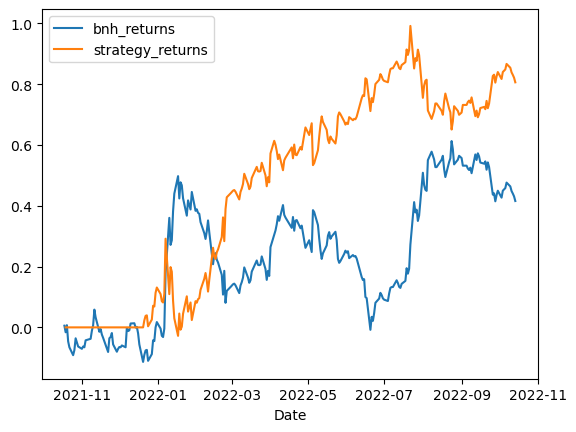

21STCENMGM
2022-10-14 22:49:13.133356
   Window  bnh returns  strategy returns
0      13    -0.725868          0.211888
1       9    -0.725868          0.090225
2       1    -0.725868          0.000000
3       3    -0.725868          0.000000
4       4    -0.725868          0.000000
Window: 13


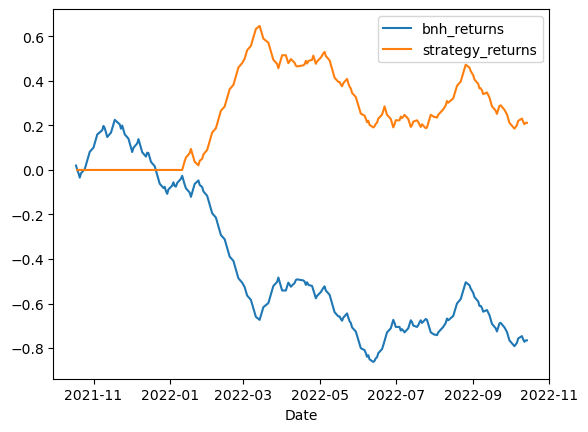

3IINFOLTD
2022-10-14 22:49:16.457476
   Window  bnh returns  strategy returns
0       1          0.0               0.0
1      45          0.0               0.0
2      33          0.0               0.0
3      34          0.0               0.0
4      35          0.0               0.0
Window: 1
fail
3MINDIA
2022-10-14 22:49:18.354285
   Window  bnh returns  strategy returns
0      56    -0.105562          0.046960
1      55    -0.105562          0.046960
2      58    -0.105562          0.033786
3      57    -0.105562          0.033786
4      59    -0.105562          0.032236
Window: 56


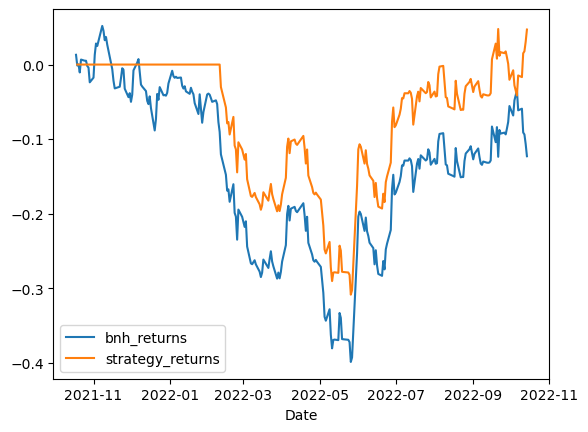

3PLAND
2022-10-14 22:49:20.149280
   Window  bnh returns  strategy returns
0      10    -0.190248          0.776861
1      11    -0.190248          0.717937
2       8    -0.190248          0.574815
3       9    -0.190248          0.574815
4      12    -0.190248          0.456697
Window: 10


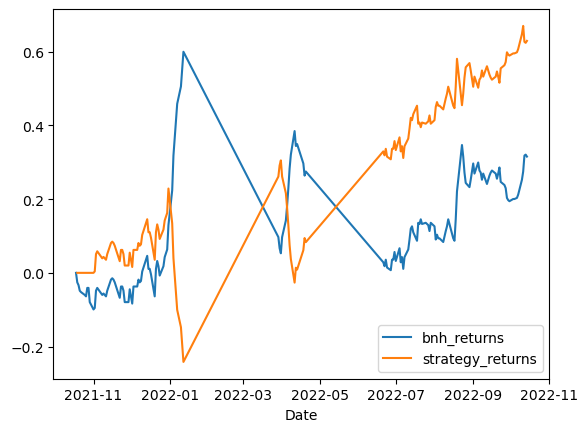

4THDIM
2022-10-14 22:49:22.506661
   Window  bnh returns  strategy returns
0       1          0.0               0.0
1      45          0.0               0.0
2      33          0.0               0.0
3      34          0.0               0.0
4      35          0.0               0.0
Window: 1
fail
5PAISA
2022-10-14 22:49:24.785903
   Window  bnh returns  strategy returns
0       6    -0.239556          0.532695
1       7    -0.239556          0.297383
2      12    -0.239556          0.200444
3      10    -0.239556          0.200444
4      11    -0.239556          0.200444
Window: 6


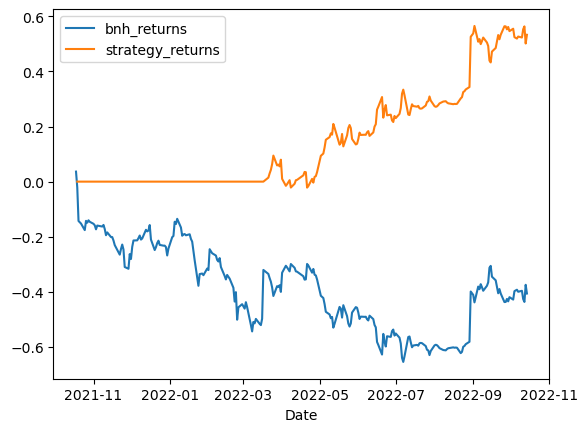

63MOONS
2022-10-14 22:49:27.684514
   Window  bnh returns  strategy returns
0      13    -0.584879          1.311009
1      14    -0.584879          1.311009
2      17    -0.584879          1.248306
3      33    -0.584879          1.195553
4      29    -0.584879          1.195553
Window: 13


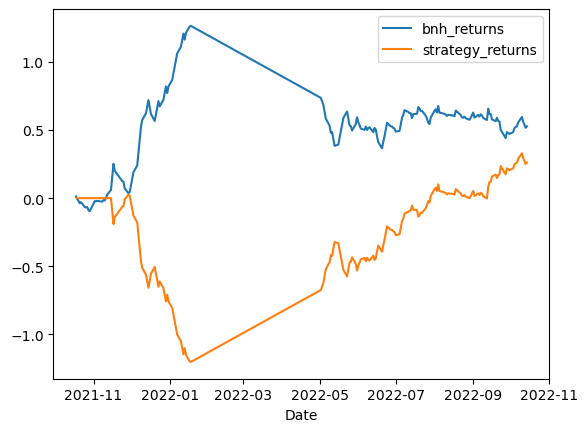

A2ZINFRA
2022-10-14 22:49:29.921413
   Window  bnh returns  strategy returns
0      30     0.206921          0.787021
1      31     0.206921          0.787021
2      26     0.206921          0.743636
3      27     0.206921          0.743636
4      28     0.206921          0.743636
Window: 30


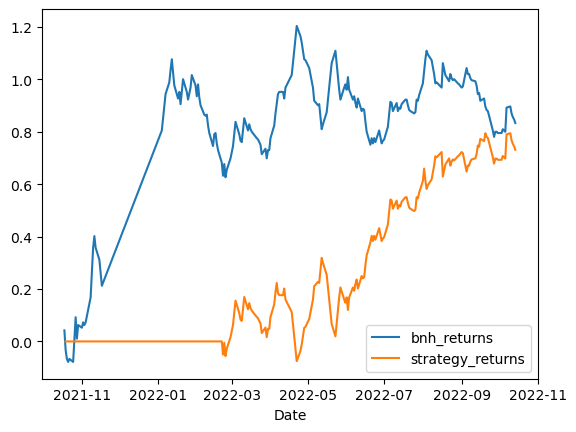

AAKASH
2022-10-14 22:49:32.285124
   Window  bnh returns  strategy returns
0      17    -2.936948          2.286531
1      16    -2.936948          2.184272
2      15    -2.936948          2.004027
3      14    -2.936948          1.932163
4      13    -2.936948          1.833735
Window: 17


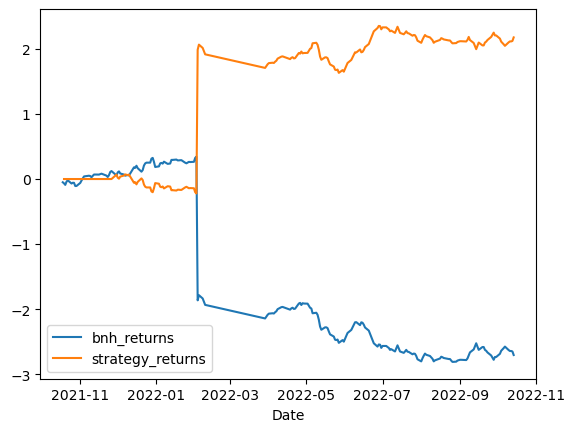

AAREYDRUGS
2022-10-14 22:49:33.819832
   Window  bnh returns  strategy returns
0      21    -0.310155          0.694184
1      23    -0.310155          0.671053
2      22    -0.310155          0.640490
3      20    -0.310155          0.620916
4      19    -0.310155          0.620916
Window: 21


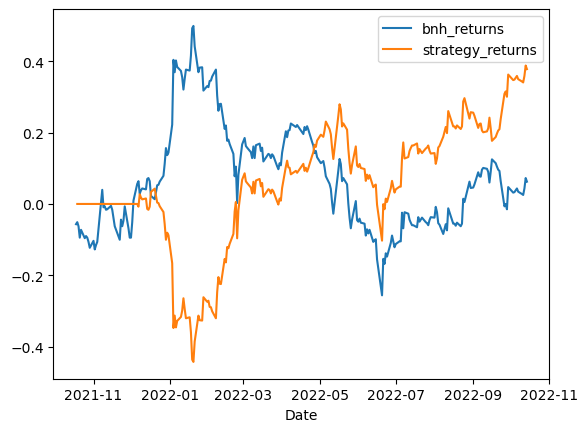

AARON
2022-10-14 22:49:35.602910
   Window  bnh returns  strategy returns
0      35      0.30168          0.097964
1      34      0.30168          0.097964
2      33      0.30168          0.097964
3      32      0.30168          0.097964
4      31      0.30168          0.097964
Window: 35


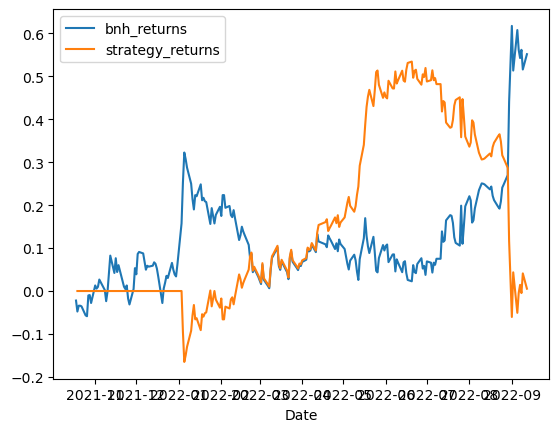

AARTIDRUGS
2022-10-14 22:49:37.208152
   Window  bnh returns  strategy returns
0      12    -0.139068          0.859042
1      13    -0.139068          0.804206
2      11    -0.139068          0.777833
3      10    -0.139068          0.726035
4      37    -0.139068          0.561606
Window: 12


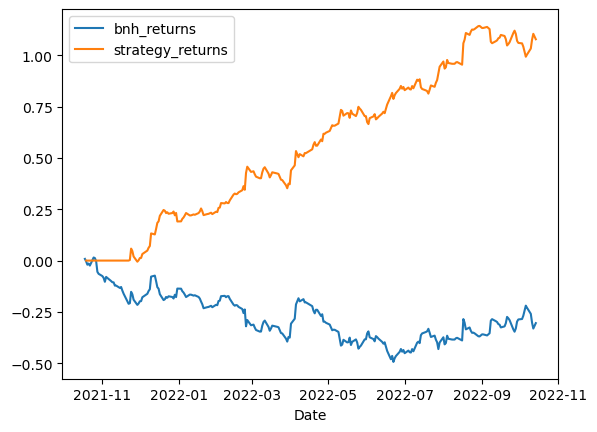

AARTIIND
2022-10-14 22:49:38.994682
   Window  bnh returns  strategy returns
0      47    -0.329539          0.300216
1      46    -0.329539          0.300216
2      48    -0.329539          0.300216
3      45    -0.329539          0.300216
4      33    -0.329539          0.237543
Window: 47


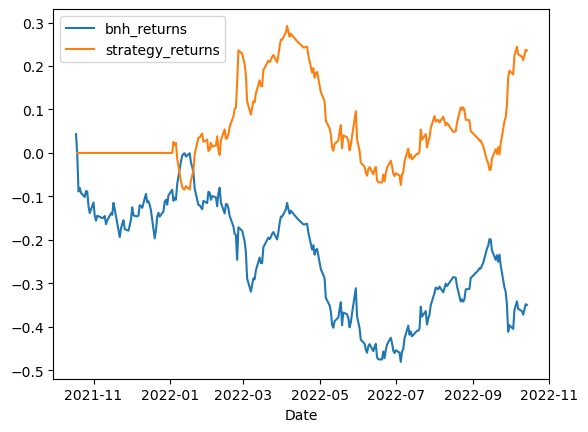

AARTISURF
2022-10-14 22:49:40.956949
   Window  bnh returns  strategy returns
0      45    -0.299967          0.666875
1      44    -0.299967          0.666875
2      43    -0.299967          0.666875
3      42    -0.299967          0.596510
4      41    -0.299967          0.596510
Window: 45


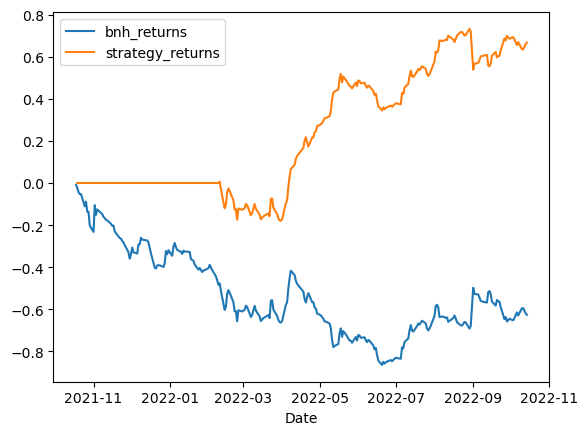

AARVEEDEN
2022-10-14 22:49:42.725655
   Window  bnh returns  strategy returns
0      50     -0.13942          1.121197
1      44     -0.13942          1.069988
2      43     -0.13942          1.069988
3      45     -0.13942          1.069988
4      49     -0.13942          1.014125
Window: 50


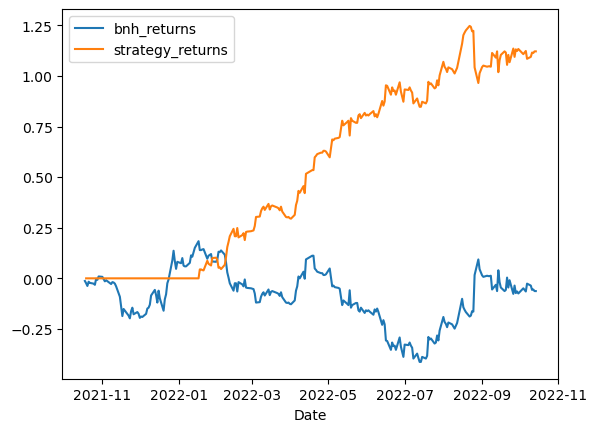

AARVI
2022-10-14 22:49:44.554782
   Window  bnh returns  strategy returns
0      35     0.526821          0.183221
1      43     0.526821          0.183221
2      36     0.526821          0.183221
3      37     0.526821          0.183221
4      38     0.526821          0.183221
Window: 35


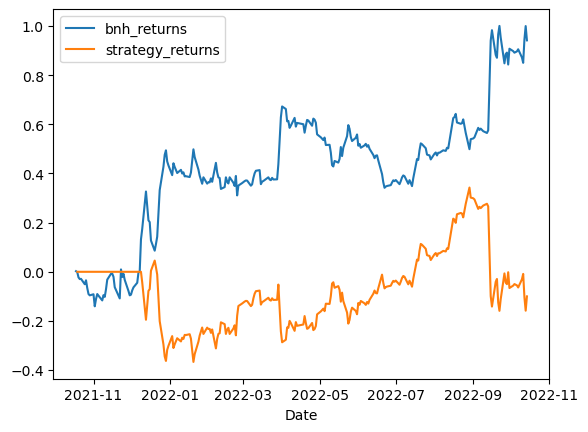

AAVAS
2022-10-14 22:49:46.136096
   Window  bnh returns  strategy returns
0       7    -0.274899          0.594200
1       8    -0.274899          0.451215
2      59    -0.274899          0.448909
3      58    -0.274899          0.448909
4      57    -0.274899          0.379483
Window: 7


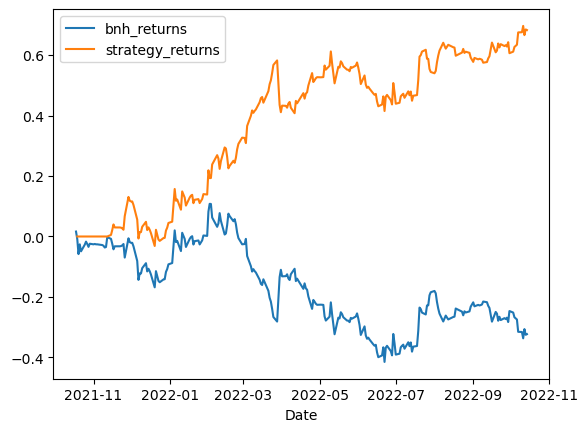

ABAN
2022-10-14 22:49:48.753355
   Window  bnh returns  strategy returns
0      59      0.06762          0.828701
1      54      0.06762          0.828701
2      49      0.06762          0.828701
3      51      0.06762          0.828701
4      52      0.06762          0.828701
Window: 59


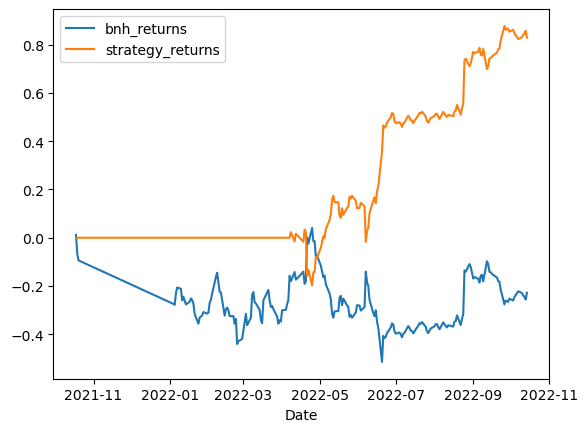

ABB
2022-10-14 22:49:50.548489
   Window  bnh returns  strategy returns
0      15     0.336798          0.509384
1      16     0.336798          0.446640
2      14     0.336798          0.394217
3      13     0.336798          0.325196
4      17     0.336798          0.276511
Window: 15


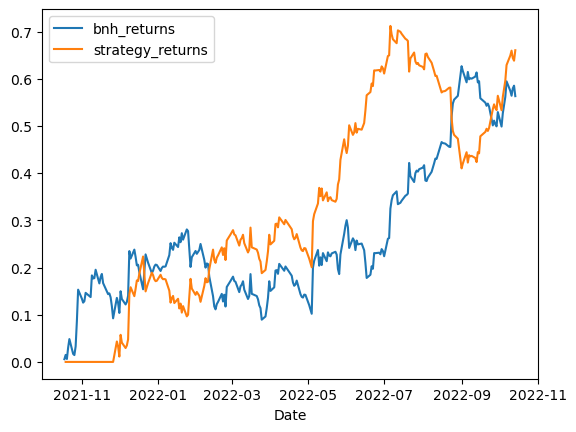

ABBOTINDIA
2022-10-14 22:49:52.319180
   Window  bnh returns  strategy returns
0      27    -0.012757          0.289095
1      26    -0.012757          0.275921
2      25    -0.012757          0.275921
3      28    -0.012757          0.268482
4      59    -0.012757          0.209489
Window: 27


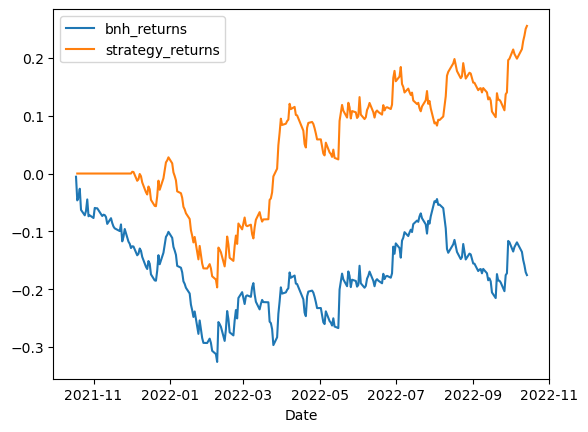

ABCAPITAL
2022-10-14 22:50:01.026682
   Window  bnh returns  strategy returns
0      48    -0.187089          0.930556
1      47    -0.187089          0.883307
2      46    -0.187089          0.883307
3      45    -0.187089          0.827506
4      55    -0.187089          0.697403
Window: 48


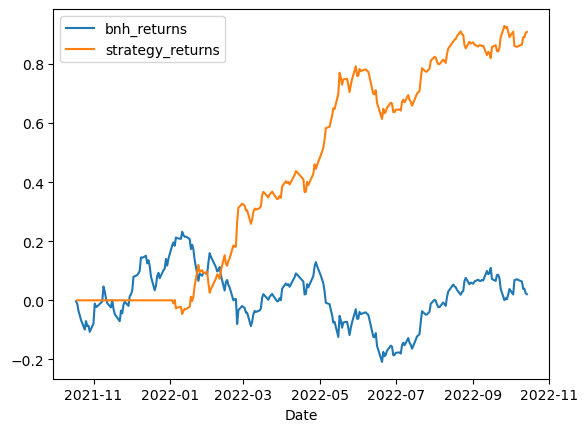

ABFRL
2022-10-14 22:50:03.720411
   Window  bnh returns  strategy returns
0      51     0.111585          0.789549
1      47     0.111585          0.687046
2      48     0.111585          0.687046
3      49     0.111585          0.687046
4      50     0.111585          0.687046
Window: 51


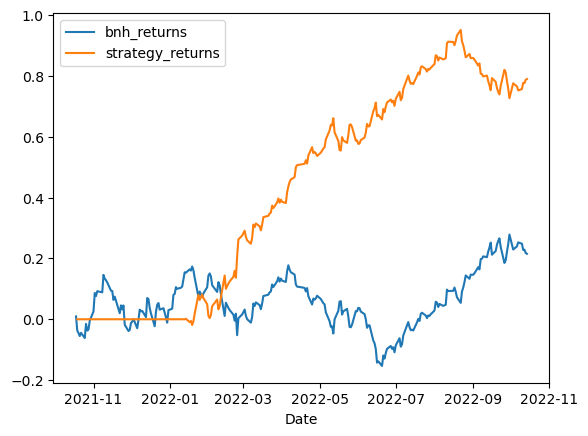

ABMINTLLTD
2022-10-14 22:50:05.728413
   Window  bnh returns  strategy returns
0      22    -0.054658          0.553517
1      20    -0.054658          0.553517
2      21    -0.054658          0.553517
3      16    -0.054658          0.521669
4      15    -0.054658          0.521669
Window: 22


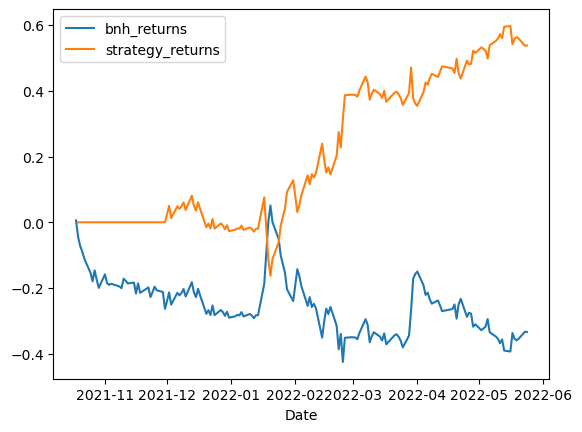

ABSLAMC
2022-10-14 22:50:07.134777
   Window  bnh returns  strategy returns
0       8    -0.229554          0.394221
1      10    -0.229554          0.384386
2       9    -0.229554          0.352055
3      11    -0.229554          0.266129
4      59    -0.229554          0.188449
Window: 8


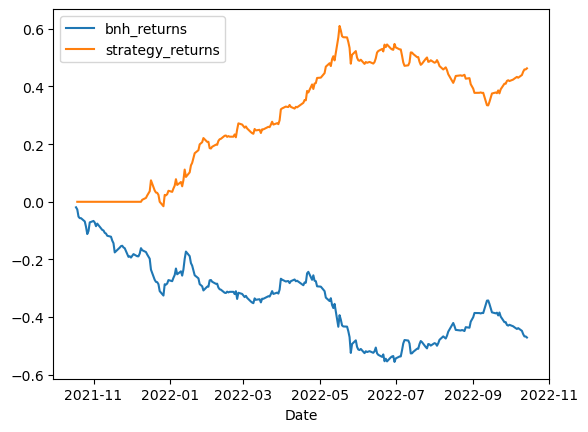

ACC
2022-10-14 22:50:08.634058
   Window  bnh returns  strategy returns
0      18    -0.033528          0.380192
1      48    -0.033528          0.352910
2      17    -0.033528          0.324339
3      16    -0.033528          0.324339
4      15    -0.033528          0.305688
Window: 18


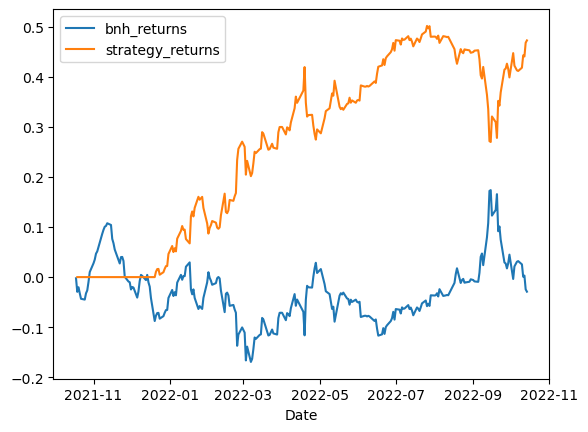

ACCELYA
2022-10-14 22:50:12.665129
   Window  bnh returns  strategy returns
0       7    -0.036867          0.393119
1      51    -0.036867          0.330047
2      54    -0.036867          0.330047
3      48    -0.036867          0.330047
4      49    -0.036867          0.330047
Window: 7


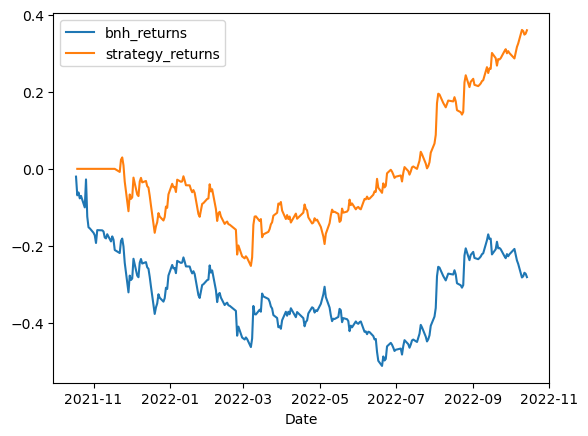

ACCURACY
2022-10-14 22:50:14.451090
   Window  bnh returns  strategy returns
0       9     0.198885          0.836924
1      29     0.198885          0.812198
2      26     0.198885          0.769624
3      27     0.198885          0.769624
4      28     0.198885          0.769624
Window: 9


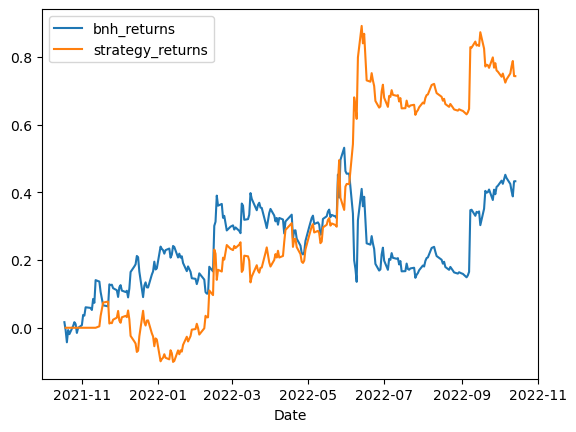

ACE
2022-10-14 22:50:16.250837
   Window  bnh returns  strategy returns
0      22     0.175641          0.564302
1      21     0.175641          0.564302
2      17     0.175641          0.509601
3      20     0.175641          0.465138
4       8     0.175641          0.455065
Window: 22


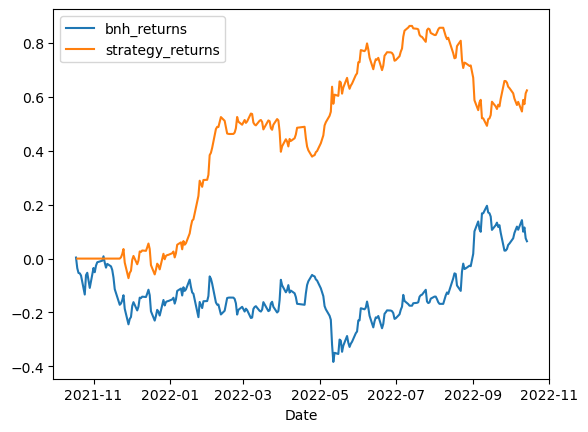

ACRYSIL
2022-10-14 22:50:18.103985
   Window  bnh returns  strategy returns
0      52    -0.353708          0.836168
1      53    -0.353708          0.836168
2      49    -0.353708          0.815229
3      47    -0.353708          0.815229
4      48    -0.353708          0.815229
Window: 52


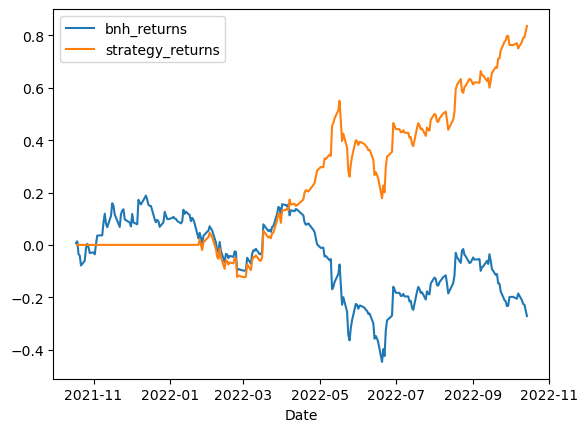

ADANIENT
2022-10-14 22:50:19.791541
   Window  bnh returns  strategy returns
0      16     0.605015          0.643294
1      15     0.605015          0.339726
2      22     0.605015          0.339726
3      11     0.605015          0.339119
4      14     0.605015          0.277815
Window: 16


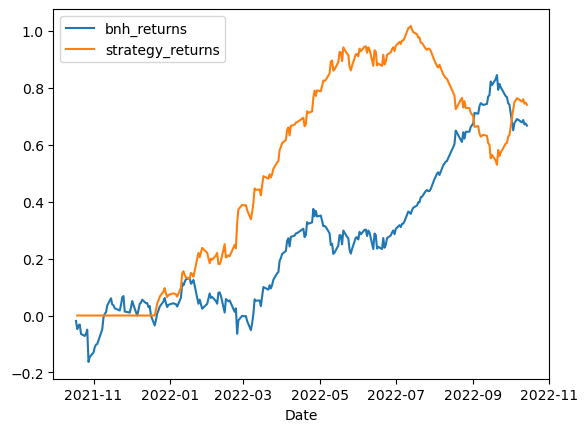

ADANIGREEN
2022-10-14 22:50:23.009019
   Window  bnh returns  strategy returns
0      35     0.345707          0.370337
1      34     0.345707          0.348262
2      30     0.345707          0.343364
3      33     0.345707          0.257474
4      32     0.345707          0.257474
Window: 35


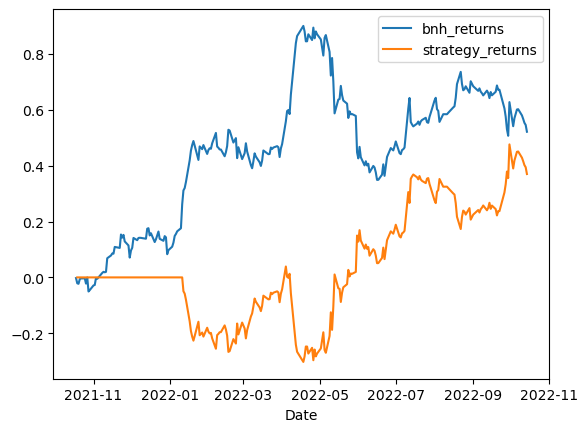

ADANIPORTS
2022-10-14 22:50:25.556286
   Window  bnh returns  strategy returns
0      33     0.054327          0.549746
1      32     0.054327          0.549746
2      24     0.054327          0.446369
3      25     0.054327          0.446369
4      30     0.054327          0.392374
Window: 33


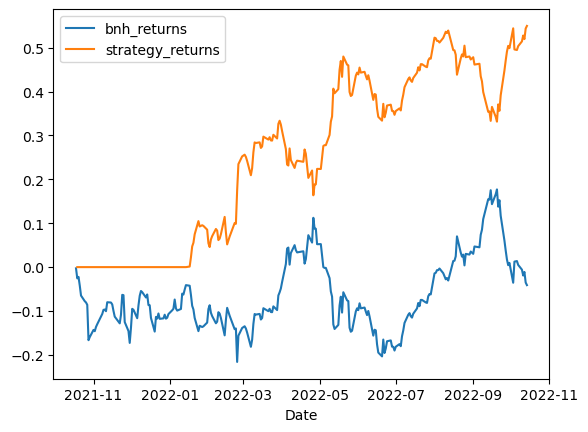

ADANIPOWER
2022-10-14 22:50:28.131562
   Window  bnh returns  strategy returns
0       1     1.268967               0.0
1       2     1.268967               0.0
2       3     1.268967               0.0
3       4     1.268967               0.0
4       5     1.268967               0.0
Window: 1


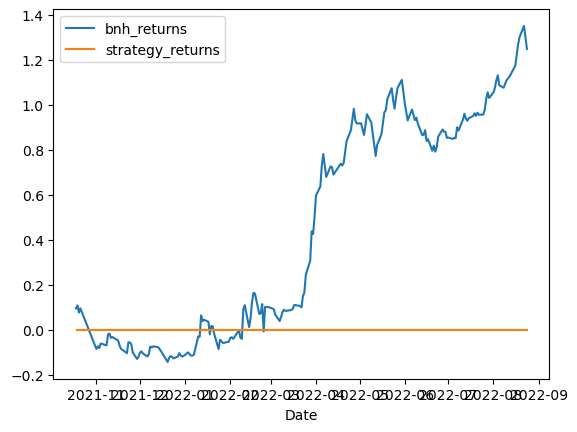

ADANITRANS
2022-10-14 22:50:29.882336
   Window  bnh returns  strategy returns
0      59     0.326135          0.401999
1      58     0.326135          0.401999
2      57     0.326135          0.401999
3      54     0.326135          0.339742
4      52     0.326135          0.339742
Window: 59


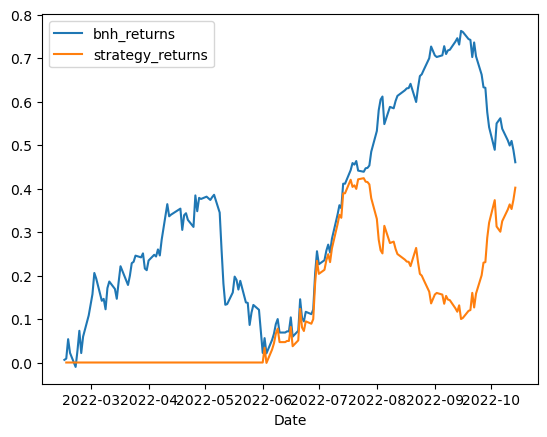

ADFFOODS
2022-10-14 22:50:31.364424
   Window  bnh returns  strategy returns
0      29    -0.191959          0.766823
1      28    -0.191959          0.739741
2      39    -0.191959          0.708028
3      47    -0.191959          0.707408
4      50    -0.191959          0.664404
Window: 29


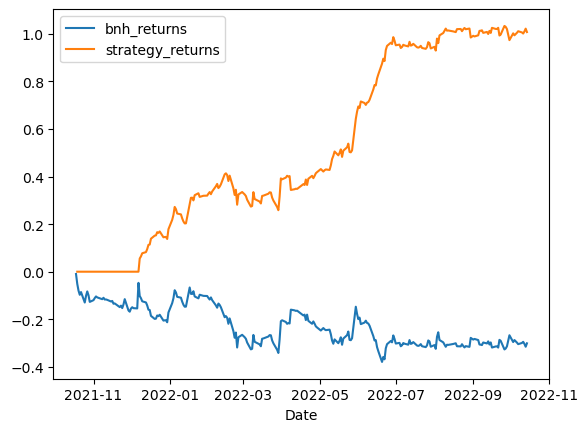

ADL
2022-10-14 22:50:33.665021
   Window  bnh returns  strategy returns
0       1          0.0               0.0
1      45          0.0               0.0
2      33          0.0               0.0
3      34          0.0               0.0
4      35          0.0               0.0
Window: 1
fail
ADORWELD
2022-10-14 22:50:35.626496
   Window  bnh returns  strategy returns
0      41     0.187622          0.350150
1      19     0.187622          0.271525
2      20     0.187622          0.271525
3      21     0.187622          0.271525
4      13     0.187622          0.162773
Window: 41


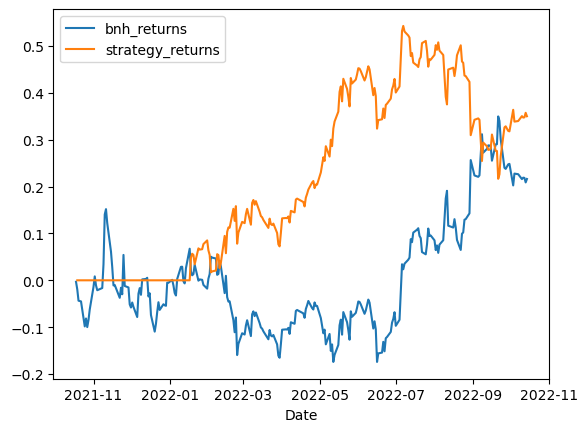

ADROITINFO
2022-10-14 22:50:37.479750
   Window  bnh returns  strategy returns
0      30     0.500941          0.790231
1      54     0.500941          0.790231
2      29     0.500941          0.790231
3      31     0.500941          0.790231
4      32     0.500941          0.790231
Window: 30


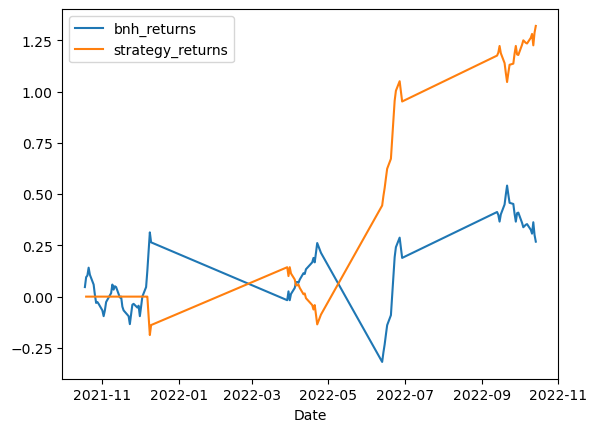

ADSL
2022-10-14 22:50:38.935525
   Window  bnh returns  strategy returns
0      30    -0.470721          0.968784
1      31    -0.470721          0.968784
2      33    -0.470721          0.868042
3      27    -0.470721          0.856517
4      28    -0.470721          0.856517
Window: 30


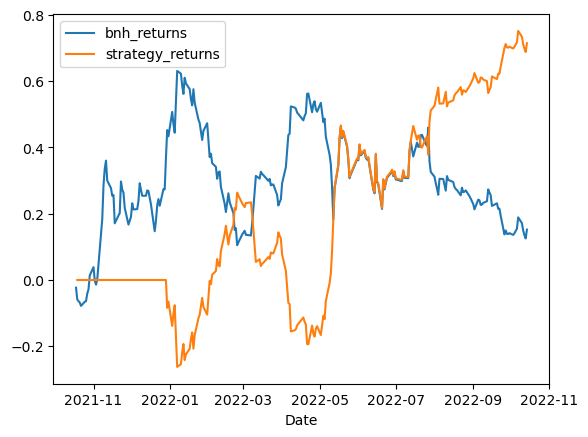

ADVANIHOTR
2022-10-14 22:50:40.682284
   Window  bnh returns  strategy returns
0      59     0.034606          0.163879
1      58     0.034606          0.032927
2      57     0.034606          0.032927
3      56     0.034606          0.032927
4      55     0.034606          0.032927
Window: 59


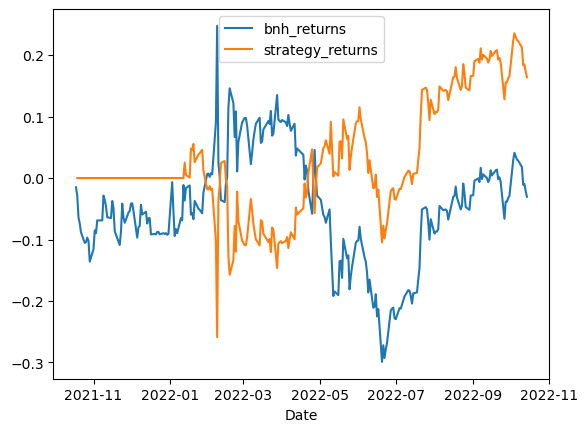

ADVENZYMES
2022-10-14 22:50:42.376195
   Window  bnh returns  strategy returns
0      23    -0.217473          1.076746
1      22    -0.217473          1.076746
2      25    -0.217473          1.020738
3      21    -0.217473          0.962871
4      26    -0.217473          0.932952
Window: 23


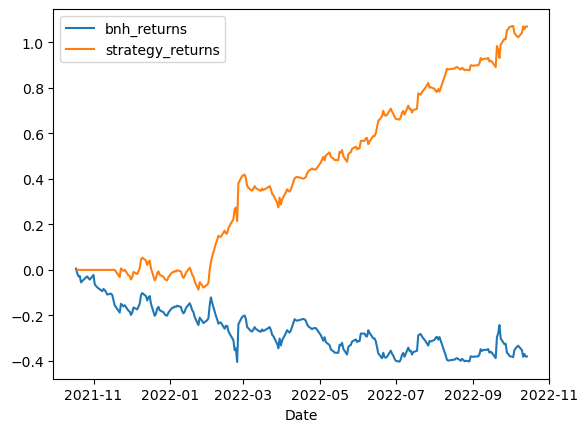

AEGISCHEM
2022-10-14 22:50:44.296802
   Window  bnh returns  strategy returns
0      14     0.250483          0.554172
1      31     0.250483          0.483030
2      21     0.250483          0.478285
3      29     0.250483          0.463407
4      28     0.250483          0.463407
Window: 14


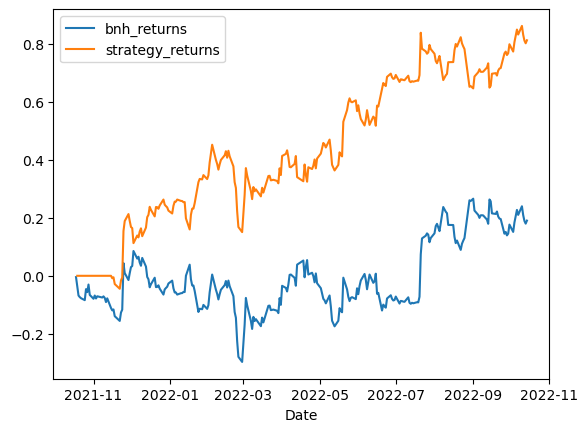

AETHER
2022-10-14 22:50:46.183770
   Window  bnh returns  strategy returns
0       9     0.122797          0.074702
1       6     0.122797          0.037559
2      59     0.122797          0.033144
3      46     0.122797          0.033144
4      34     0.122797          0.033144
Window: 9


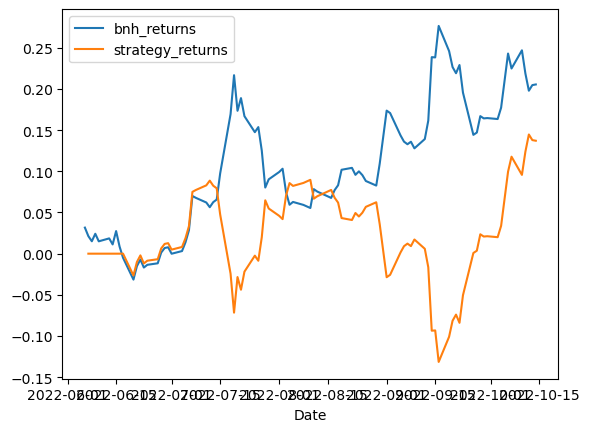

AFFLE
2022-10-14 22:50:48.826025
   Window  bnh returns  strategy returns
0      55    -0.108132          0.106510
1      47    -0.108132          0.086855
2      54    -0.108132          0.086855
3      53    -0.108132          0.086855
4      52    -0.108132          0.086855
Window: 55


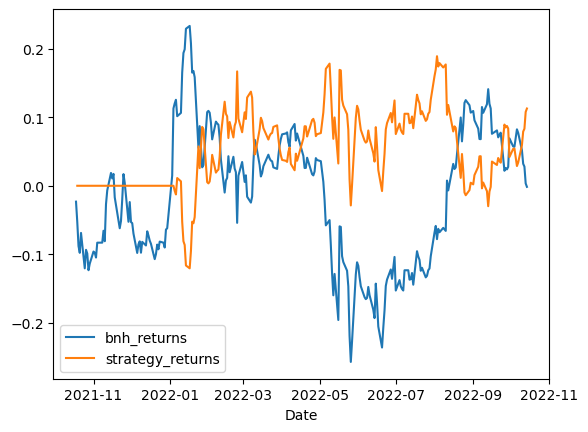

AGARIND
2022-10-14 22:50:50.485115
   Window  bnh returns  strategy returns
0      38      0.36028          1.064268
1      37      0.36028          0.982273
2      35      0.36028          0.982273
3      36      0.36028          0.982273
4      33      0.36028          0.703912
Window: 38


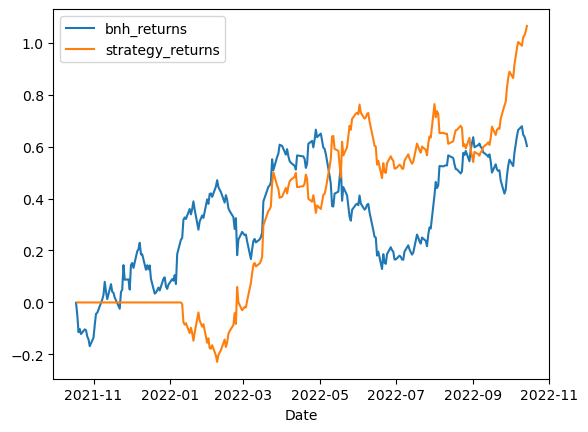

AGI
2022-10-14 22:50:52.586481
   Window  bnh returns  strategy returns
0      28      0.35738          0.145613
1      27      0.35738          0.145613
2      23      0.35738          0.008366
3      26      0.35738          0.008366
4      25      0.35738          0.008366
Window: 28


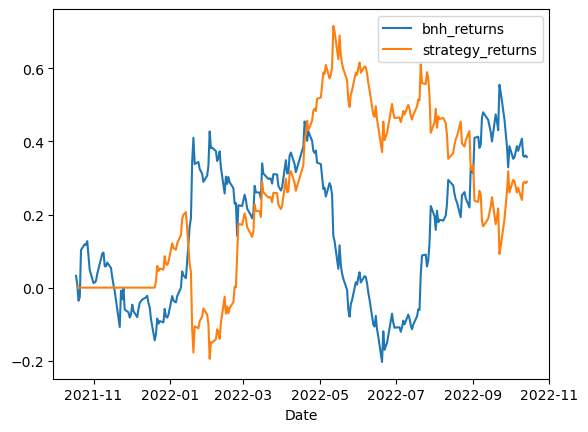

AGRITECH
2022-10-14 22:50:55.250801
   Window  bnh returns  strategy returns
0       6    -0.226906          0.941858
1       7    -0.226906          0.941858
2      19    -0.226906          0.917255
3      18    -0.226906          0.917255
4      17    -0.226906          0.917255
Window: 6


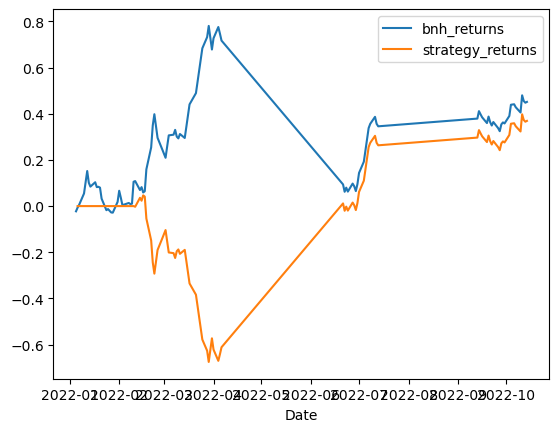

AGROPHOS
2022-10-14 22:50:56.806346
   Window  bnh returns  strategy returns
0      38     0.305891          0.854204
1      31     0.305891          0.854204
2      34     0.305891          0.854204
3      35     0.305891          0.854204
4      36     0.305891          0.854204
Window: 38


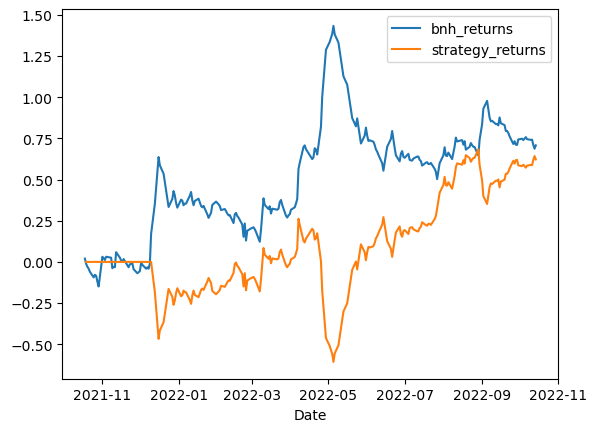

AGSTRA
2022-10-14 22:50:58.350911
   Window  bnh returns  strategy returns
0      30    -0.370433          0.944234
1      35    -0.370433          0.944234
2      34    -0.370433          0.944234
3      33    -0.370433          0.944234
4      32    -0.370433          0.944234
Window: 30


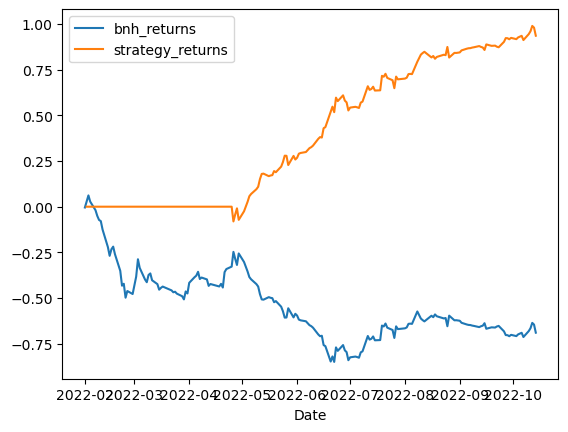

AHLADA
2022-10-14 22:50:59.843530
   Window  bnh returns  strategy returns
0       1    -0.096887               0.0
1       3    -0.096887               0.0
2       4    -0.096887               0.0
3       5    -0.096887               0.0
4       2    -0.096887               0.0
Window: 1


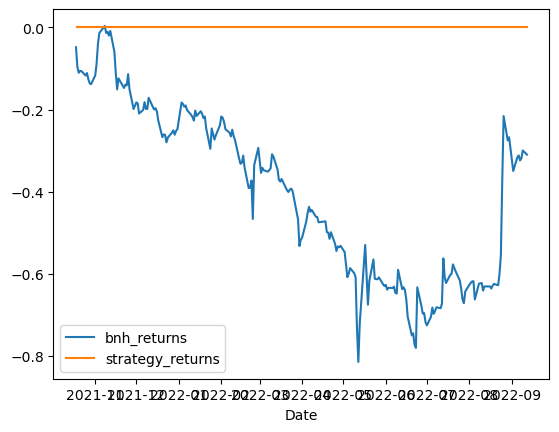

AHLEAST
2022-10-14 22:51:06.344110
   Window  bnh returns  strategy returns
0      13     0.604759          0.279770
1      14     0.604759          0.129929
2      12     0.604759          0.119262
3      11     0.604759          0.096047
4       9     0.604759          0.085215
Window: 13


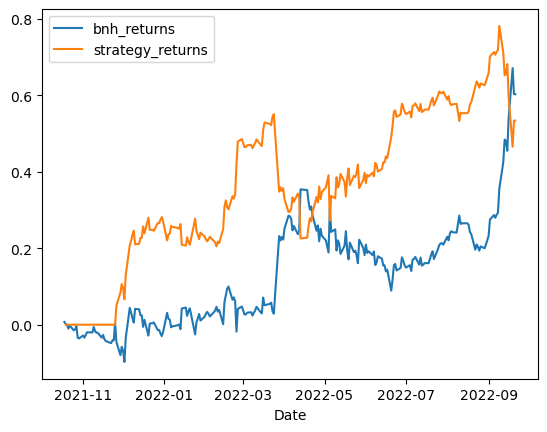

AHLUCONT
2022-10-14 22:51:07.965132
   Window  bnh returns  strategy returns
0      58      0.02247          0.592136
1      48      0.02247          0.549629
2      49      0.02247          0.549629
3      40      0.02247          0.549629
4      39      0.02247          0.549629
Window: 58


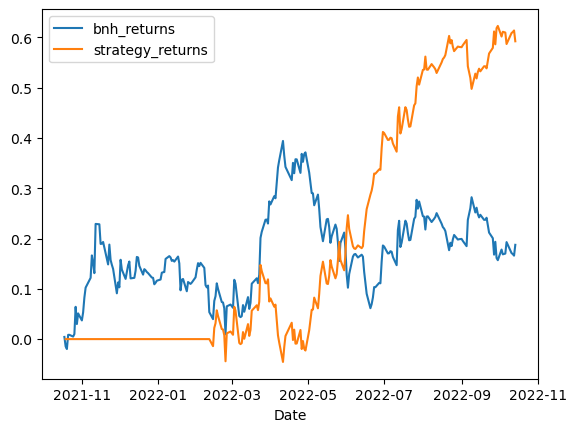

AIAENG
2022-10-14 22:51:09.819973
   Window  bnh returns  strategy returns
0       7     0.346063          0.047258
1      17     0.346063          0.038805
2      16     0.346063          0.038805
3      57     0.346063          0.018969
4      56     0.346063          0.018969
Window: 7


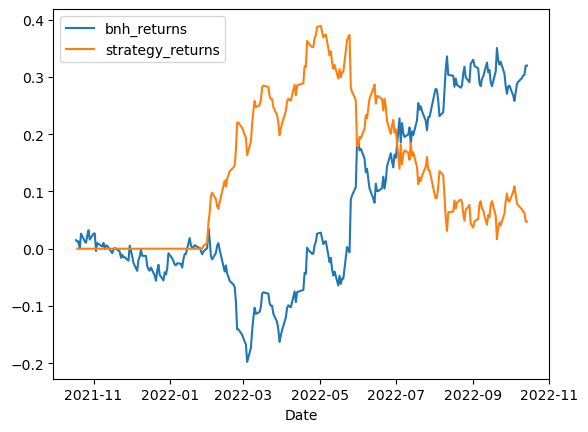

AIRAN
2022-10-14 22:51:11.745407
   Window  bnh returns  strategy returns
0      23    -0.332011          0.704465
1      22    -0.332011          0.704465
2      21    -0.332011          0.660386
3      20    -0.332011          0.660386
4      19    -0.332011          0.660386
Window: 23


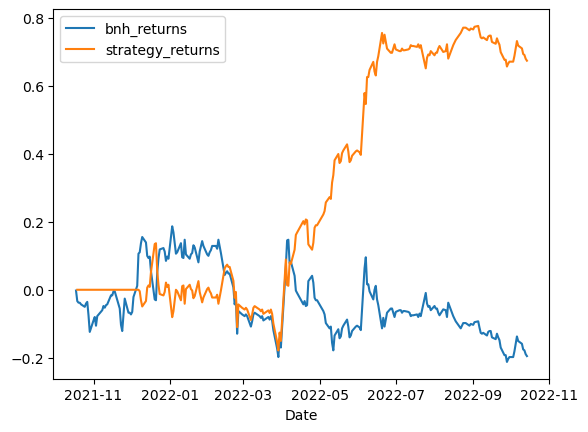

AIROLAM
2022-10-14 22:51:13.237223
   Window  bnh returns  strategy returns
0      39     0.335359          0.386362
1      42     0.335359          0.246153
2      38     0.335359          0.216503
3      37     0.335359          0.195777
4      36     0.335359          0.195777
Window: 39


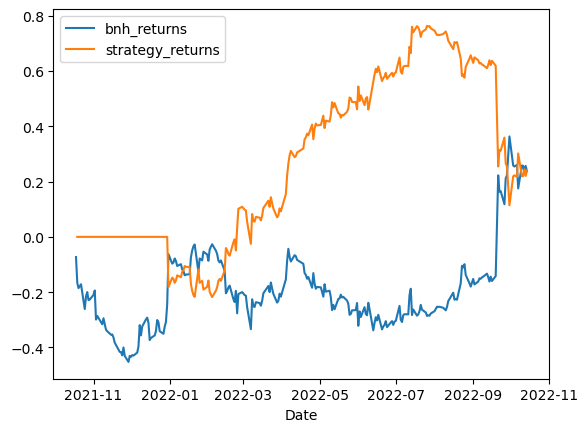

AJANTPHARM
2022-10-14 22:51:15.658583
   Window  bnh returns  strategy returns
0      15    -0.595632          0.893513
1      13    -0.595632          0.793176
2      14    -0.595632          0.793176
3      54    -0.595632          0.764473
4      53    -0.595632          0.714306
Window: 15


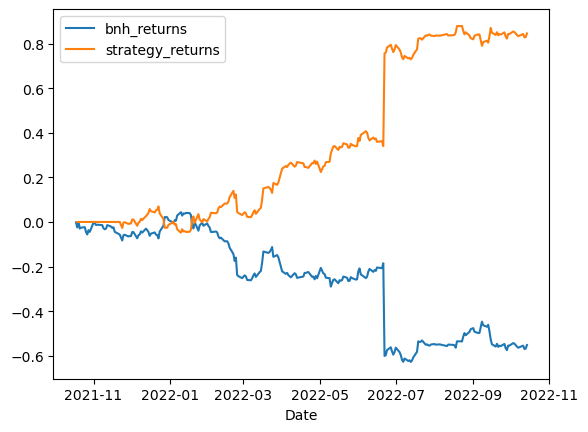

AJMERA
2022-10-14 22:51:17.361857
   Window  bnh returns  strategy returns
0       9    -0.514574          0.612823
1      34    -0.514574          0.526979
2      33    -0.514574          0.512239
3      32    -0.514574          0.512239
4       8    -0.514574          0.499313
Window: 9


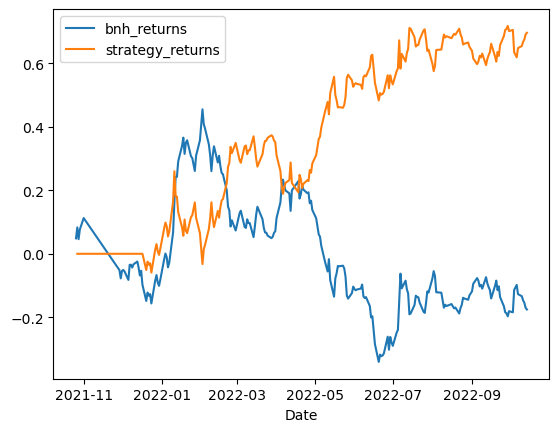

AJOONI
2022-10-14 22:51:19.979407
   Window  bnh returns  strategy returns
0       7    -2.277777          2.552953
1       8    -2.277777          2.552953
2      10    -2.277777          2.354949
3       9    -2.277777          2.354949
4       1    -2.277777          0.000000
Window: 7


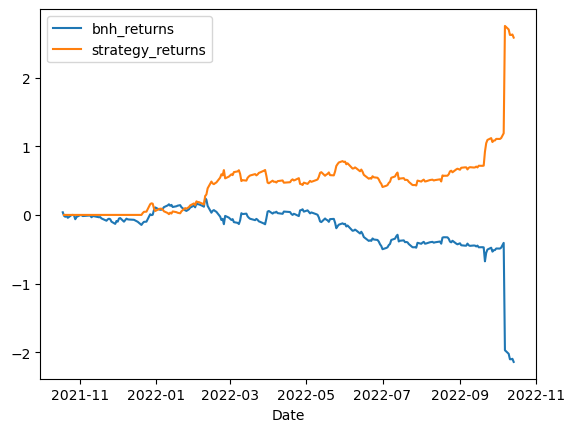

AJRINFRA
2022-10-14 22:51:22.318750
   Window  bnh returns  strategy returns
0      14    -0.229574          0.748801
1      11    -0.229574          0.685304
2      33    -0.229574          0.662021
3      30    -0.229574          0.594218
4      32    -0.229574          0.594218
Window: 14


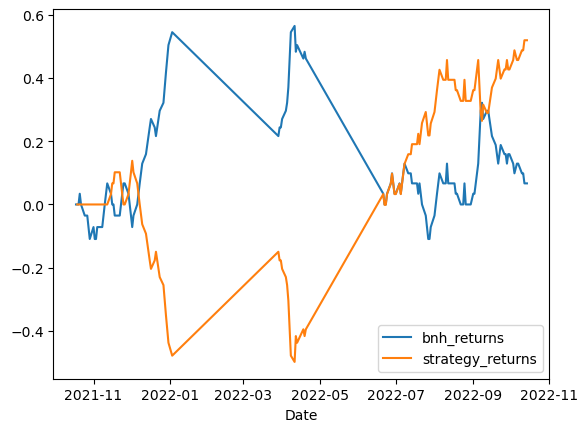

AKASH
2022-10-14 22:51:23.763255
   Window  bnh returns  strategy returns
0      59    -0.138571          0.289961
1      42    -0.138571          0.248974
2      51    -0.138571          0.242000
3      45    -0.138571          0.242000
4      46    -0.138571          0.242000
Window: 59


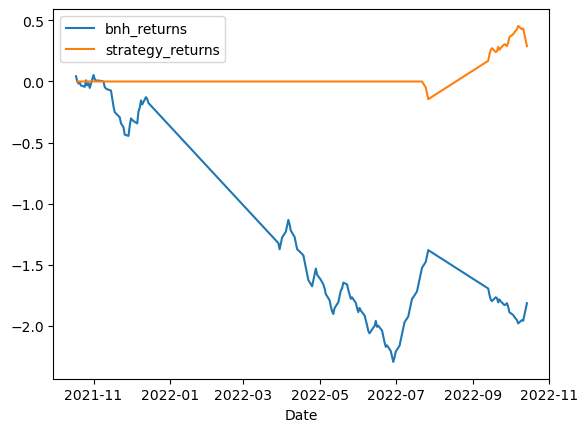

AKG
2022-10-14 22:51:25.423356
   Window  bnh returns  strategy returns
0      19     0.007314          2.132669
1      18     0.007314          1.841154
2      15     0.007314          1.436740
3      17     0.007314          1.422705
4      20     0.007314          1.227190
Window: 19


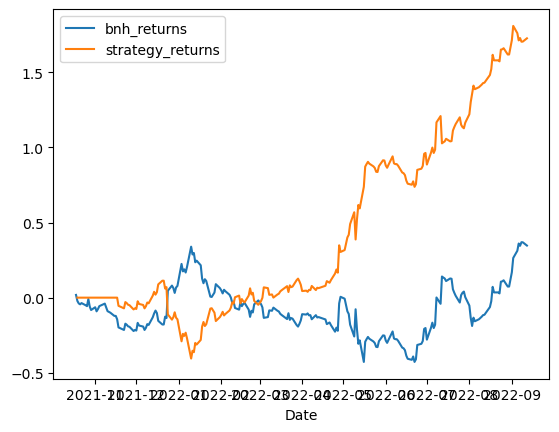

AKSHAR
2022-10-14 22:51:26.981014
   Window  bnh returns  strategy returns
0      59    -0.917183          0.003958
1      54    -0.917183          0.003958
2      53    -0.917183          0.003958
3       2    -0.917183          0.000000
4       1    -0.917183          0.000000
Window: 59


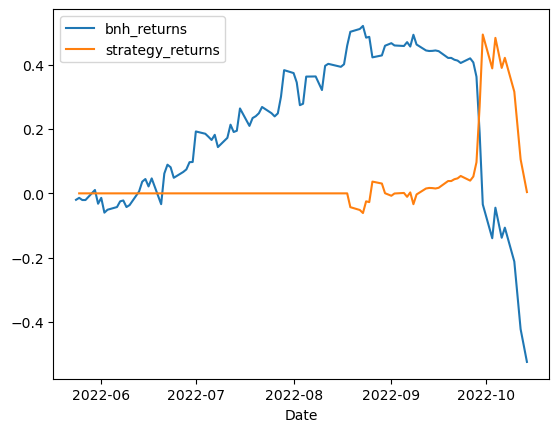

AKSHARCHEM
2022-10-14 22:51:29.945544
   Window  bnh returns  strategy returns
0      12    -0.300942          0.321744
1      13    -0.300942          0.321744
2      21    -0.300942          0.296019
3      28    -0.300942          0.268691
4      29    -0.300942          0.232042
Window: 12


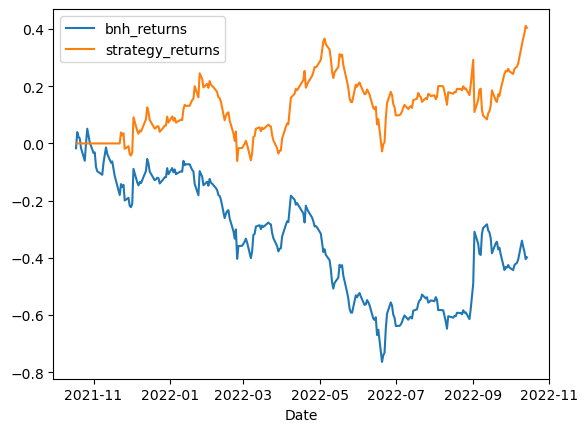

AKSHOPTFBR
2022-10-14 22:51:32.451090
   Window  bnh returns  strategy returns
0      47    -0.131336          1.209463
1      46    -0.131336          1.209463
2      45    -0.131336          1.164178
3      44    -0.131336          1.164178
4      41    -0.131336          1.062068
Window: 47


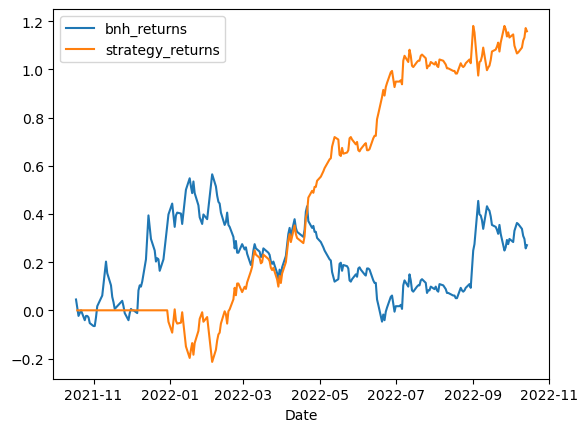

AKZOINDIA
2022-10-14 22:51:34.044444
   Window  bnh returns  strategy returns
0       8     0.030241          0.087984
1      12     0.030241          0.017666
2       1     0.030241          0.000000
3       3     0.030241          0.000000
4       4     0.030241          0.000000
Window: 8


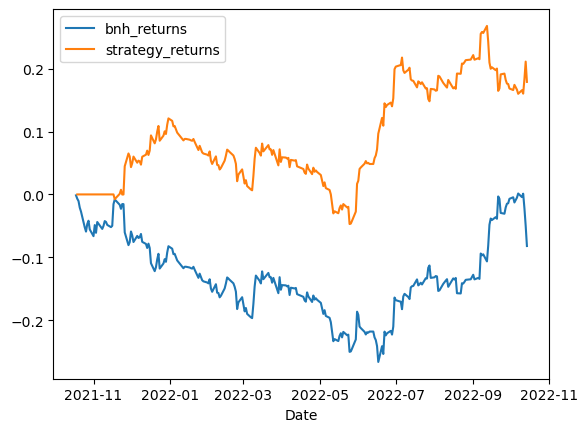

ALANKIT
2022-10-14 22:51:36.629690
fail
ALBERTDAVD
2022-10-14 22:51:36.738390


Exception in thread Exception in thread Thread-326:
Traceback (most recent call last):
  File "/Users/akash_verma/miniconda3/envs/epat/lib/python3.8/site-packages/urllib3/connectionpool.py", line 449, in _make_request
Thread-327:
Traceback (most recent call last):
  File "/Users/akash_verma/miniconda3/envs/epat/lib/python3.8/site-packages/urllib3/connectionpool.py", line 449, in _make_request
    six.raise_from(e, None)
  File "<string>", line 3, in raise_from
    six.raise_from(e, None)
  File "<string>", line 3, in raise_from
  File "/Users/akash_verma/miniconda3/envs/epat/lib/python3.8/site-packages/urllib3/connectionpool.py", line 444, in _make_request
  File "/Users/akash_verma/miniconda3/envs/epat/lib/python3.8/site-packages/urllib3/connectionpool.py", line 444, in _make_request
    httplib_response = conn.getresponse()
  File "/Users/akash_verma/miniconda3/envs/epat/lib/python3.8/http/client.py", line 1348, in getresponse
    httplib_response = conn.getresponse()
  File "/Users/

    raise ReadTimeout(e, request=request)
requests.exceptions.ReadTimeout: HTTPConnectionPool(host='www1.nseindia.com', port=80): Read timed out. (read timeout=None)
Exception in thread Thread-325:
Traceback (most recent call last):
  File "/Users/akash_verma/miniconda3/envs/epat/lib/python3.8/threading.py", line 932, in _bootstrap_inner
    self.run()
  File "/Users/akash_verma/miniconda3/envs/epat/lib/python3.8/site-packages/nsepy/commons.py", line 132, in run
    self.result = self._target(*self._args, **self._kwargs)
  File "/Users/akash_verma/miniconda3/envs/epat/lib/python3.8/site-packages/nsepy/history.py", line 136, in get_history
    return pd.concat((t1.result, t2.result))
AttributeError: 'ThreadReturns' object has no attribute 'result'


fail
ALEMBICLTD
2022-10-14 22:51:55.764854
   Window  bnh returns  strategy returns
0       7    -0.499771          0.777413
1      30    -0.499771          0.163920
2      26    -0.499771          0.163920
3      27    -0.499771          0.163920
4      28    -0.499771          0.163920
Window: 7


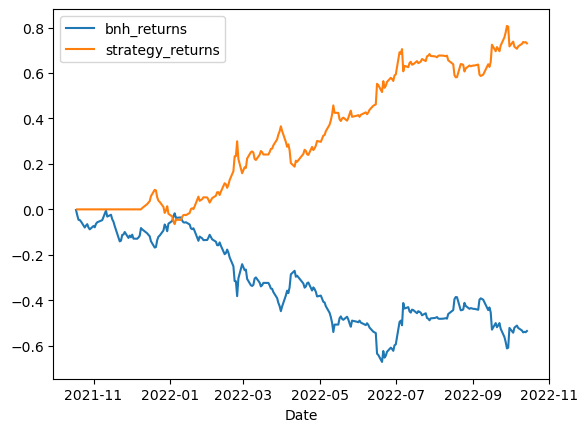

ALICON
2022-10-14 22:51:57.586515
   Window  bnh returns  strategy returns
0      47     0.003363          0.432465
1      46     0.003363          0.432465
2      45     0.003363          0.302485
3      44     0.003363          0.302485
4      39     0.003363          0.290717
Window: 47


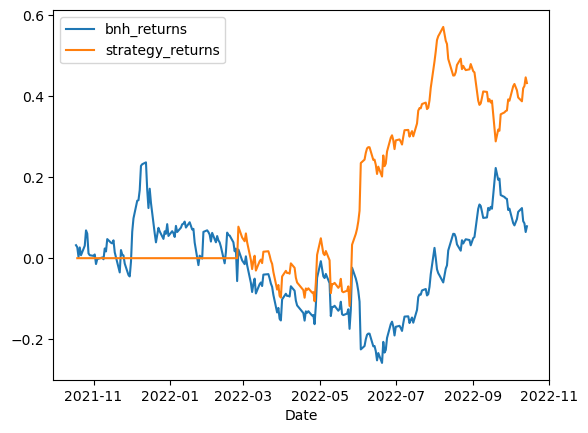

ALKALI
2022-10-14 22:52:00.443995
   Window  bnh returns  strategy returns
0      16     0.081848          0.307571
1      15     0.081848          0.261951
2      11     0.081848          0.232593
3      14     0.081848          0.232593
4      13     0.081848          0.232593
Window: 16


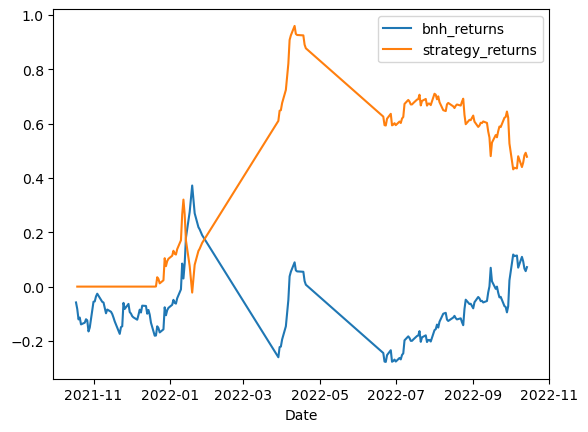

ALKEM
2022-10-14 22:52:01.921879
   Window  bnh returns  strategy returns
0      29    -0.185085          0.734309
1      27    -0.185085          0.638457
2      28    -0.185085          0.638457
3      26    -0.185085          0.564136
4      25    -0.185085          0.520592
Window: 29


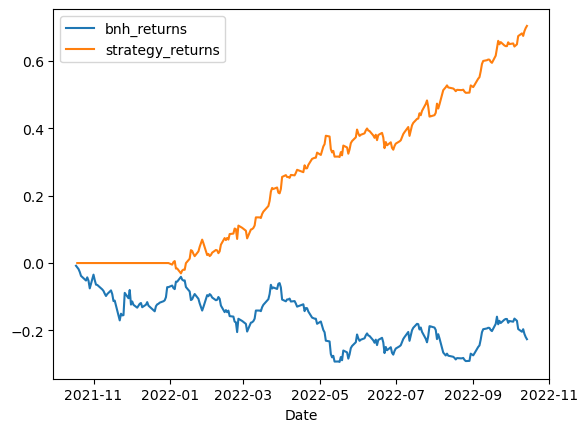

ALKYLAMINE
2022-10-14 22:52:04.472932
   Window  bnh returns  strategy returns
0      54    -0.238342          0.500708
1      53    -0.238342          0.500708
2      52    -0.238342          0.442820
3      51    -0.238342          0.428764
4      50    -0.238342          0.428764
Window: 54


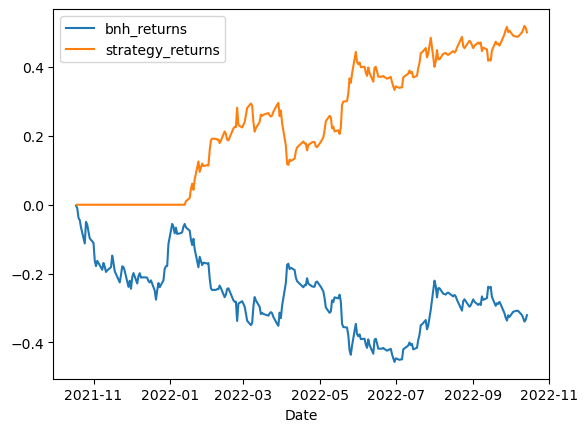

ALLCARGO
2022-10-14 22:52:06.238524
   Window  bnh returns  strategy returns
0      16     0.030107          0.672158
1      19     0.030107          0.606238
2      41     0.030107          0.591092
3      40     0.030107          0.591092
4      42     0.030107          0.591092
Window: 16


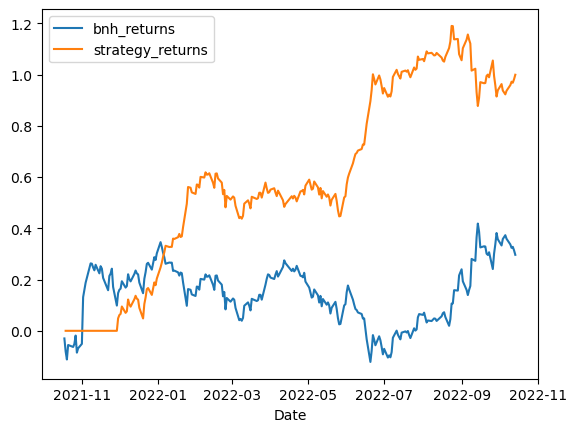

ALLSEC
2022-10-14 22:52:15.311368
   Window  bnh returns  strategy returns
0      59    -0.350829          0.635855
1      58    -0.350829          0.635855
2      57    -0.350829          0.635855
3      56    -0.350829          0.544200
4      53    -0.350829          0.513735
Window: 59


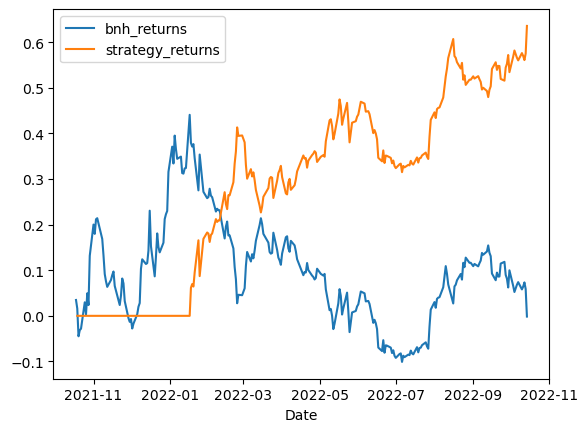

ALMONDZ
2022-10-14 22:52:17.177937
   Window  bnh returns  strategy returns
0      41    -0.406063          0.739842
1      40    -0.406063          0.739842
2      36    -0.406063          0.728495
3      14    -0.406063          0.702977
4      35    -0.406063          0.668967
Window: 41


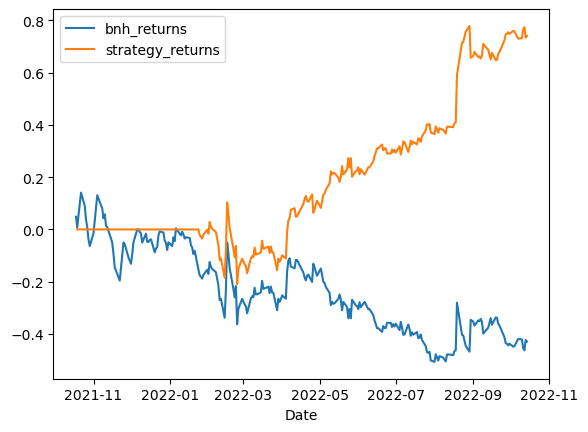

ALOKINDS
2022-10-14 22:52:18.716796
   Window  bnh returns  strategy returns
0      39    -0.292166          0.925625
1      36    -0.292166          0.898086
2      37    -0.292166          0.898086
3      38    -0.292166          0.898086
4      32    -0.292166          0.649875
Window: 39


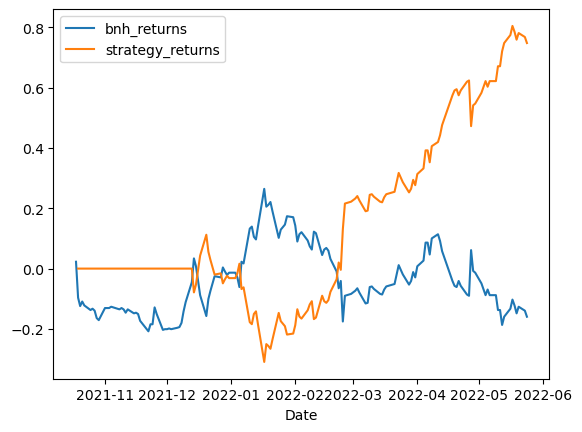

ALPA
2022-10-14 22:52:20.439657
   Window  bnh returns  strategy returns
0      40    -0.396306          1.009839
1      39    -0.396306          0.977485
2      38    -0.396306          0.910788
3      37    -0.396306          0.828363
4      35    -0.396306          0.744155
Window: 40


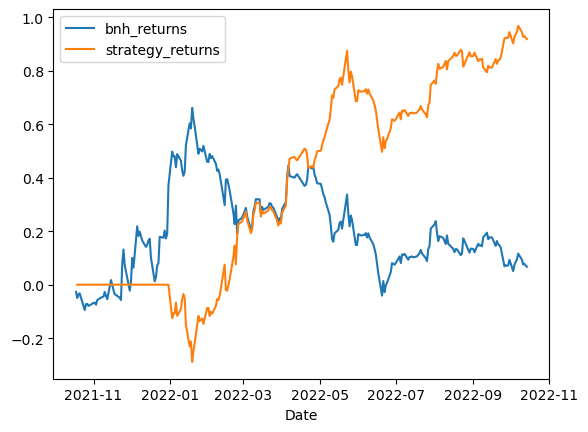

ALPHAGEO
2022-10-14 22:52:22.181550
   Window  bnh returns  strategy returns
0       8    -0.287175          0.938890
1       9    -0.287175          0.859656
2      10    -0.287175          0.786708
3       7    -0.287175          0.542637
4      59    -0.287175          0.535738
Window: 8


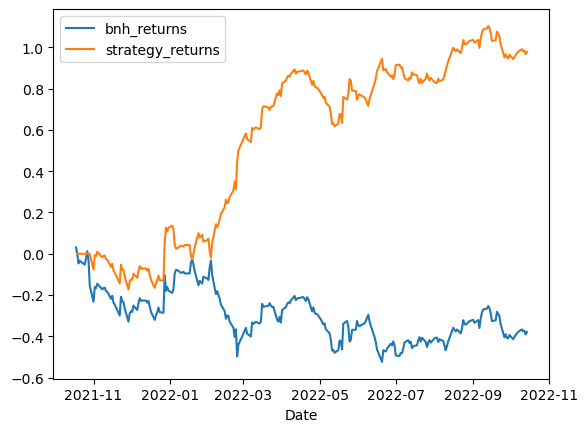

ALPSINDUS
2022-10-14 22:52:24.029478
   Window  bnh returns  strategy returns
0       1          0.0               0.0
1      45          0.0               0.0
2      33          0.0               0.0
3      34          0.0               0.0
4      35          0.0               0.0
Window: 1


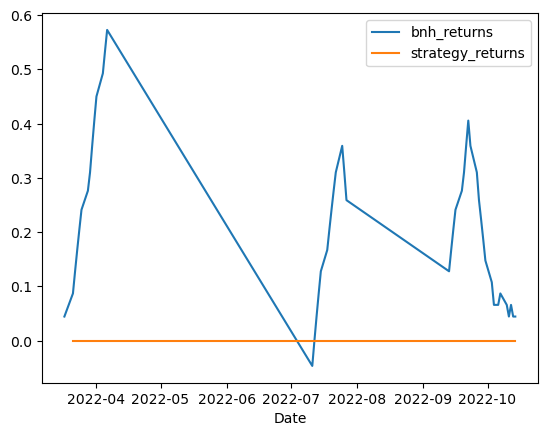

AMARAJABAT
2022-10-14 22:52:25.512494
   Window  bnh returns  strategy returns
0      43    -0.264671          0.035402
1      42    -0.264671          0.035402
2      37    -0.264671          0.030914
3      39    -0.264671          0.030914
4      38    -0.264671          0.030914
Window: 43


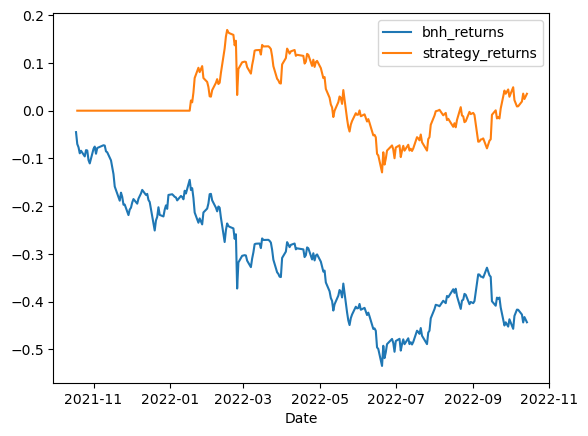

AMBER
2022-10-14 22:52:27.360207
   Window  bnh returns  strategy returns
0      10    -0.442495          0.561431
1      11    -0.442495          0.528052
2       9    -0.442495          0.461368
3       7    -0.442495          0.425091
4       8    -0.442495          0.411086
Window: 10


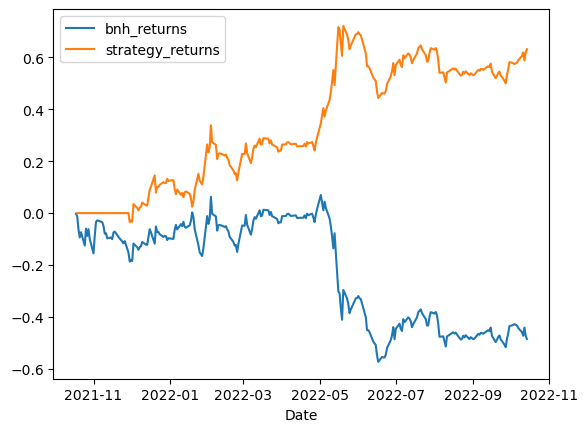

AMBICAAGAR
2022-10-14 22:52:29.127788
   Window  bnh returns  strategy returns
0      20     0.180819          0.728491
1      19     0.180819          0.575288
2      18     0.180819          0.575288
3      17     0.180819          0.575288
4      13     0.180819          0.486989
Window: 20


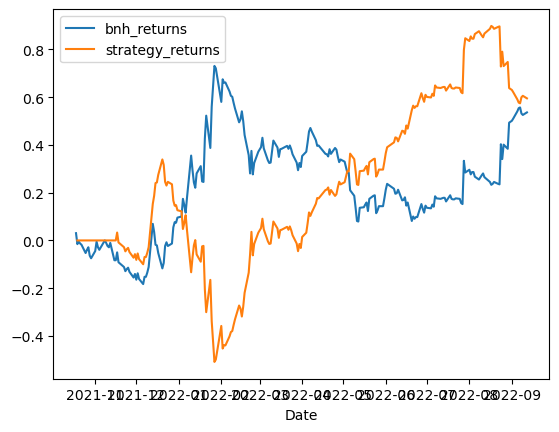

AMBIKCO
2022-10-14 22:52:31.411206
   Window  bnh returns  strategy returns
0      13    -0.295265          0.790383
1      12    -0.295265          0.506889
2       9    -0.295265          0.189255
3      11    -0.295265          0.156194
4       8    -0.295265          0.144741
Window: 13


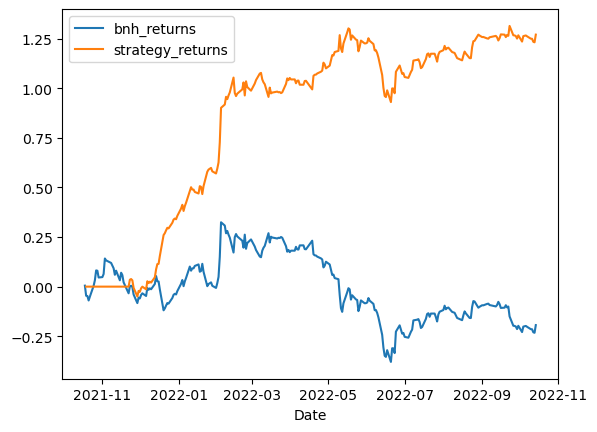

AMBUJACEM
2022-10-14 22:52:33.109966
   Window  bnh returns  strategy returns
0       1     0.228463               0.0
1       3     0.228463               0.0
2       4     0.228463               0.0
3       5     0.228463               0.0
4       6     0.228463               0.0
Window: 1


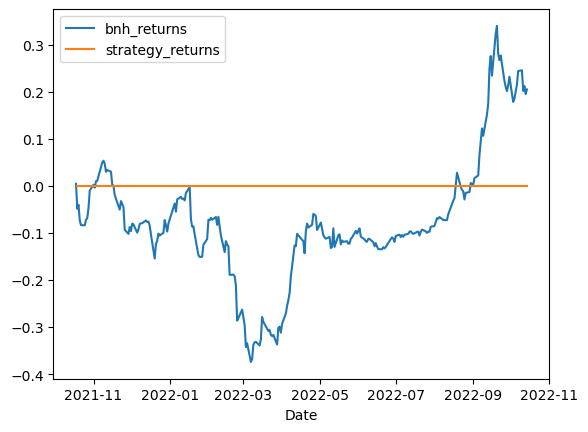

AMDIND
2022-10-14 22:52:34.700536
   Window  bnh returns  strategy returns
0      25     0.722842          0.330403
1      26     0.722842          0.330403
2      27     0.722842          0.330403
3      28     0.722842          0.330403
4      23     0.722842          0.155122
Window: 25


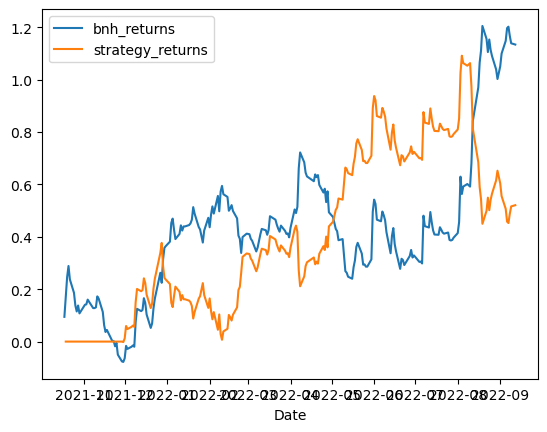

AMIORG
2022-10-14 22:52:37.138845
   Window  bnh returns  strategy returns
0      42     -0.14464          1.003216
1      26     -0.14464          0.862614
2      27     -0.14464          0.862614
3      29     -0.14464          0.862614
4      28     -0.14464          0.862614
Window: 42


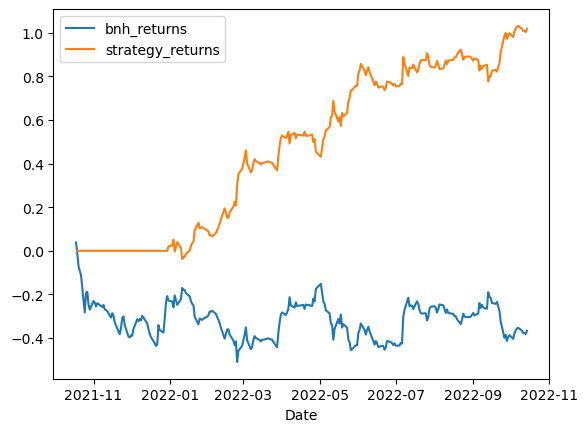

AMJLAND
2022-10-14 22:52:38.865759
   Window  bnh returns  strategy returns
0      11    -0.280865          1.053268
1       9    -0.280865          1.053268
2      10    -0.280865          1.053268
3      13    -0.280865          0.849757
4      12    -0.280865          0.849757
Window: 11


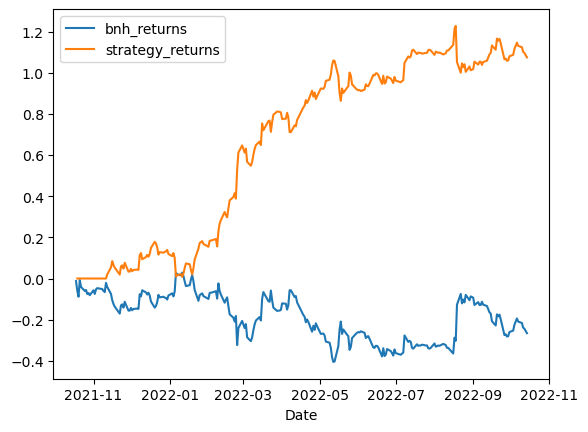

AMRUTANJAN
2022-10-14 22:52:40.431773
   Window  bnh returns  strategy returns
0      30    -0.265359          0.408099
1      29    -0.265359          0.408099
2      31    -0.265359          0.408099
3      11    -0.265359          0.396673
4      10    -0.265359          0.396673
Window: 30


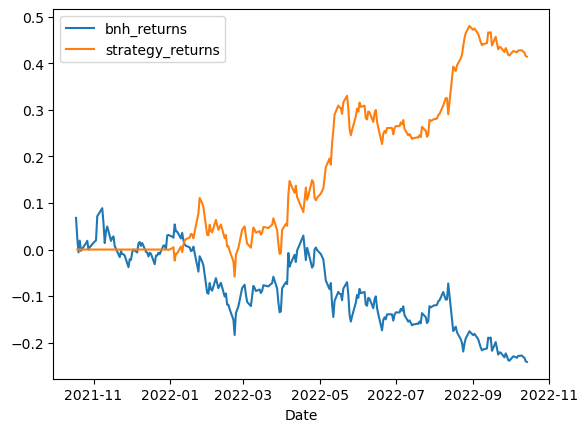

ANANDRATHI
2022-10-14 22:52:42.273896
   Window  bnh returns  strategy returns
0      19     0.172651          0.088865
1      18     0.172651          0.088865
2      17     0.172651          0.088865
3      21     0.172651          0.088865
4       9     0.172651          0.088740
Window: 19


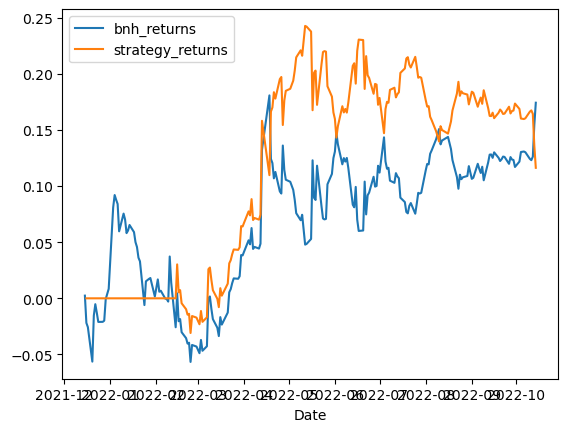

ANANTRAJ
2022-10-14 22:52:43.796782
   Window  bnh returns  strategy returns
0       8     0.336966          0.424400
1       7     0.336966          0.303663
2       9     0.336966          0.135986
3      10     0.336966          0.135986
4      11     0.336966          0.135986
Window: 8


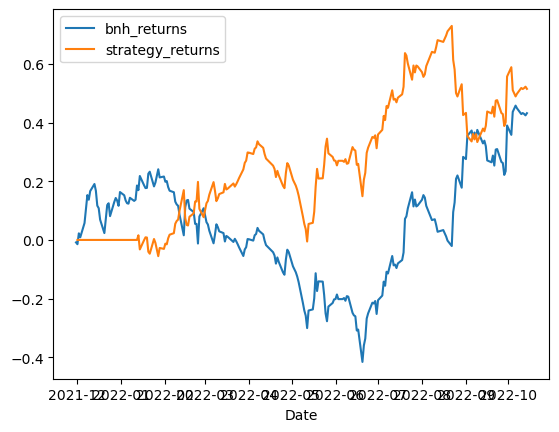

ANDHRAPAP
2022-10-14 22:52:45.584749
   Window  bnh returns  strategy returns
0       1     0.685205               0.0
1       3     0.685205               0.0
2       4     0.685205               0.0
3       5     0.685205               0.0
4       2     0.685205               0.0
Window: 1


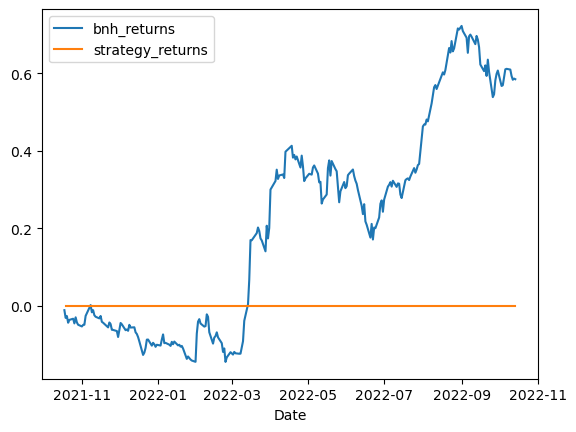

ANDHRSUGAR
2022-10-14 22:52:48.544881
   Window  bnh returns  strategy returns
0      10     0.065621          0.681417
1      51     0.065621          0.650587
2      50     0.065621          0.650587
3      52     0.065621          0.650587
4       8     0.065621          0.629408
Window: 10


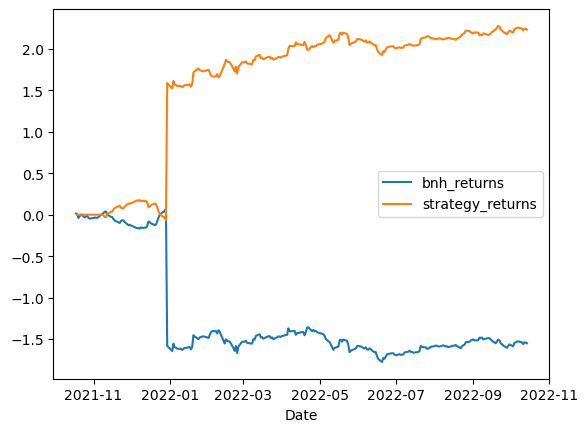

ANDREWYU
2022-10-14 22:52:50.671809
   Window  bnh returns  strategy returns
0      53    -0.359944          1.395097
1      52    -0.359944          1.395097
2      51    -0.359944          1.312276
3      59    -0.359944          1.012986
4      58    -0.359944          1.012986
Window: 53


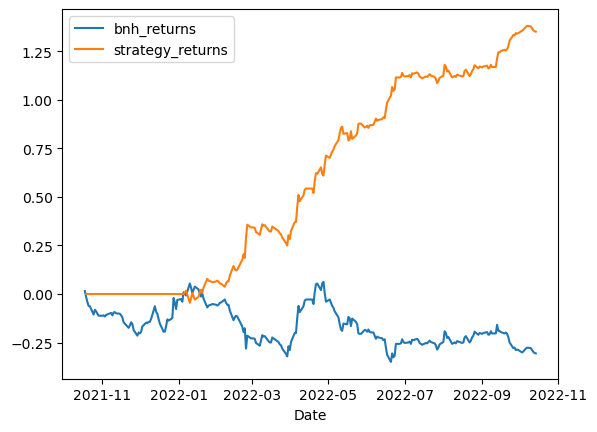

ANGELONE
2022-10-14 22:52:52.427950
   Window  bnh returns  strategy returns
0      11     0.257744          0.445854
1      15     0.257744          0.414917
2      59     0.257744          0.413996
3      58     0.257744          0.413996
4      17     0.257744          0.398503
Window: 11


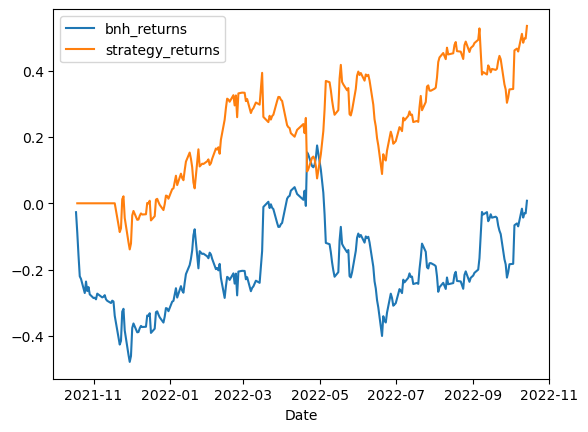

ANIKINDS
2022-10-14 22:52:54.125668
   Window  bnh returns  strategy returns
0      40     0.140605          1.182083
1      39     0.140605          1.182083
2      37     0.140605          1.147959
3      38     0.140605          1.147959
4      36     0.140605          1.048947
Window: 40


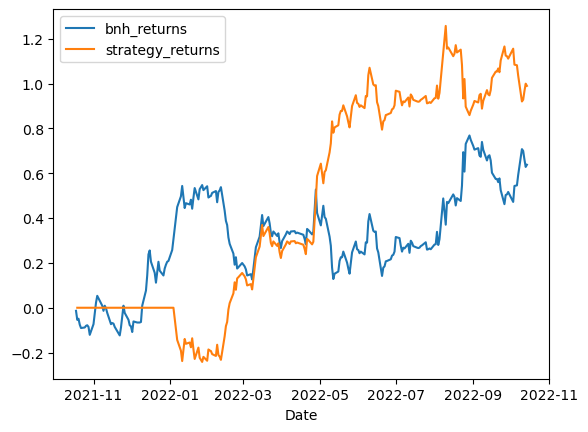

ANKITMETAL
2022-10-14 22:52:56.023678
   Window  bnh returns  strategy returns
0      30     -0.25228          0.433048
1      31     -0.25228          0.433048
2      29     -0.25228          0.433048
3      35     -0.25228          0.390866
4      34     -0.25228          0.390866
Window: 30


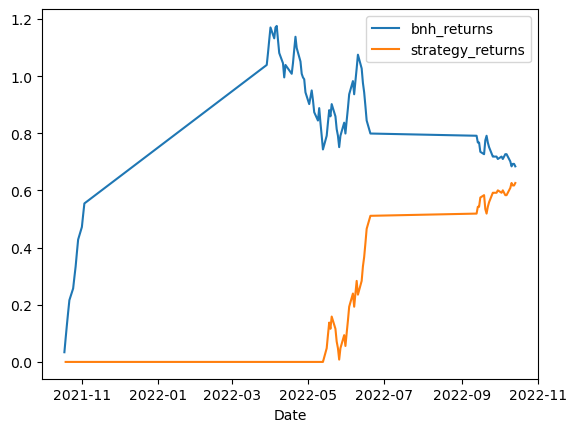

ANMOL
2022-10-14 22:52:58.083177
   Window  bnh returns  strategy returns
0      13    -0.103997          0.533176
1      15    -0.103997          0.533176
2      12    -0.103997          0.533176
3      14    -0.103997          0.533176
4      17    -0.103997          0.528326
Window: 13


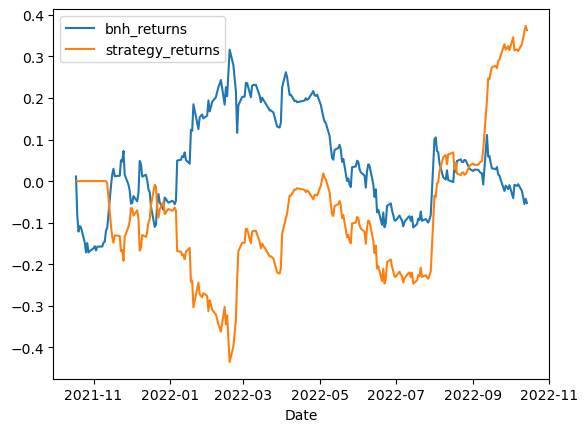

ANSALAPI
2022-10-14 22:52:59.635587
   Window  bnh returns  strategy returns
0      44     0.393904          0.879793
1      45     0.393904          0.879793
2      46     0.393904          0.879793
3      47     0.393904          0.879793
4      48     0.393904          0.823015
Window: 44


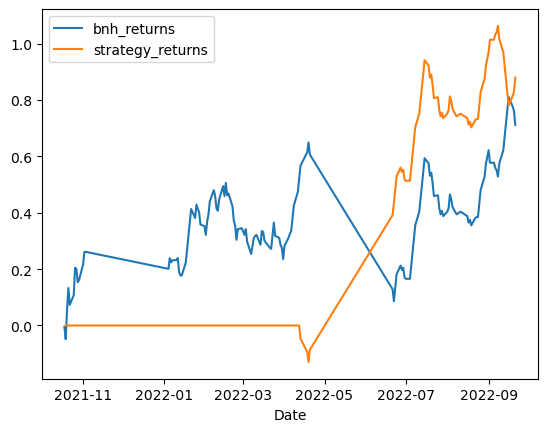

ANTGRAPHIC
2022-10-14 22:53:01.133071
   Window  bnh returns  strategy returns
0       1          0.0               0.0
1      45          0.0               0.0
2      33          0.0               0.0
3      34          0.0               0.0
4      35          0.0               0.0
Window: 1


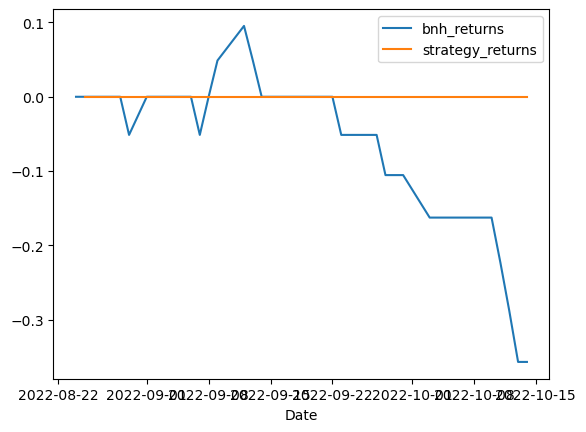

ANUP
2022-10-14 22:53:02.314123
   Window  bnh returns  strategy returns
0      23    -0.182495          1.052520
1      26    -0.182495          0.982414
2      22    -0.182495          0.980419
3      25    -0.182495          0.969072
4      27    -0.182495          0.969072
Window: 23


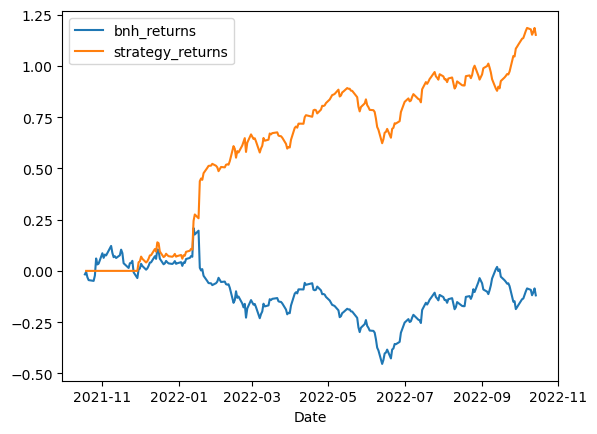

ANURAS
2022-10-14 22:53:04.724222
   Window  bnh returns  strategy returns
0       7    -0.355972          0.355972
1      46    -0.355972          0.274475
2      58    -0.355972          0.238428
3      57    -0.355972          0.238428
4      56    -0.355972          0.238428
Window: 7


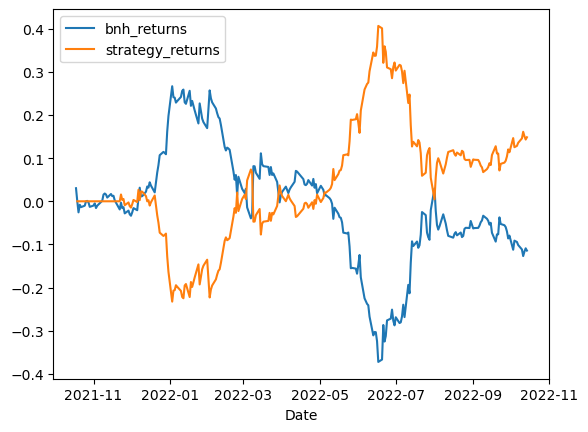

APARINDS
2022-10-14 22:53:07.259671
   Window  bnh returns  strategy returns
0       1     0.588997               0.0
1       2     0.588997               0.0
2       3     0.588997               0.0
3       4     0.588997               0.0
4       5     0.588997               0.0
Window: 1


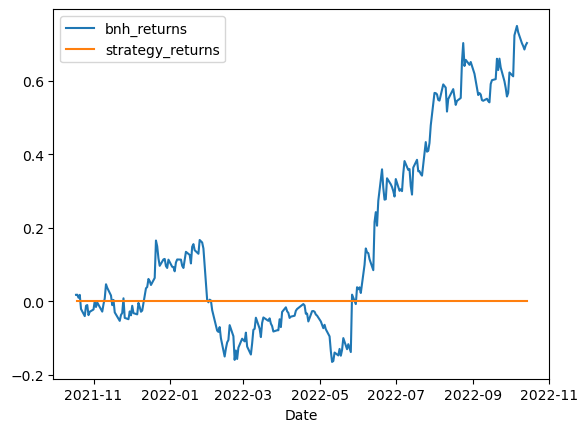

APCL
2022-10-14 22:53:09.447257
   Window  bnh returns  strategy returns
0      38    -0.374596          1.099096
1      37    -0.374596          1.099096
2      36    -0.374596          1.089205
3      41    -0.374596          0.987428
4      40    -0.374596          0.987428
Window: 38


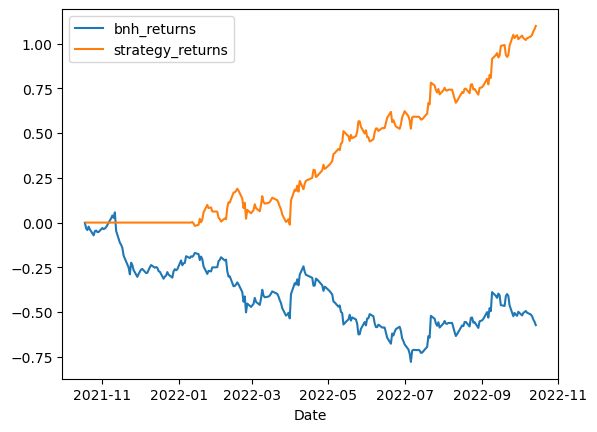

APCOTEXIND
2022-10-14 22:53:12.067654
   Window  bnh returns  strategy returns
0       8     0.398034          0.816434
1       7     0.398034          0.499057
2      41     0.398034          0.315360
3      40     0.398034          0.315360
4      42     0.398034          0.315360
Window: 8


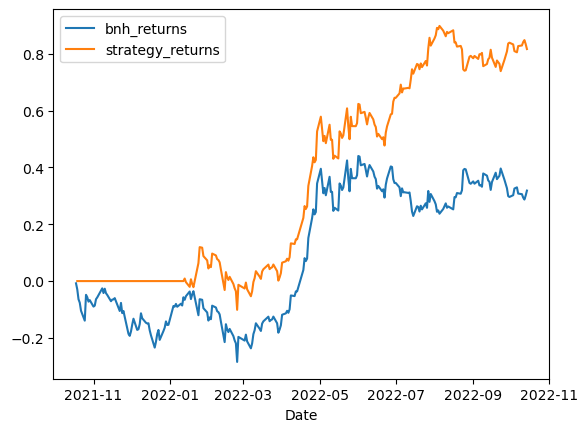

APEX
2022-10-14 22:53:14.244827
   Window  bnh returns  strategy returns
0      16    -0.005147          0.856128
1      17    -0.005147          0.693737
2      28    -0.005147          0.682980
3      30    -0.005147          0.656658
4      29    -0.005147          0.656658
Window: 16


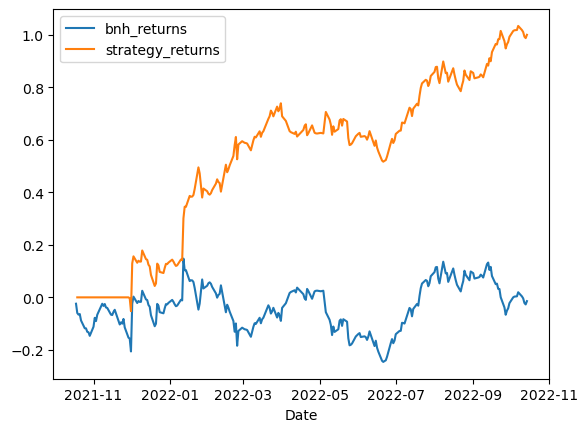

APLAPOLLO
2022-10-14 22:53:20.758758
   Window  bnh returns  strategy returns
0      44     0.204251          0.595058
1       9     0.204251          0.593588
2      43     0.204251          0.474978
3      42     0.204251          0.463345
4       8     0.204251          0.435433
Window: 44


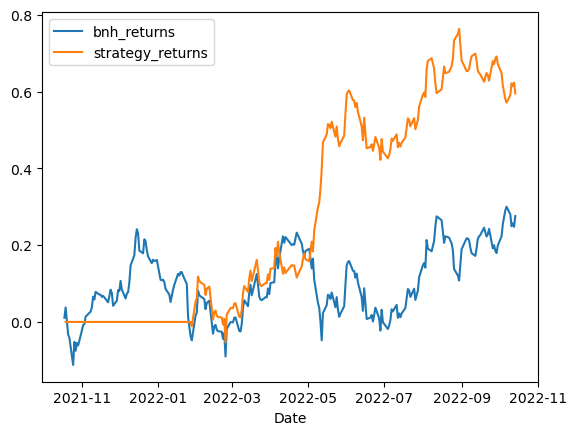

APLLTD
2022-10-14 22:53:22.621785
   Window  bnh returns  strategy returns
0      11    -0.364956          0.207580
1      12    -0.364956          0.131788
2      13    -0.364956          0.095223
3       9    -0.364956          0.080419
4       7    -0.364956          0.018224
Window: 11


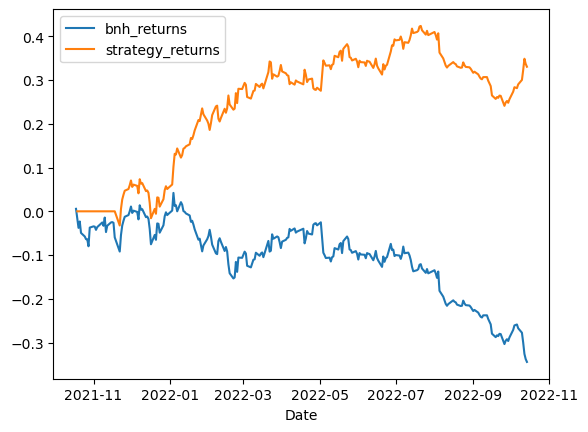

APOLLO
2022-10-14 22:53:24.494107
   Window  bnh returns  strategy returns
0      17     0.350864          0.227543
1      16     0.350864          0.209799
2      28     0.350864          0.101876
3      27     0.350864          0.101876
4      26     0.350864          0.032189
Window: 17


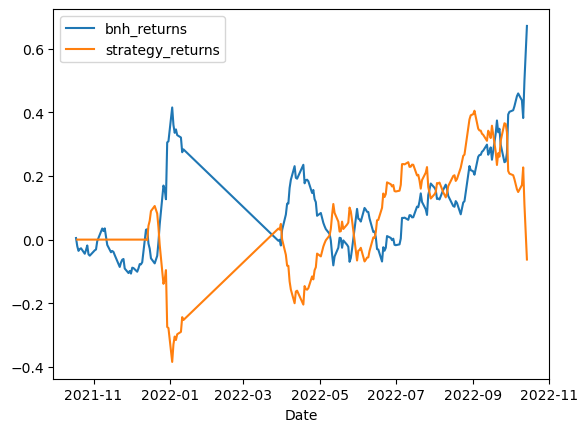

APOLLOHOSP
2022-10-14 22:53:26.045671
   Window  bnh returns  strategy returns
0      40    -0.164451          0.188974
1      39    -0.164451          0.188974
2      38    -0.164451          0.180806
3      18    -0.164451          0.170015
4      17    -0.164451          0.170015
Window: 40


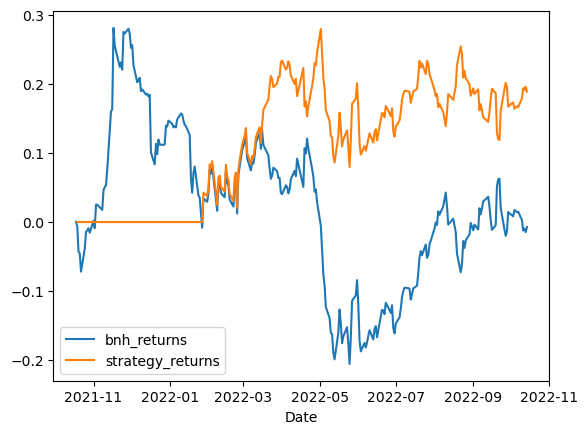

APOLLOPIPE
2022-10-14 22:53:27.833238
   Window  bnh returns  strategy returns
0      59     -0.05433          0.915202
1      58     -0.05433          0.915202
2      57     -0.05433          0.915202
3      56     -0.05433          0.883917
4      55     -0.05433          0.858007
Window: 59


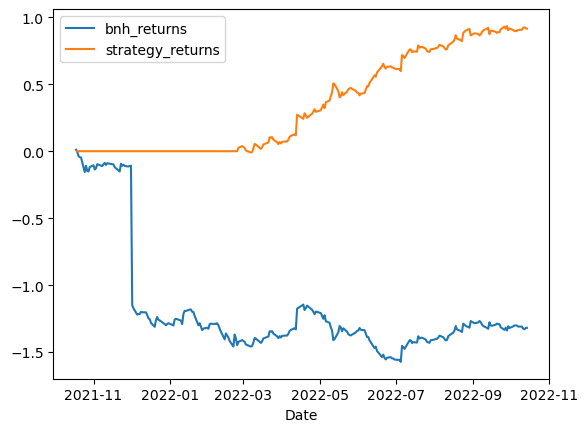

APOLLOTYRE
2022-10-14 22:53:30.323477
   Window  bnh returns  strategy returns
0      59     0.153598          0.759644
1      58     0.153598          0.759644
2      57     0.153598          0.759644
3      56     0.153598          0.759644
4      55     0.153598          0.759644
Window: 59


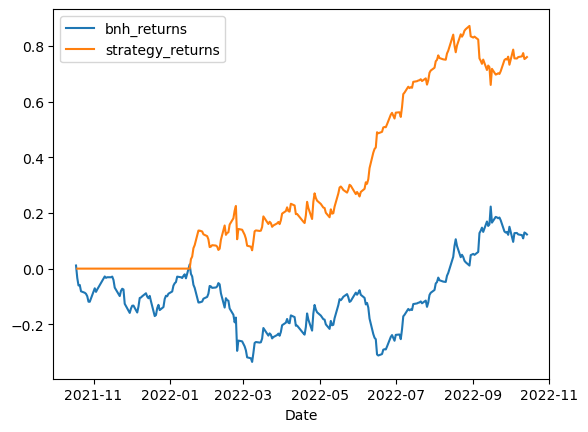

APOLSINHOT
2022-10-14 22:53:32.140455
   Window  bnh returns  strategy returns
0      14     0.590774          0.002717
1       1     0.590774          0.000000
2       3     0.590774          0.000000
3       4     0.590774          0.000000
4       5     0.590774          0.000000
Window: 14


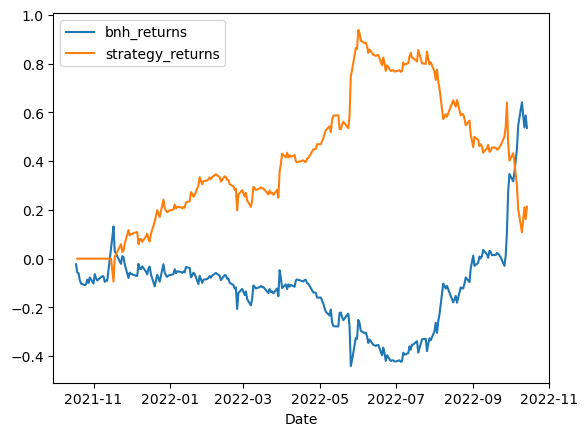

APTECHT
2022-10-14 22:53:34.553167
   Window  bnh returns  strategy returns
0      11    -0.392423          0.933362
1       8    -0.392423          0.859216
2      12    -0.392423          0.793884
3       7    -0.392423          0.785945
4      10    -0.392423          0.784357
Window: 11


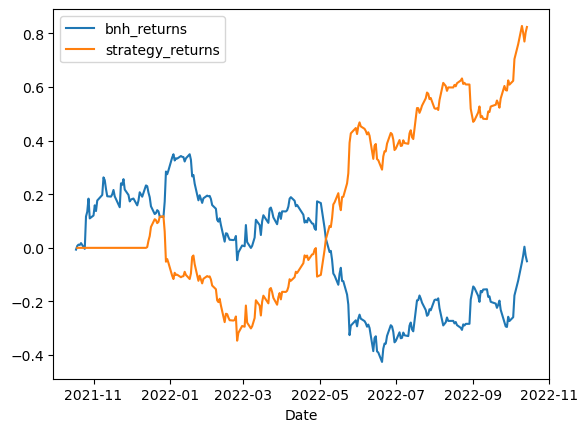

APTUS
2022-10-14 22:53:36.410897
   Window  bnh returns  strategy returns
0      23     -0.17573          0.465219
1       7     -0.17573          0.234578
2      45     -0.17573          0.226808
3      46     -0.17573          0.226808
4      36     -0.17573          0.226808
Window: 23


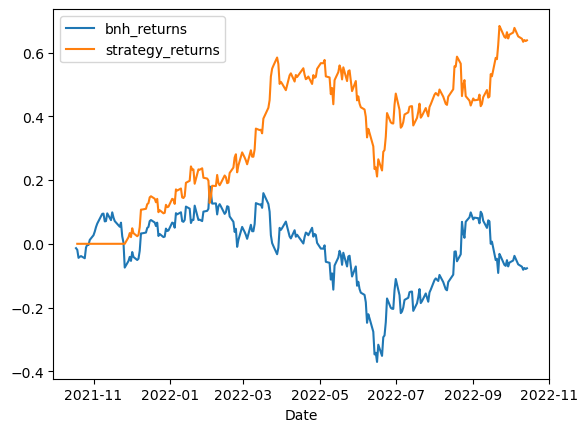

ARCHIDPLY
2022-10-14 22:53:38.952100
   Window  bnh returns  strategy returns
0      39     0.314115          0.910452
1      38     0.314115          0.863159
2      37     0.314115          0.863159
3      36     0.314115          0.806533
4      35     0.314115          0.704916
Window: 39


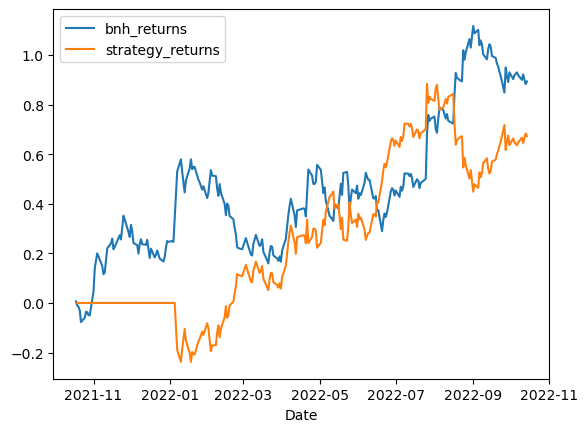

ARCHIES
2022-10-14 22:53:40.425027
   Window  bnh returns  strategy returns
0      39     0.037388          1.218565
1      45     0.037388          1.218565
2      44     0.037388          1.218565
3      43     0.037388          1.218565
4      42     0.037388          1.218565
Window: 39


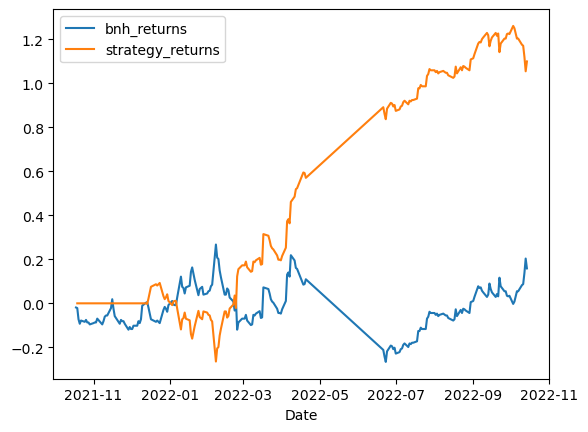

ARENTERP
2022-10-14 22:53:42.310702
   Window  bnh returns  strategy returns
0      35    -0.042373          0.872545
1      33    -0.042373          0.872545
2      34    -0.042373          0.872545
3      46    -0.042373          0.699845
4      32    -0.042373          0.684110
Window: 35


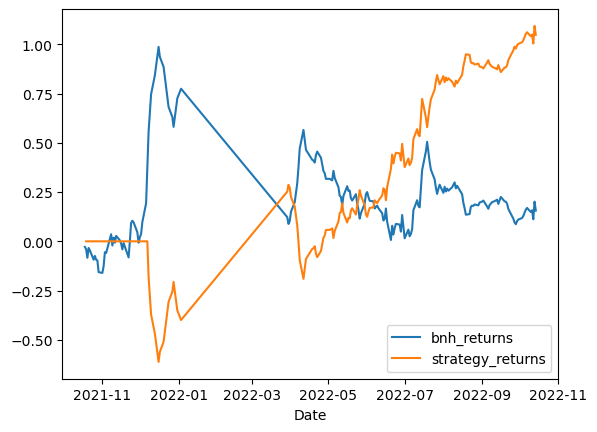

ARIES
2022-10-14 22:53:44.457236
   Window  bnh returns  strategy returns
0      48    -0.180134          1.012985
1      47    -0.180134          1.012985
2      46    -0.180134          1.012985
3      45    -0.180134          0.965710
4      44    -0.180134          0.965710
Window: 48


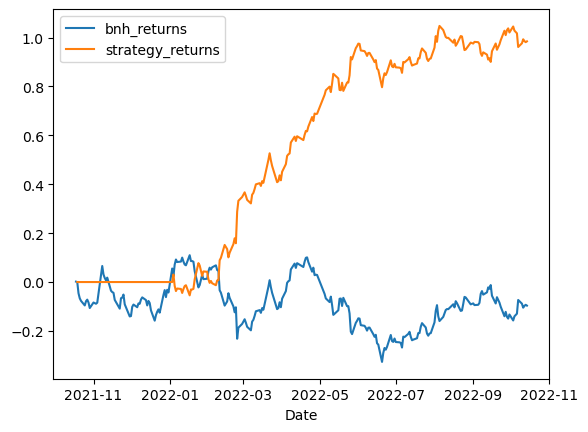

ARIHANTCAP
2022-10-14 22:53:46.247637
   Window  bnh returns  strategy returns
0      12    -1.279925          1.865475
1       9    -1.279925          1.796836
2       8    -1.279925          1.471294
3      10    -1.279925          1.399768
4      20    -1.279925          1.342818
Window: 12


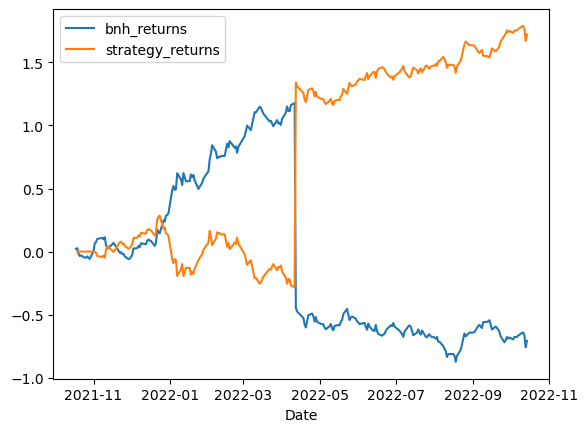

ARIHANTSUP
2022-10-14 22:53:48.761073
   Window  bnh returns  strategy returns
0      36     0.259877          0.670766
1      35     0.259877          0.670766
2      34     0.259877          0.670766
3      33     0.259877          0.670766
4      39     0.259877          0.584463
Window: 36


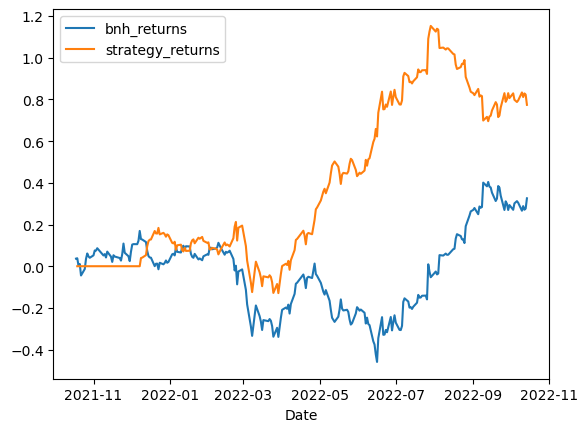

ARMANFIN
2022-10-14 22:53:51.252018
   Window  bnh returns  strategy returns
0      14     0.493282          0.686005
1      15     0.493282          0.562157
2      10     0.493282          0.357118
3       9     0.493282          0.328096
4      21     0.493282          0.287511
Window: 14


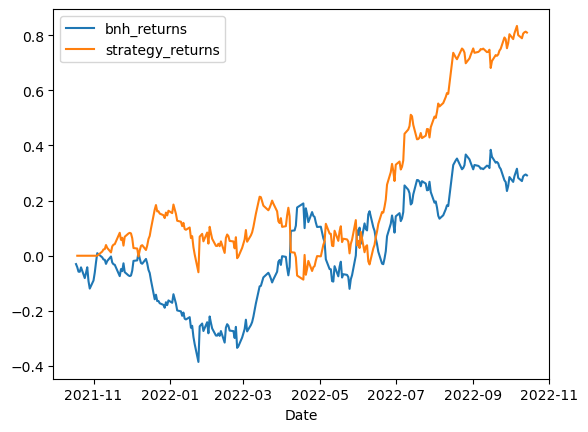

AROGRANITE
2022-10-14 22:53:53.112730
   Window  bnh returns  strategy returns
0       7    -0.510826          0.633752
1       8    -0.510826          0.535873
2       1    -0.510826          0.000000
3       3    -0.510826          0.000000
4       4    -0.510826          0.000000
Window: 7


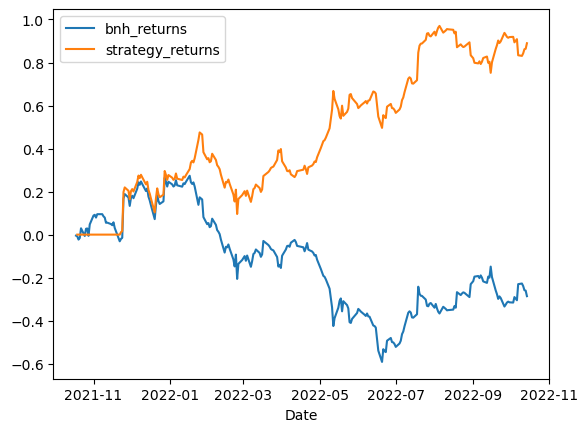

ARROWGREEN
2022-10-14 22:53:54.639388
   Window  bnh returns  strategy returns
0      49    -0.199557          1.041282
1      48    -0.199557          1.041282
2      47    -0.199557          1.041282
3      46    -0.199557          1.041282
4      45    -0.199557          1.041282
Window: 49


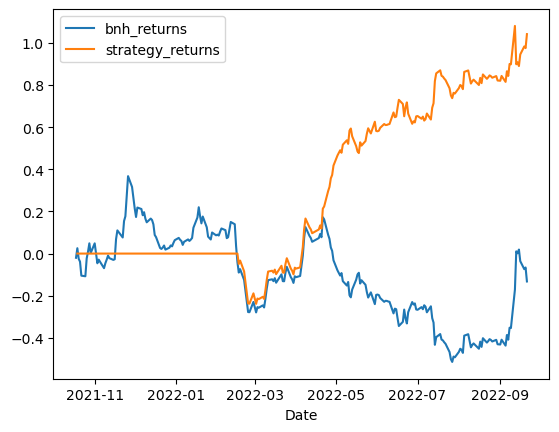

ARSHIYA
2022-10-14 22:53:56.589546
   Window  bnh returns  strategy returns
0      10    -1.116748          1.967002
1      14    -1.116748          1.824426
2      12    -1.116748          1.814715
3      15    -1.116748          1.720260
4       9    -1.116748          1.587076
Window: 10


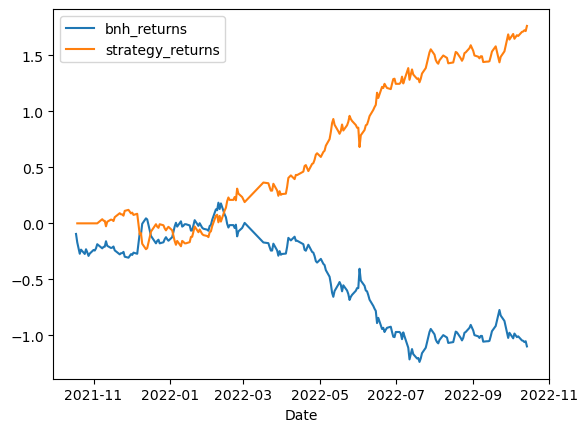

ARSSINFRA
2022-10-14 22:53:58.137314
   Window  bnh returns  strategy returns
0       9    -0.569021          0.926777
1      10    -0.569021          0.926777
2       7    -0.569021          0.922883
3       8    -0.569021          0.922883
4      11    -0.569021          0.922883
Window: 9


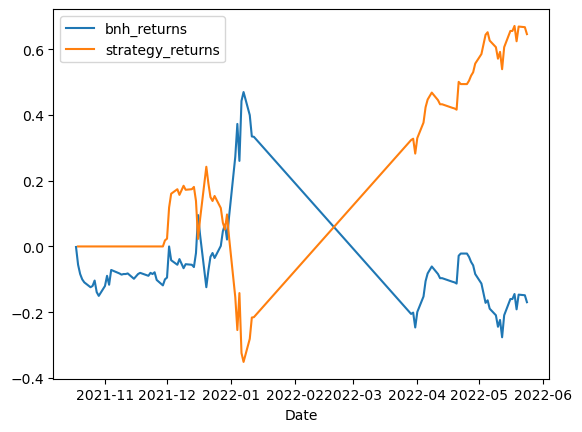

ARTEMISMED
2022-10-14 22:53:59.584991
   Window  bnh returns  strategy returns
0       9     0.329064          0.549566
1      37     0.329064          0.531895
2      35     0.329064          0.486659
3      36     0.329064          0.471350
4      30     0.329064          0.447417
Window: 9


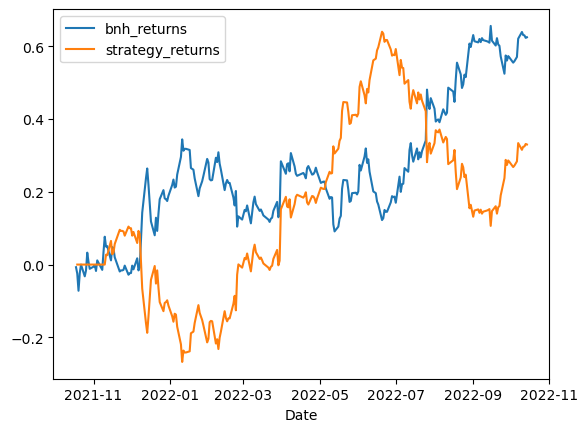

ARTNIRMAN
2022-10-14 22:54:01.092925
fail
ARVEE
2022-10-14 22:54:03.063533
   Window  bnh returns  strategy returns
0      16      0.07243          1.154279
1      12      0.07243          1.056699
2      15      0.07243          1.056699
3      14      0.07243          1.056699
4      13      0.07243          1.056699
Window: 16


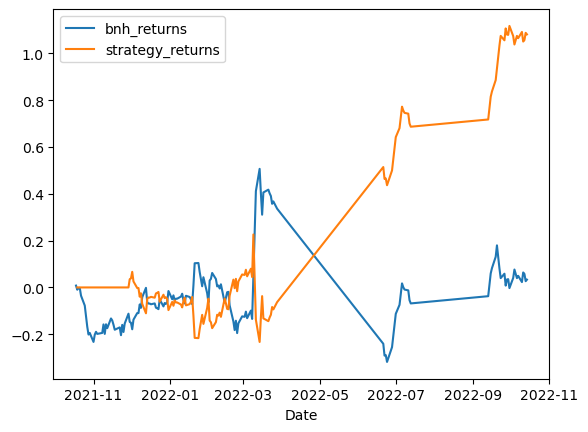

ARVIND
2022-10-14 22:54:05.397162
   Window  bnh returns  strategy returns
0      40    -0.335878          0.605752
1      39    -0.335878          0.605752
2      38    -0.335878          0.543316
3      37    -0.335878          0.543316
4      36    -0.335878          0.543316
Window: 40


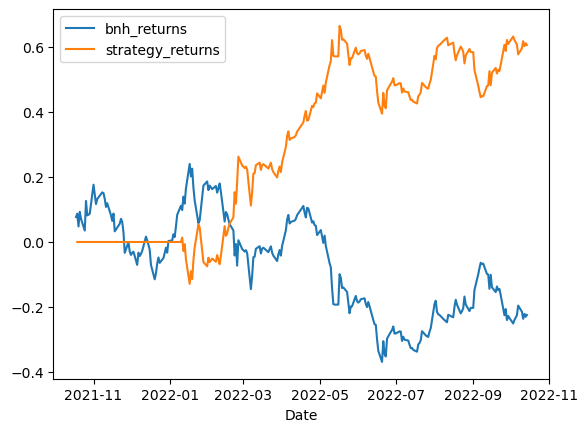

ARVINDFASN
2022-10-14 22:54:07.191081
   Window  bnh returns  strategy returns
0      33     0.047303          1.034104
1      32     0.047303          0.931714
2      30     0.047303          0.812810
3      31     0.047303          0.812810
4      29     0.047303          0.795079
Window: 33


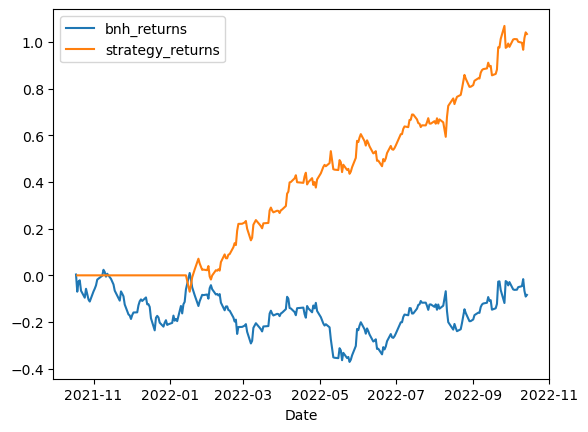

ARVSMART
2022-10-14 22:54:09.624221
   Window  bnh returns  strategy returns
0       9     0.221531          0.239341
1       6     0.221531          0.099515
2      12     0.221531          0.047520
3      10     0.221531          0.029185
4      11     0.221531          0.029185
Window: 9


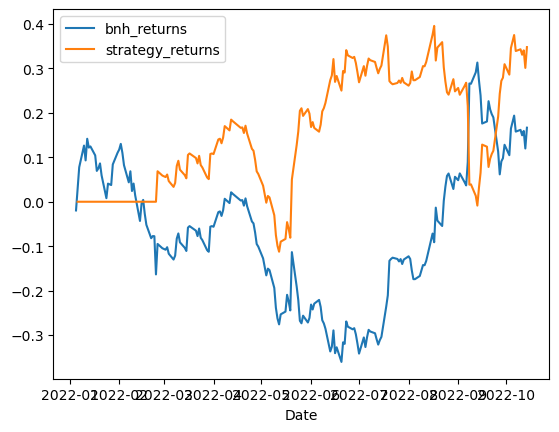

ASAHIINDIA
2022-10-14 22:54:12.772226
   Window  bnh returns  strategy returns
0      25     0.098055          0.623620
1      28     0.098055          0.622615
2      27     0.098055          0.606643
3      11     0.098055          0.515403
4      15     0.098055          0.515403
Window: 25


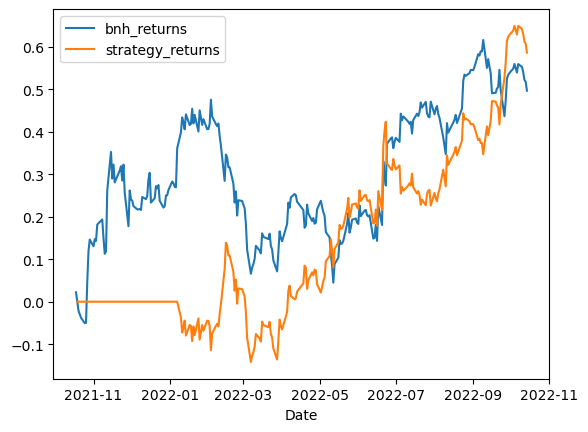

ASAHISONG
2022-10-14 22:54:14.898341
   Window  bnh returns  strategy returns
0      59    -0.000337          0.725643
1      58    -0.000337          0.725643
2      57    -0.000337          0.707549
3      56    -0.000337          0.694197
4      55    -0.000337          0.603884
Window: 59


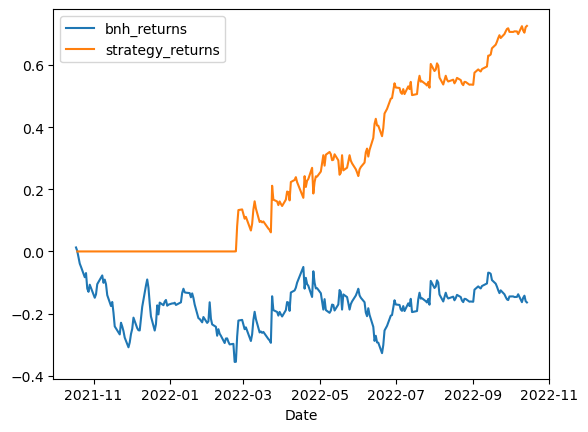

ASAL
2022-10-14 22:54:16.439489
   Window  bnh returns  strategy returns
0       9    -0.042895          0.453017
1      11    -0.042895          0.453017
2       7    -0.042895          0.453017
3       8    -0.042895          0.453017
4      10    -0.042895          0.453017
Window: 9


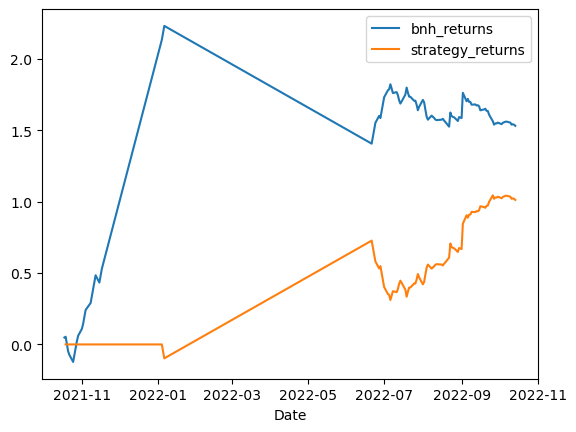

ASALCBR
2022-10-14 22:54:17.872307
   Window  bnh returns  strategy returns
0      38    -0.077513          0.530968
1      36    -0.077513          0.523546
2      31    -0.077513          0.523546
3      34    -0.077513          0.523546
4      35    -0.077513          0.523546
Window: 38


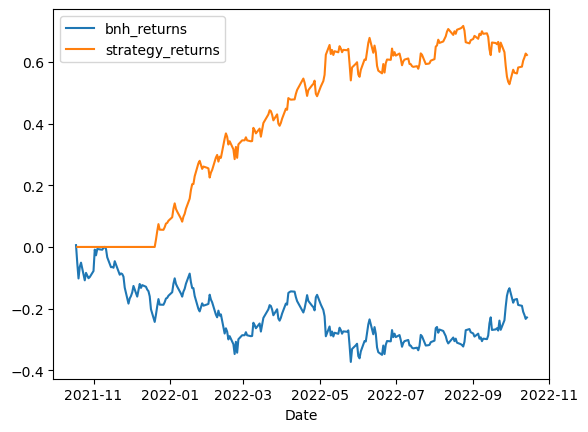

ASHAPURMIN
2022-10-14 22:54:20.448130
   Window  bnh returns  strategy returns
0      30    -0.161748          1.040341
1      22    -0.161748          1.021442
2      29    -0.161748          0.932553
3      28    -0.161748          0.932553
4      21    -0.161748          0.913654
Window: 30


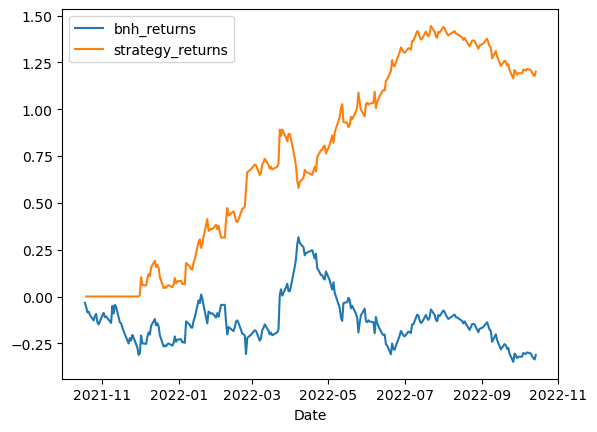

ASHIANA
2022-10-14 22:54:28.115813
   Window  bnh returns  strategy returns
0      10    -0.061492          0.033819
1      17    -0.061492          0.002176
2      18    -0.061492          0.002176
3       4    -0.061492          0.000000
4       5    -0.061492          0.000000
Window: 10


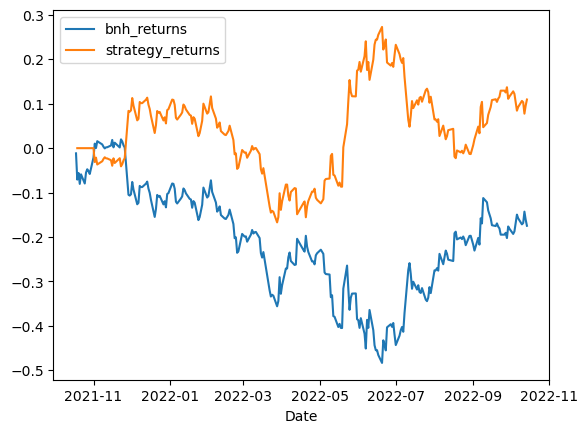

ASHIMASYN
2022-10-14 22:54:30.161603
   Window  bnh returns  strategy returns
0       7    -0.357005          0.933330
1       8    -0.357005          0.690397
2      22    -0.357005          0.557219
3      23    -0.357005          0.557219
4      20    -0.357005          0.490914
Window: 7


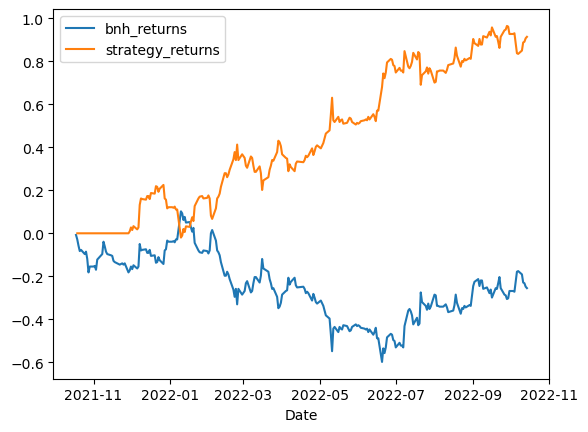

ASHOKA
2022-10-14 22:54:31.705045
   Window  bnh returns  strategy returns
0      20    -0.302882          0.494977
1      22    -0.302882          0.434905
2      24    -0.302882          0.421917
3      23    -0.302882          0.421917
4      21    -0.302882          0.416871
Window: 20


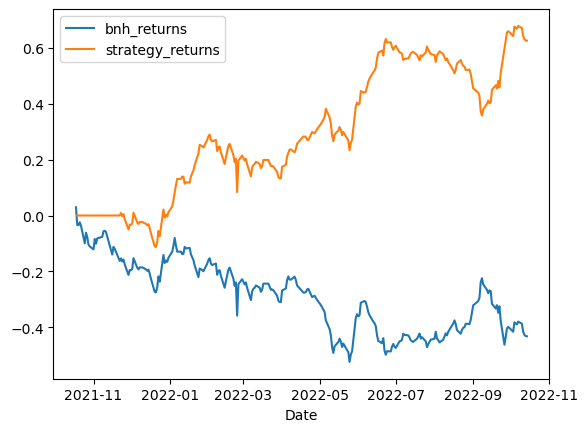

ASHOKLEY
2022-10-14 22:54:33.558236
   Window  bnh returns  strategy returns
0       7     0.097509          0.609846
1      20     0.097509          0.531610
2      25     0.097509          0.453281
3      19     0.097509          0.444889
4      23     0.097509          0.434461
Window: 7


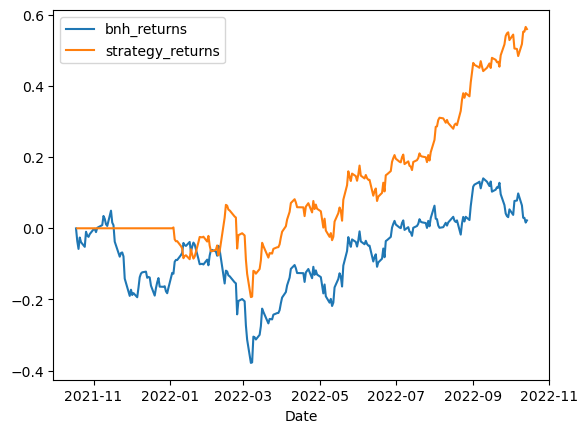

ASIANENE
2022-10-14 22:54:35.309956
   Window  bnh returns  strategy returns
0      21    -0.418576          1.049797
1      17    -0.418576          1.049797
2      16    -0.418576          1.049797
3      15    -0.418576          0.866580
4      20    -0.418576          0.810532
Window: 21


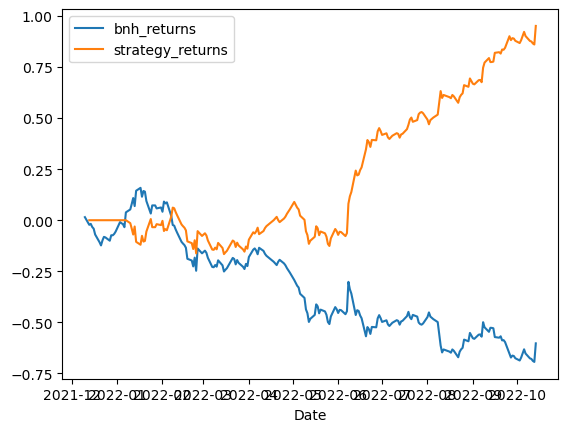

ASIANHOTNR
2022-10-14 22:54:36.748978
   Window  bnh returns  strategy returns
0      30     0.111065          0.649863
1      23     0.111065          0.649863
2      32     0.111065          0.649863
3      31     0.111065          0.649863
4      29     0.111065          0.649863
Window: 30


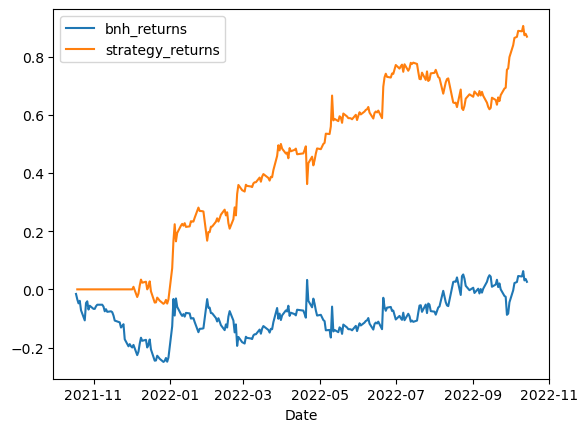

ASIANPAINT
2022-10-14 22:54:38.788976
   Window  bnh returns  strategy returns
0      10    -0.109324          0.618009
1      34    -0.109324          0.439142
2      17    -0.109324          0.426269
3      16    -0.109324          0.372785
4      54    -0.109324          0.355723
Window: 10


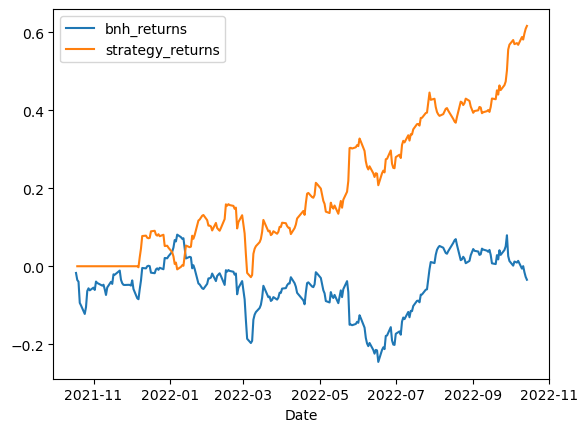

ASIANTILES
2022-10-14 22:54:40.568523
   Window  bnh returns  strategy returns
0      10    -0.846788          0.723053
1       9    -0.846788          0.723053
2      11    -0.846788          0.654546
3       8    -0.846788          0.613665
4      14    -0.846788          0.581420
Window: 10


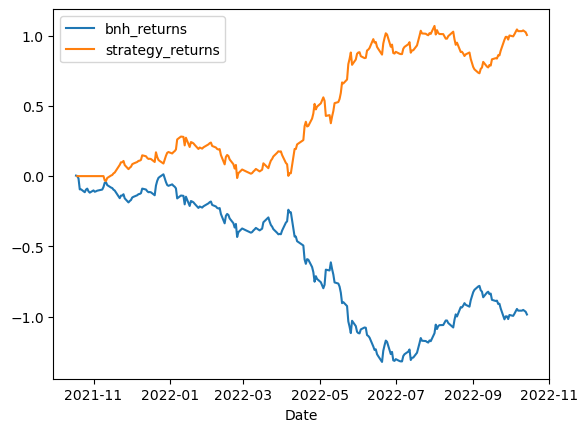

ASPINWALL
2022-10-14 22:54:42.319699
   Window  bnh returns  strategy returns
0      59     0.434048           0.35697
1      51     0.434048           0.35697
2      33     0.434048           0.35697
3      34     0.434048           0.35697
4      48     0.434048           0.35697
Window: 59


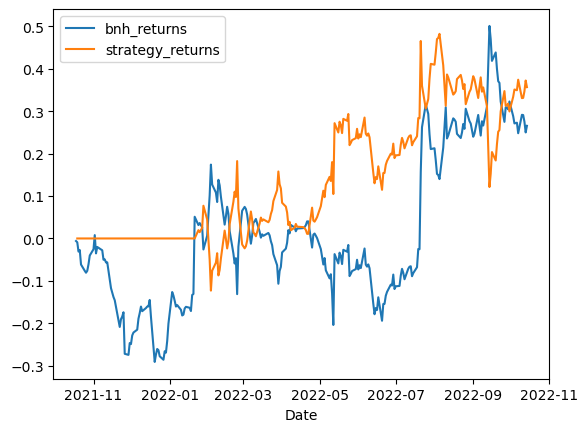

ASTEC
2022-10-14 22:54:44.116556
   Window  bnh returns  strategy returns
0      35     0.257187          1.003172
1      34     0.257187          1.003172
2      33     0.257187          1.003172
3      15     0.257187          0.971717
4      14     0.257187          0.925317
Window: 35


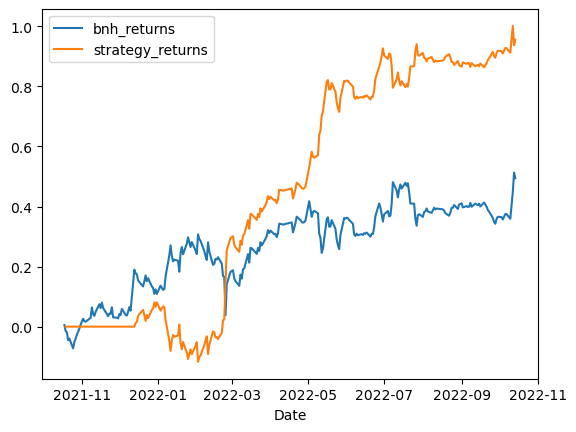

ASTERDM
2022-10-14 22:54:45.983849
   Window  bnh returns  strategy returns
0      19     0.273654          0.856128
1      18     0.273654          0.799280
2      16     0.273654          0.687589
3      20     0.273654          0.615273
4      15     0.273654          0.609602
Window: 19


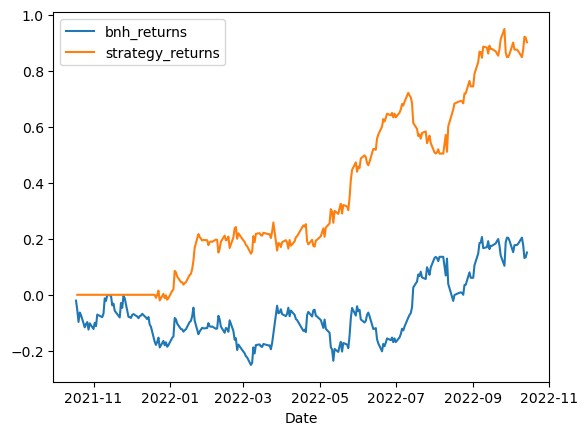

ASTRAL
2022-10-14 22:54:47.733542
   Window  bnh returns  strategy returns
0      33    -0.132211          0.209995
1      32    -0.132211          0.102558
2      36    -0.132211          0.075242
3      34    -0.132211          0.075242
4      35    -0.132211          0.075242
Window: 33


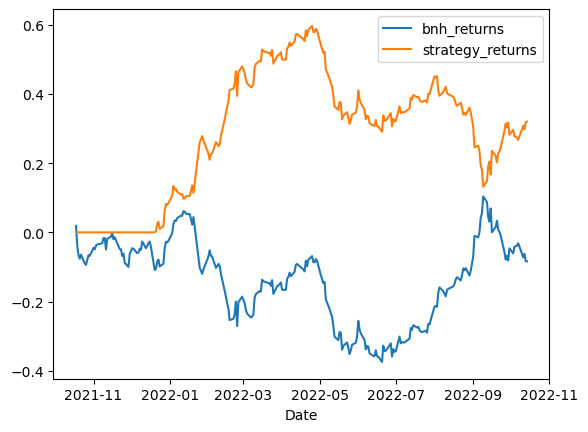

ASTRAMICRO
2022-10-14 22:54:49.454835
   Window  bnh returns  strategy returns
0      59      0.27033          0.620005
1      58      0.27033          0.620005
2      57      0.27033          0.620005
3      23      0.27033          0.505939
4      46      0.27033          0.448133
Window: 59


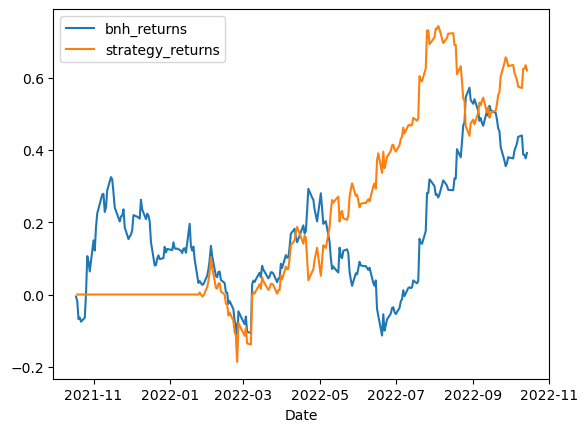

ASTRAZEN
2022-10-14 22:54:51.802343
   Window  bnh returns  strategy returns
0       8     0.005317          0.498143
1      17     0.005317          0.375501
2      16     0.005317          0.375501
3      53     0.005317          0.357752
4      52     0.005317          0.357752
Window: 8


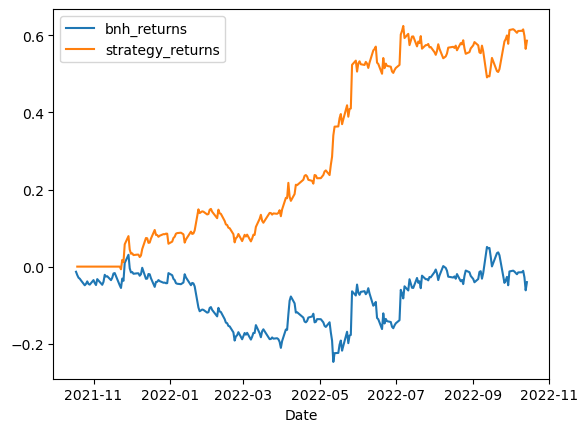

ASTRON
2022-10-14 22:54:53.584367
   Window  bnh returns  strategy returns
0      45     -0.40981          0.457569
1      58     -0.40981          0.457569
2      49     -0.40981          0.457569
3      50     -0.40981          0.457569
4      46     -0.40981          0.457569
Window: 45


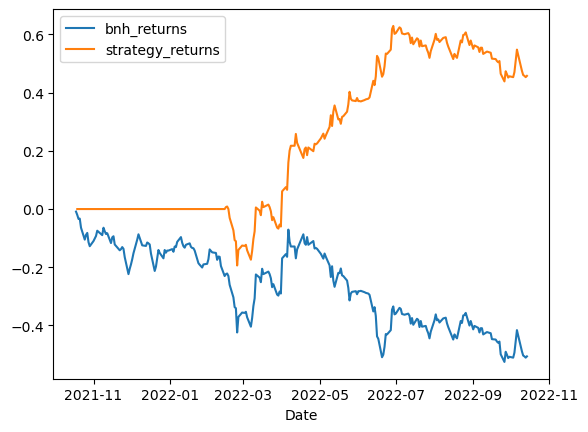

ATFL
2022-10-14 22:54:55.318762
   Window  bnh returns  strategy returns
0      14    -0.276481          0.239116
1      15    -0.276481          0.239116
2      17    -0.276481          0.201340
3      11    -0.276481          0.187988
4      34    -0.276481          0.185464
Window: 14


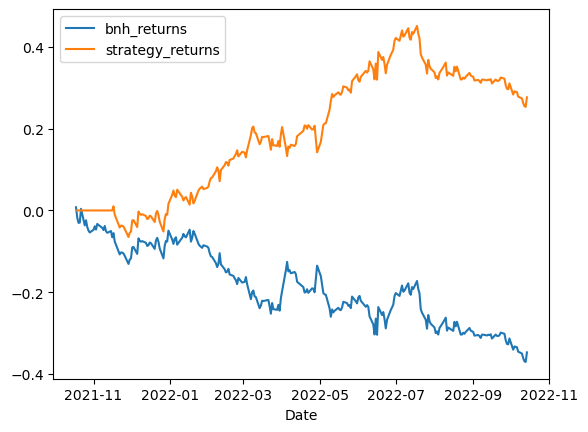

ATGL
2022-10-14 22:54:57.470977
   Window  bnh returns  strategy returns
0      29      0.21549          0.323846
1       7      0.21549          0.206202
2      59      0.21549          0.196860
3      14      0.21549          0.156718
4      23      0.21549          0.156718
Window: 29


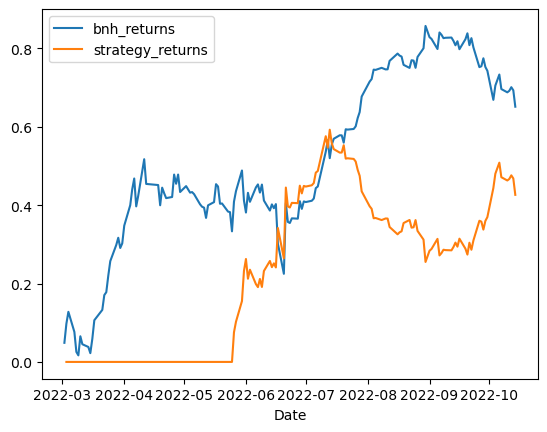

ATLANTA
2022-10-14 22:54:59.864082
   Window  bnh returns  strategy returns
0      17     0.229511          0.538473
1      18     0.229511          0.502882
2      16     0.229511          0.222064
3      15     0.229511          0.222064
4      14     0.229511          0.108719
Window: 17


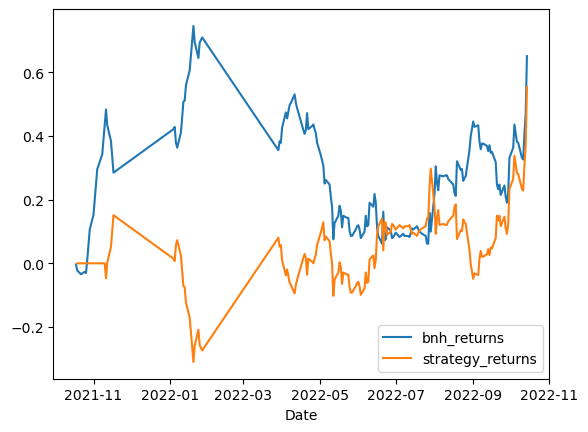

ATUL
2022-10-14 22:55:01.401592
   Window  bnh returns  strategy returns
0      43    -0.084163          0.543741
1      46    -0.084163          0.521699
2      45    -0.084163          0.521699
3      44    -0.084163          0.521699
4      42    -0.084163          0.505837
Window: 43


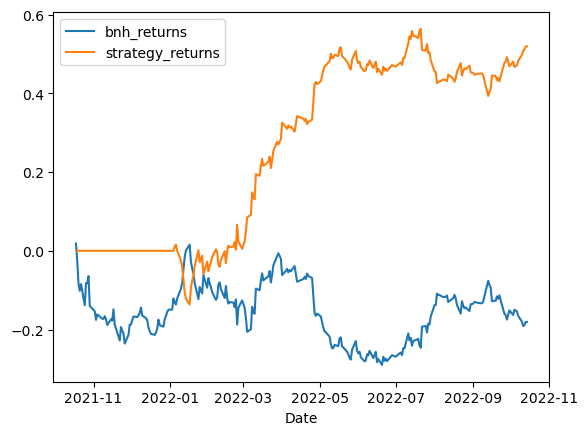

ATULAUTO
2022-10-14 22:55:03.292018
   Window  bnh returns  strategy returns
0      48     0.361161           0.19079
1      46     0.361161           0.19079
2      45     0.361161           0.19079
3      51     0.361161           0.19079
4      50     0.361161           0.19079
Window: 48


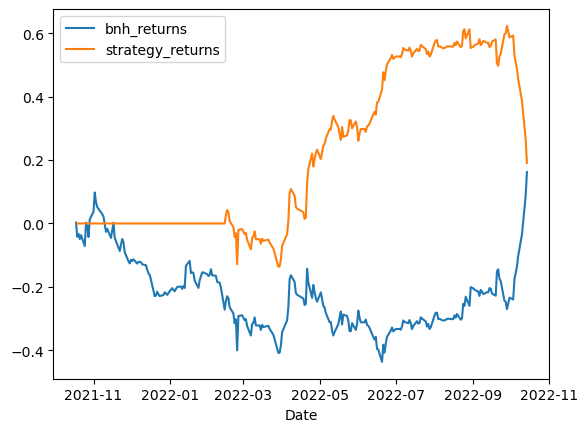

AUBANK
2022-10-14 22:55:04.997529
   Window  bnh returns  strategy returns
0      41     -0.71904          1.416976
1      40     -0.71904          1.366439
2      39     -0.71904          1.308446
3      37     -0.71904          1.269186
4      38     -0.71904          1.269186
Window: 41


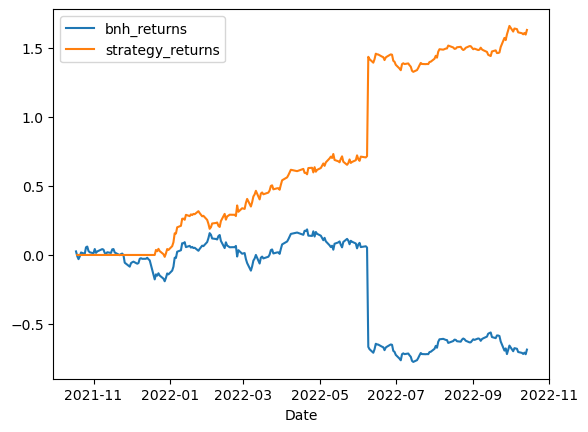

AURIONPRO
2022-10-14 22:55:07.499604
   Window  bnh returns  strategy returns
0      59     0.194416          0.671079
1      58     0.194416          0.671079
2      57     0.194416          0.671079
3      56     0.194416          0.671079
4      55     0.194416          0.671079
Window: 59


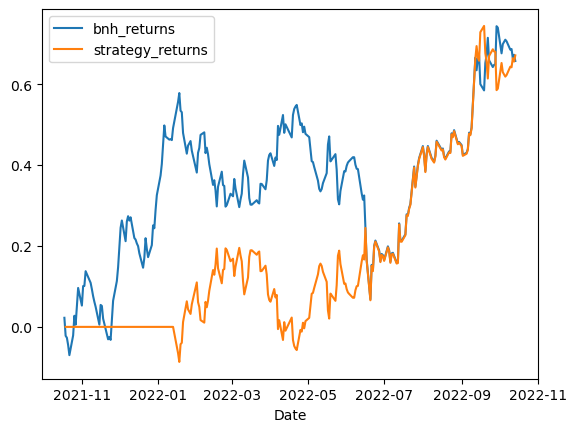

AUROPHARMA
2022-10-14 22:55:09.263968
   Window  bnh returns  strategy returns
0      38    -0.360674          0.588079
1      39    -0.360674          0.588079
2      40    -0.360674          0.588079
3      41    -0.360674          0.588079
4      37    -0.360674          0.588079
Window: 38


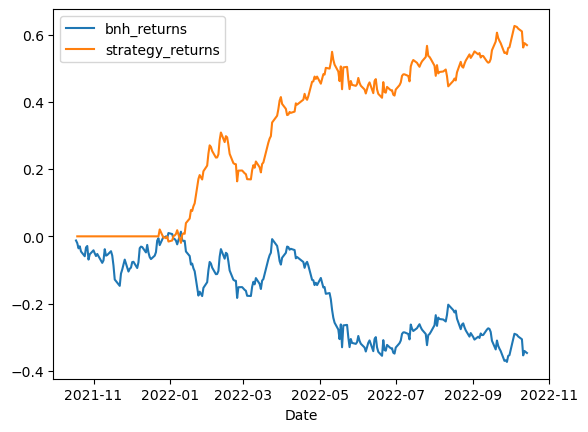

AURUM
2022-10-14 22:55:11.020573
   Window  bnh returns  strategy returns
0      44    -0.131336          1.402971
1      50    -0.131336          1.402971
2      45    -0.131336          1.402971
3      46    -0.131336          1.402971
4      47    -0.131336          1.402971
Window: 44


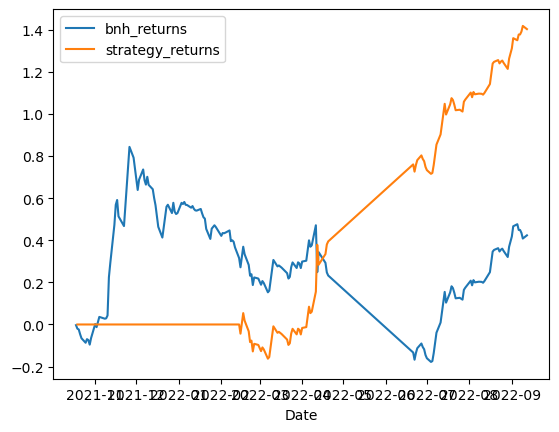

AUSOMENT
2022-10-14 22:55:12.721398
   Window  bnh returns  strategy returns
0       7     -0.06419          1.587001
1      50     -0.06419          1.366982
2      51     -0.06419          1.366982
3      49     -0.06419          1.340644
4      40     -0.06419          1.323277
Window: 7


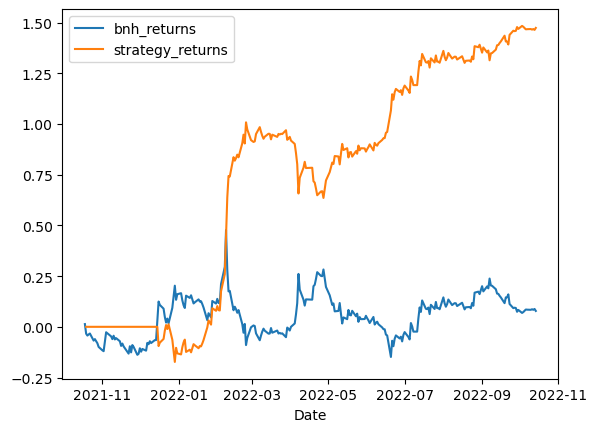

AUTOAXLES
2022-10-14 22:55:14.281713
   Window  bnh returns  strategy returns
0      24     0.268026          0.724715
1      23     0.268026          0.724715
2      22     0.268026          0.724715
3      20     0.268026          0.671334
4      21     0.268026          0.671334
Window: 24


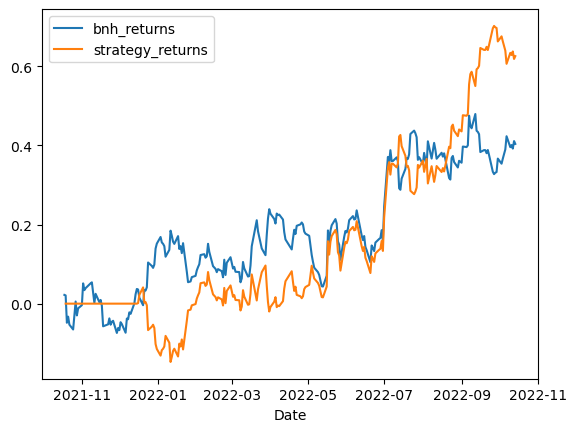

AUTOIND
2022-10-14 22:55:15.870238
   Window  bnh returns  strategy returns
0      13     0.527867          0.195781
1      12     0.527867          0.195781
2      20     0.527867          0.073660
3      21     0.527867          0.073660
4      11     0.527867          0.005960
Window: 13


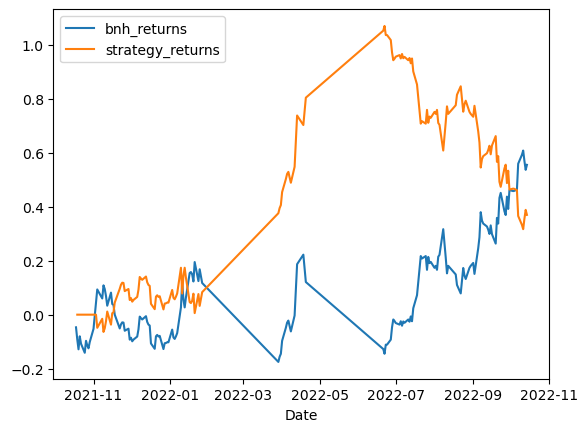

AVADHSUGAR
2022-10-14 22:55:17.401504
   Window  bnh returns  strategy returns
0      11    -0.043491          0.889560
1       9    -0.043491          0.657589
2      10    -0.043491          0.559550
3       8    -0.043491          0.557470
4      31    -0.043491          0.515228
Window: 11


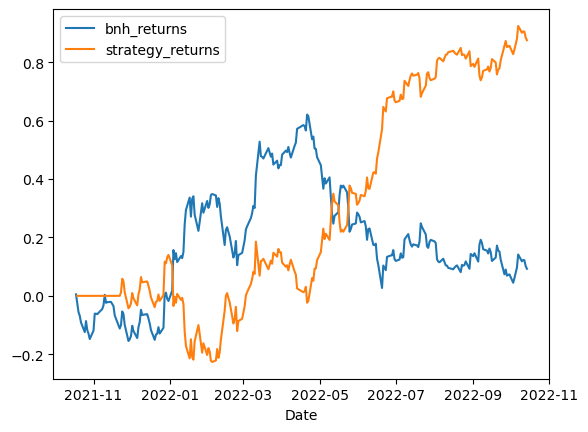

AVANTIFEED
2022-10-14 22:55:19.342726
   Window  bnh returns  strategy returns
0      59    -0.174366          0.204338
1      58    -0.174366          0.204338
2      57    -0.174366          0.204338
3      56    -0.174366          0.204338
4      55    -0.174366          0.204338
Window: 59


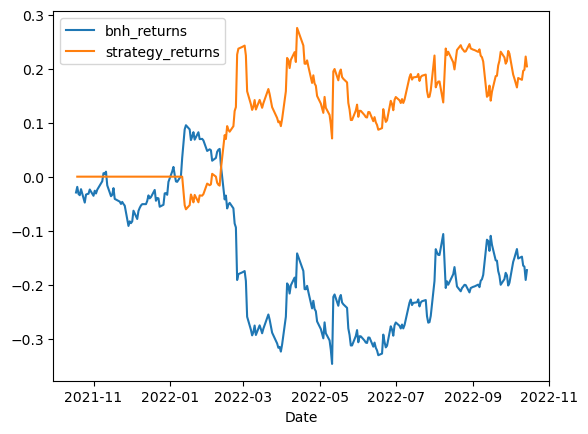

AVROIND
2022-10-14 22:55:21.329945
   Window  bnh returns  strategy returns
0      17    -0.013861          0.197724
1      21    -0.013861          0.197724
2      20    -0.013861          0.197724
3      19    -0.013861          0.197724
4      14    -0.013861          0.197724
Window: 17


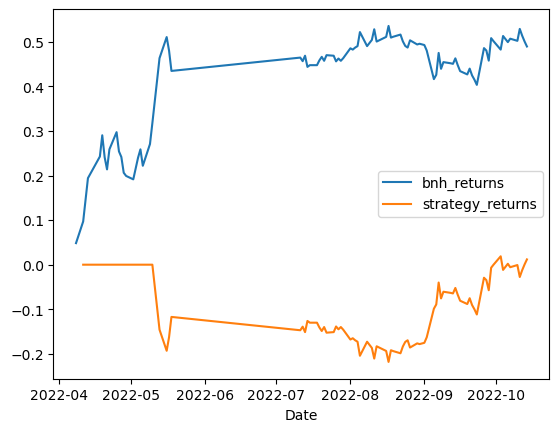

AVTNPL
2022-10-14 22:55:23.631183
   Window  bnh returns  strategy returns
0      43     0.245764          0.011372
1      44     0.245764          0.011372
2      45     0.245764          0.011372
3      46     0.245764          0.011372
4       1     0.245764          0.000000
Window: 43


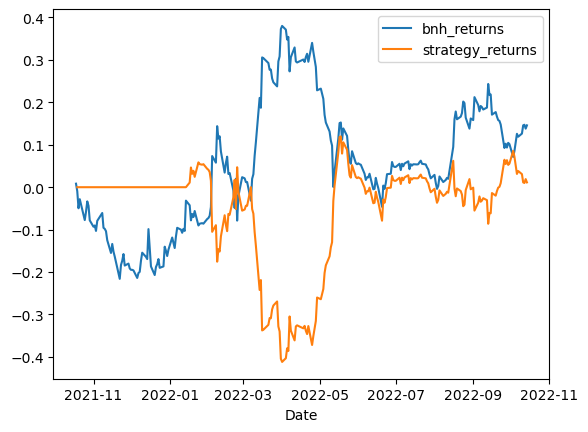

AWHCL
2022-10-14 22:55:25.384988
   Window  bnh returns  strategy returns
0      59    -0.055779          0.477255
1      40    -0.055779          0.367392
2      55    -0.055779          0.355346
3      52    -0.055779          0.355346
4      53    -0.055779          0.355346
Window: 59


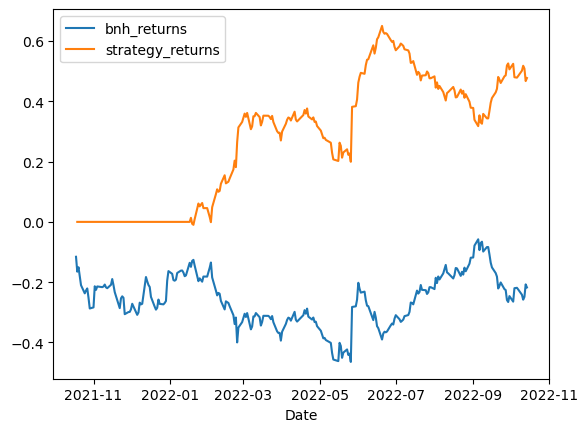

AWL
2022-10-14 22:55:27.666727
   Window  bnh returns  strategy returns
0      30    -0.110759          0.110759
1      38    -0.110759          0.110759
2      28    -0.110759          0.110759
3      29    -0.110759          0.110759
4      31    -0.110759          0.110759
Window: 30


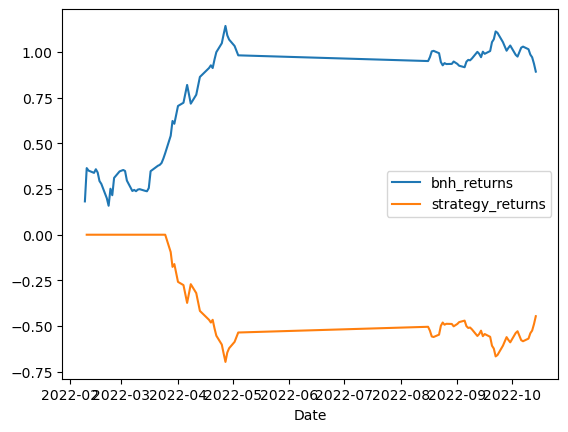

AXISBANK
2022-10-14 22:55:35.386633
   Window  bnh returns  strategy returns
0      49      0.07481          0.131400
1      48      0.07481          0.131400
2      17      0.07481          0.118975
3      58      0.07481          0.116584
4      57      0.07481          0.116584
Window: 49


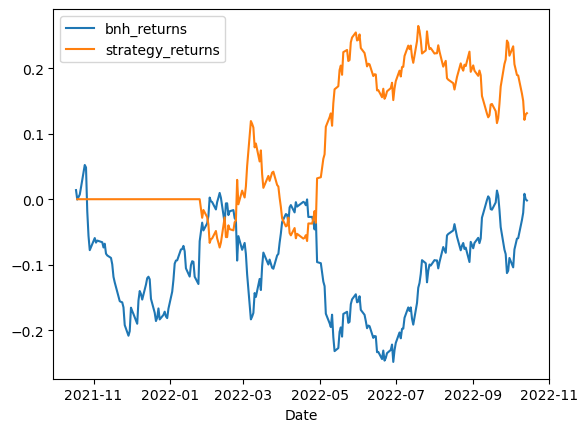

AXISCADES
2022-10-14 22:55:37.059996
   Window  bnh returns  strategy returns
0      59     0.191135          0.366873
1      58     0.191135          0.357174
2      57     0.191135          0.357174
3      56     0.191135          0.330073
4      55     0.191135          0.330073
Window: 59


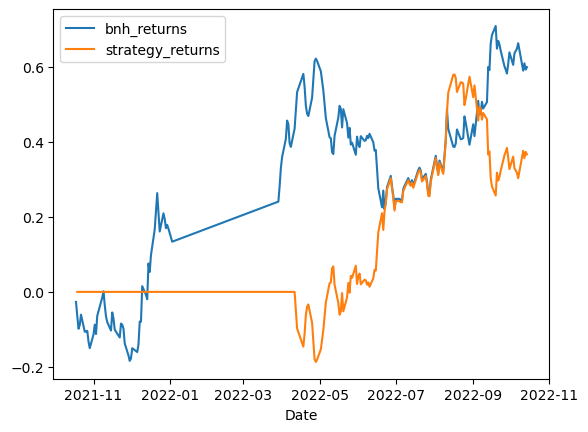

AXITA
2022-10-14 22:55:39.390773
   Window  bnh returns  strategy returns
0      20     0.123798          0.047523
1      12     0.123798          0.046201
2      19     0.123798          0.046201
3      18     0.123798          0.046201
4      16     0.123798          0.046201
Window: 20


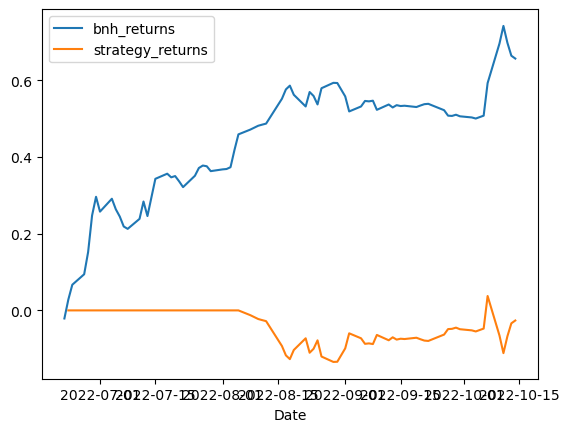

AYMSYNTEX
2022-10-14 22:55:42.283914
   Window  bnh returns  strategy returns
0       6    -0.574761          0.574761
1      30    -0.574761          0.533063
2      31    -0.574761          0.533063
3       8    -0.574761          0.531863
4      29    -0.574761          0.504670
Window: 6


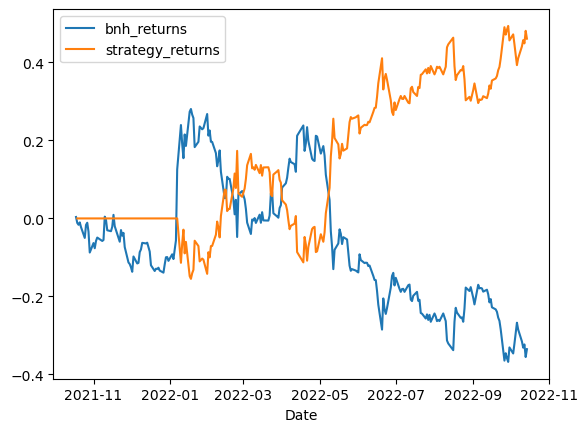

BAFNAPH
2022-10-14 22:55:44.025622
   Window  bnh returns  strategy returns
0      17    -0.128631          0.368827
1      19    -0.128631          0.368827
2      18    -0.128631          0.368827
3      16    -0.128631          0.368827
4      54    -0.128631          0.287582
Window: 17


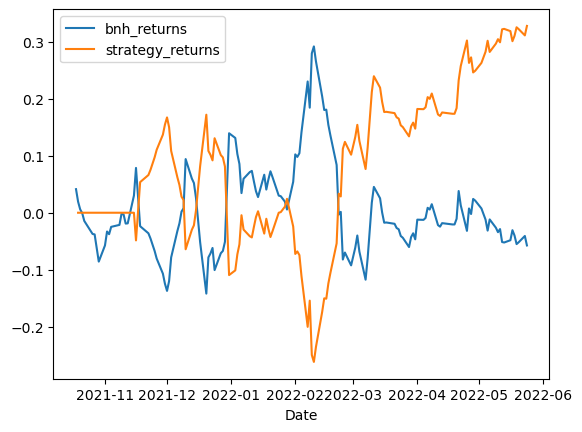

BAGFILMS
2022-10-14 22:55:46.717177
   Window  bnh returns  strategy returns
0      50     0.031499          0.164068
1      47     0.031499          0.074662
2      40     0.031499          0.074662
3      46     0.031499          0.074662
4      43     0.031499          0.074662
Window: 50


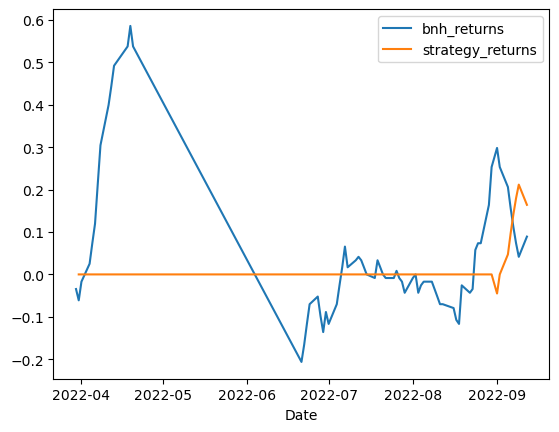

BAJAJ-AUTO
2022-10-14 22:55:48.110960
   Window  bnh returns  strategy returns
0      30      0.03866          0.448787
1      29      0.03866          0.441836
2      28      0.03866          0.441836
3      23      0.03866          0.395169
4      22      0.03866          0.395169
Window: 30


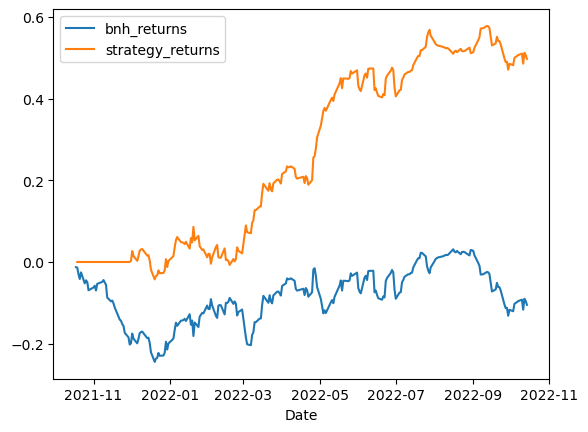

BAJAJCON
2022-10-14 22:55:49.885271
   Window  bnh returns  strategy returns
0      40    -0.240974          0.283474
1      39    -0.240974          0.283474
2      42    -0.240974          0.266752
3      41    -0.240974          0.266752
4      38    -0.240974          0.254462
Window: 40


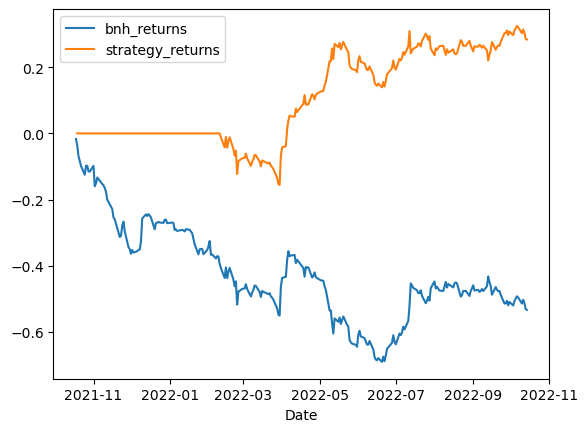

BAJAJELEC
2022-10-14 22:55:52.916642
   Window  bnh returns  strategy returns
0      41    -0.093298          0.266146
1      45    -0.093298          0.232156
2      46    -0.093298          0.232156
3      44    -0.093298          0.200180
4      42    -0.093298          0.200180
Window: 41


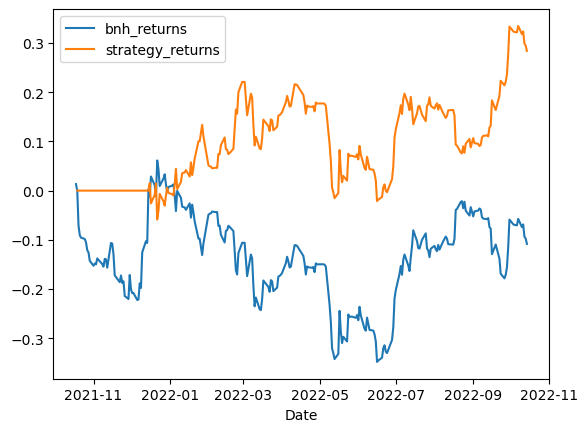

BAJAJFINSV
2022-10-14 22:55:54.623591
   Window  bnh returns  strategy returns
0       7    -2.355409          2.732186
1      10    -2.355409          2.406997
2       9    -2.355409          2.375443
3       8    -2.355409          2.375443
4      11    -2.355409          2.338949
Window: 7


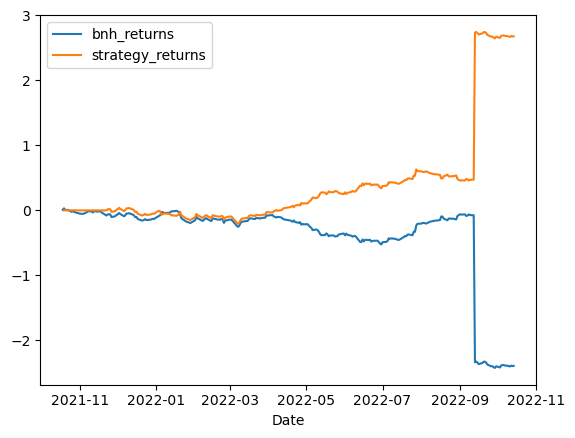

BAJAJHCARE
2022-10-14 22:55:56.852210
   Window  bnh returns  strategy returns
0      34    -0.081435          0.172136
1      35    -0.081435          0.172136
2      36    -0.081435          0.172136
3      37    -0.081435          0.172136
4      59    -0.081435          0.162590
Window: 34


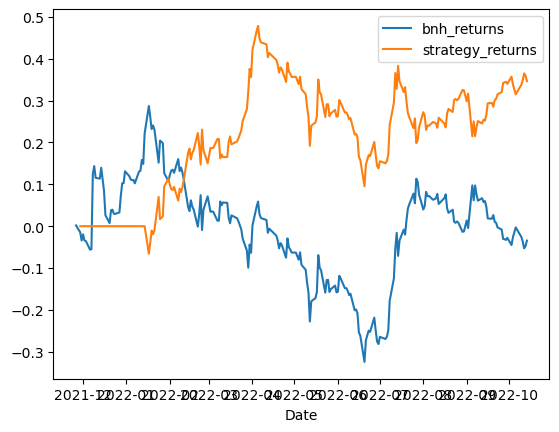

BAJAJHIND
2022-10-14 22:55:58.566686
   Window  bnh returns  strategy returns
0      42    -0.443843          1.041554
1      46    -0.443843          1.002652
2      45    -0.443843          0.995148
3      43    -0.443843          0.995148
4      44    -0.443843          0.995148
Window: 42


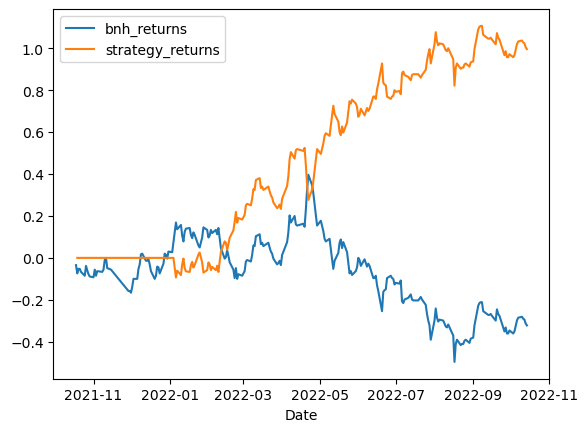

BAJAJHLDNG
2022-10-14 22:56:00.313547
   Window  bnh returns  strategy returns
0      49     0.236214          0.333515
1      33     0.236214          0.241777
2      34     0.236214          0.241777
3      35     0.236214          0.241777
4      36     0.236214          0.241777
Window: 49


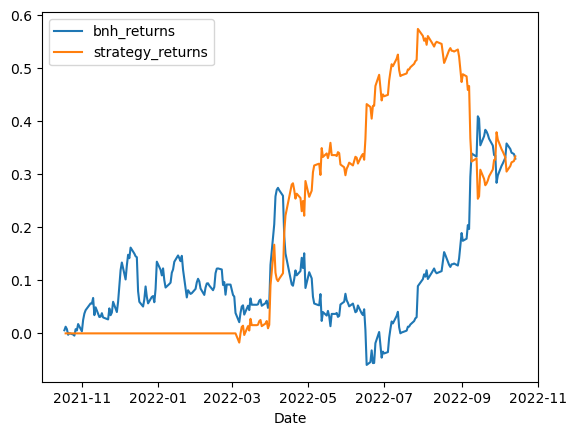

BAJFINANCE
2022-10-14 22:56:01.894854
   Window  bnh returns  strategy returns
0      39    -0.061177          0.591567
1      41    -0.061177          0.591567
2      40    -0.061177          0.591567
3      35    -0.061177          0.440616
4      49    -0.061177          0.317777
Window: 39


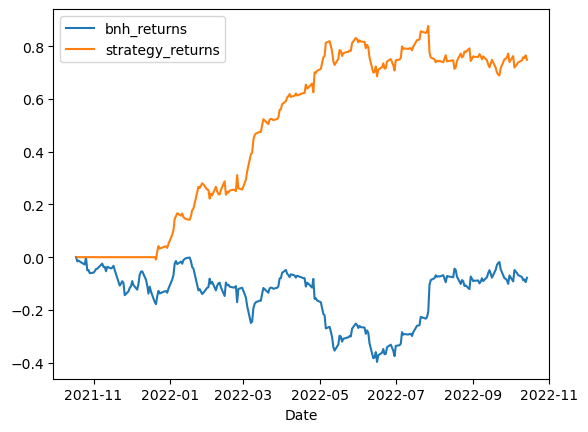

BALAJITELE
2022-10-14 22:56:03.802918
   Window  bnh returns  strategy returns
0       6    -0.276787          0.415392
1       1    -0.276787          0.000000
2       5    -0.276787          0.000000
3       2    -0.276787          0.000000
4       4    -0.276787          0.000000
Window: 6


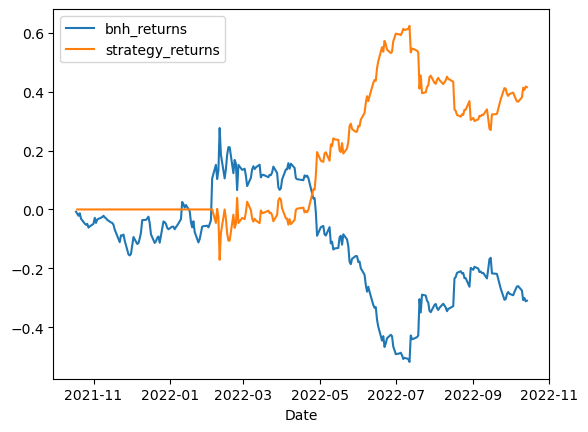

BALAMINES
2022-10-14 22:56:05.635630
   Window  bnh returns  strategy returns
0      29    -0.188649          0.632343
1      21    -0.188649          0.581834
2      27    -0.188649          0.580270
3      26    -0.188649          0.447350
4      45    -0.188649          0.441731
Window: 29


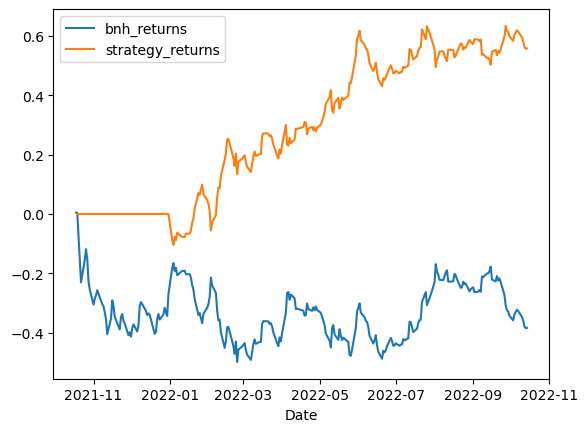

BALAXI
2022-10-14 22:56:07.449643
   Window  bnh returns  strategy returns
0      54     0.297293          0.113065
1      53     0.297293          0.113065
2      52     0.297293          0.113065
3      51     0.297293          0.113065
4      50     0.297293          0.031848
Window: 54


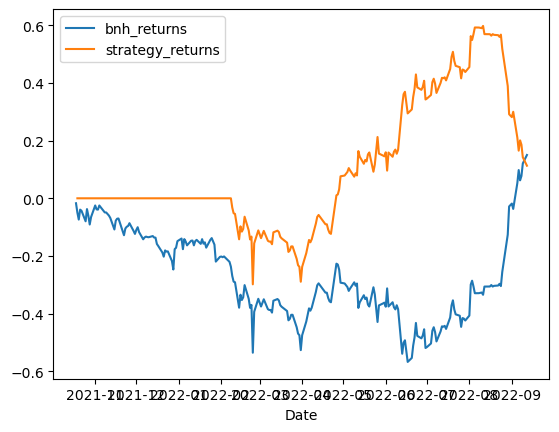

BALKRISHNA
2022-10-14 22:56:09.051283
   Window  bnh returns  strategy returns
0      35    -0.367838          0.664586
1      36    -0.367838          0.664586
2      11    -0.367838          0.649281
3      34    -0.367838          0.577787
4       8    -0.367838          0.521288
Window: 35


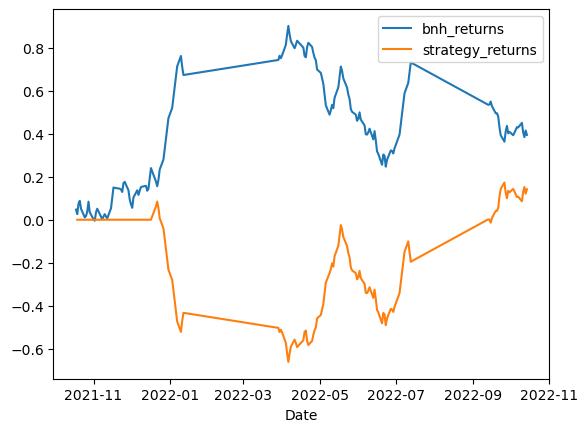

BALKRISIND
2022-10-14 22:56:10.508448
   Window  bnh returns  strategy returns
0      27    -0.235072          0.617110
1      28    -0.235072          0.506685
2      31    -0.235072          0.469416
3      33    -0.235072          0.445288
4      32    -0.235072          0.445288
Window: 27


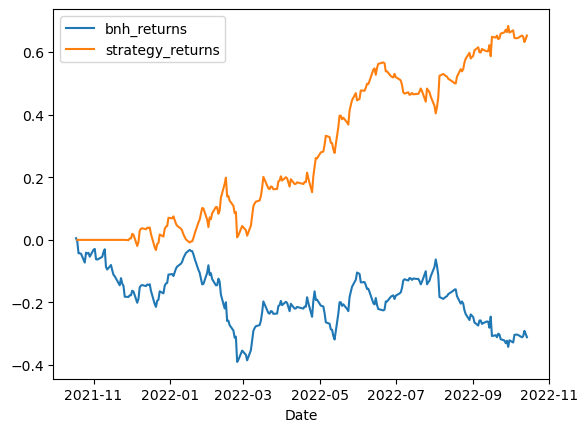

BALMLAWRIE
2022-10-14 22:56:12.278604
   Window  bnh returns  strategy returns
0      43     -0.18418          0.695081
1      44     -0.18418          0.695081
2      45     -0.18418          0.695081
3      42     -0.18418          0.654952
4      41     -0.18418          0.630020
Window: 43


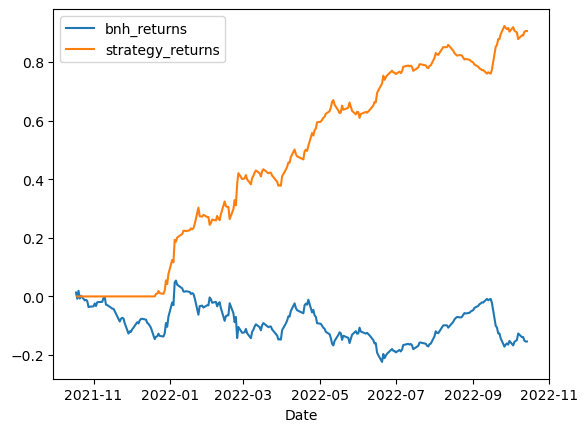

BALPHARMA
2022-10-14 22:56:14.634427
   Window  bnh returns  strategy returns
0      22    -0.250102          0.872274
1      25    -0.250102          0.872274
2      39    -0.250102          0.838915
3      38    -0.250102          0.838915
4      37    -0.250102          0.838915
Window: 22


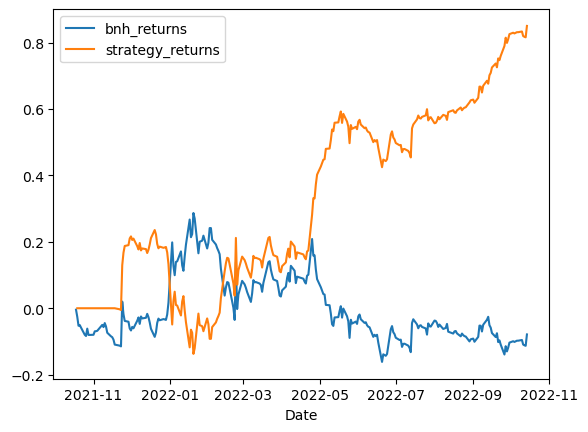

BALRAMCHIN
2022-10-14 22:56:16.439461
   Window  bnh returns  strategy returns
0       9    -0.183513          0.931887
1      10    -0.183513          0.795731
2      37    -0.183513          0.627067
3      36    -0.183513          0.627067
4      20    -0.183513          0.626603
Window: 9


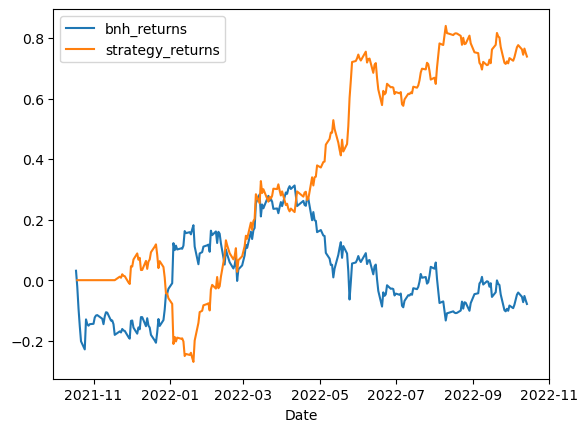

BANARBEADS
2022-10-14 22:56:18.084385
   Window  bnh returns  strategy returns
0       8    -0.059737          0.678364
1      10    -0.059737          0.628686
2      17    -0.059737          0.576964
3      13    -0.059737          0.576964
4      14    -0.059737          0.576964
Window: 8


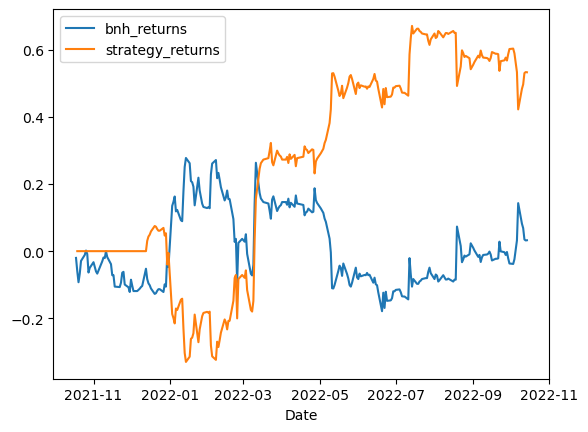

BANARISUG
2022-10-14 22:56:20.359362
   Window  bnh returns  strategy returns
0      58     0.009995          0.405606
1      59     0.009995          0.381435
2      57     0.009995          0.362301
3      56     0.009995          0.362301
4      55     0.009995          0.362301
Window: 58


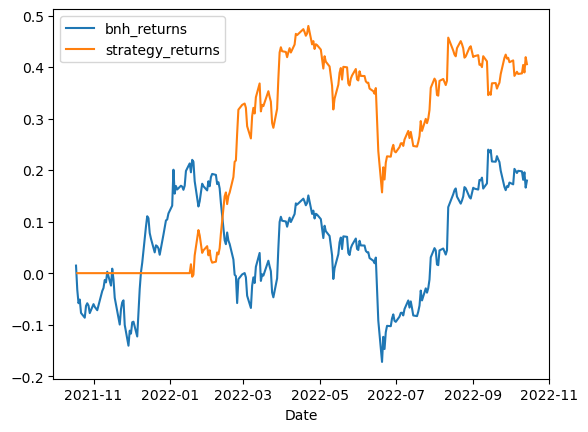

BANCOINDIA
2022-10-14 22:56:22.220333
   Window  bnh returns  strategy returns
0      16    -0.061047          0.245071
1      38    -0.061047          0.178437
2      37    -0.061047          0.178437
3      40    -0.061047          0.126306
4      39    -0.061047          0.126306
Window: 16


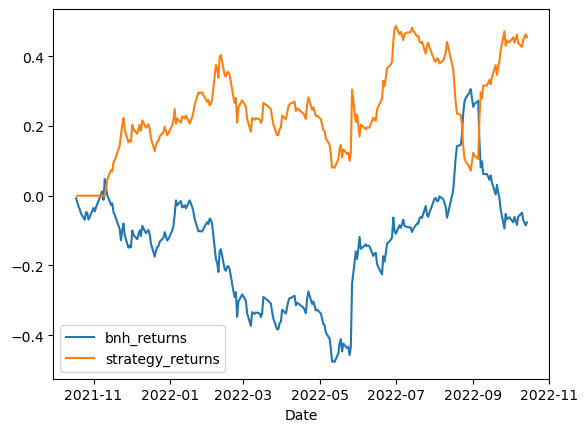

BANDHANBNK
2022-10-14 22:56:23.762413
   Window  bnh returns  strategy returns
0      40    -0.031702          0.703002
1      43    -0.031702          0.703002
2      44    -0.031702          0.703002
3      41    -0.031702          0.599815
4      42    -0.031702          0.599815
Window: 40


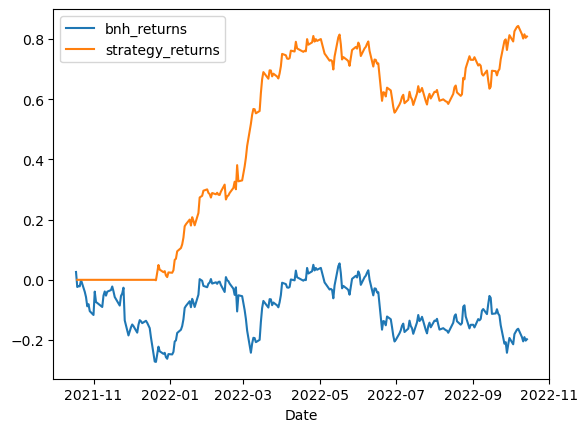

BANG
2022-10-14 22:56:25.306222
   Window  bnh returns  strategy returns
0      10     0.110584          0.606484
1      15     0.110584          0.606484
2      11     0.110584          0.606484
3      12     0.110584          0.606484
4      13     0.110584          0.606484
Window: 10


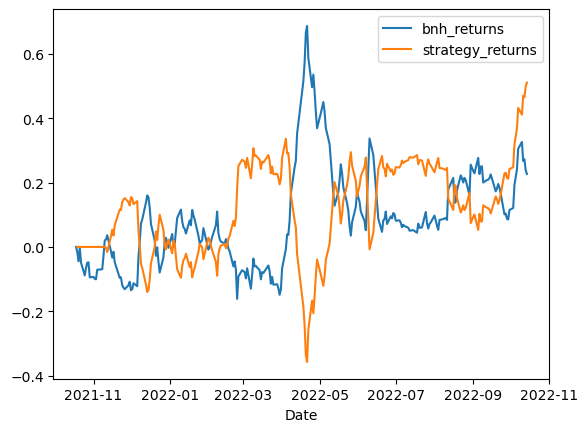

BANKA
2022-10-14 22:56:26.806148
   Window  bnh returns  strategy returns
0      13    -0.228618          0.935390
1      18    -0.228618          0.834015
2      14    -0.228618          0.834015
3      19    -0.228618          0.820004
4      11    -0.228618          0.790816
Window: 13


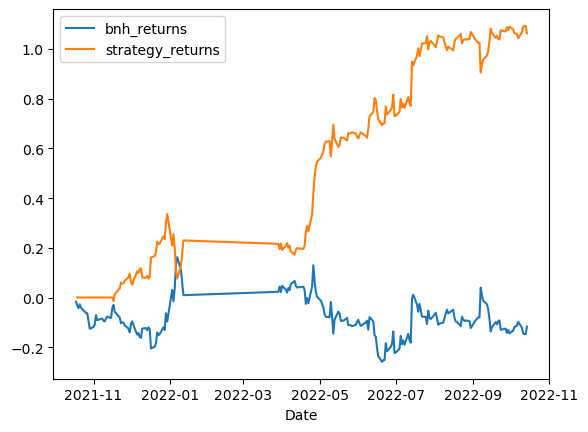

BANKBARODA
2022-10-14 22:56:28.776198
   Window  bnh returns  strategy returns
0      26     0.347572          0.465875
1      30     0.347572          0.449478
2      27     0.347572          0.399739
3      29     0.347572          0.382033
4      28     0.347572          0.382033
Window: 26


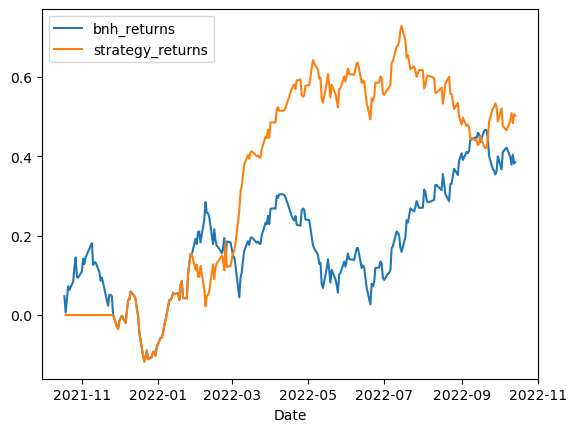

BANKINDIA
2022-10-14 22:56:30.398501
fail
BANSWRAS
2022-10-14 22:56:30.472713
fail
BARBEQUE
2022-10-14 22:56:30.478466
   Window  bnh returns  strategy returns
0       7    -0.286762          0.706178
1       8    -0.286762          0.644924
2      10    -0.286762          0.456838
3       9    -0.286762          0.455415
4      12    -0.286762          0.245306
Window: 7


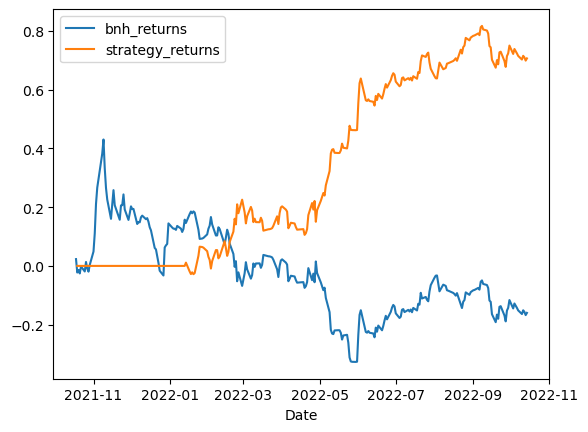

BARTRONICS
2022-10-14 22:56:32.974838


In [ ]:
nse = Nse()
all_stock_codes = nse.get_stock_codes()
for i,_ in all_stock_codes.items():
    print(i) 
    _end_date = dt.datetime.today()
    print(_end_date)
    _days = 365
    try:
        Bollinger = BollingerBandBacktester(symbol=i, end = _end_date, days = _days)
        Bollinger.optimize_bollinger_band_parameters(range(1, 60, 1))
        Bollinger.plot_optimized_bollinger_strategy_returns()
    except:
        print('fail')


In [ ]:
Bollinger.create_simple_tear_sheet()